# **Analysis of League of Legends ARAM Games**

## **Mission Statment**

#### To perform exploratory data analysis on ARAM games
#### These games are general population (using all games in the dataset) and people in my games (my solo q games) and my friend group (only games where my friends are in aka not playing solo)

## Load Libaries

In [1]:
import psycopg2 
import pandas as pd
import numpy as np;
import matplotlib.pyplot as plt
import seaborn as sns

# Set display option to show all columns
pd.set_option('display.max_columns', None)

# Code to ignore warnings from function usage
import warnings;
warnings.filterwarnings('ignore')

# To scale the data using z-score 
from sklearn.preprocessing import StandardScaler

# Importing PCA and t-SNE
from sklearn.decomposition import PCA

from sklearn.manifold import TSNE

from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering

import scipy.stats as stats

from sklearn.metrics import silhouette_score

# used for network analysis
import networkx as nx
from decorator import decorator
from networkx.utils import create_random_state, create_py_random_state
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
import plotly.graph_objs as go
import plotly
import plotly.express as px
init_notebook_mode(connected=True)



## Loading data from postgresql database

In [2]:
# Establish a connection to the PostgreSQL database
try:
    # Establish a connection to the PostgreSQL database
    connection = psycopg2.connect(
        host='localhost',
        database='leagueoflegendsapidata',
        user='postgres',
        password='naruto789',
        port=5432
    )
    print("Connected to the database")

    # Join the tables and retrieve data
    query = """
    SELECT pm.*, p.summoner_name, m.*
    FROM playerMatches AS pm
    JOIN player AS p ON pm.puuid = p.puuid
    JOIN matches AS m ON pm.match_id = m.match_id;
    """

    # Create a DataFrame from the query result
    dataframe = pd.read_sql_query(query, connection)

    # Close the database connection
    connection.close()
    print("Connection closed")

except psycopg2.Error as e:
    print("Error connecting to the database:", e)

Connected to the database
Connection closed


In [3]:
dataframe.head()

,puuid,match_id,assists,baronkills,bountylevel,champexperience,champlevel,championid,championname,championtransform,consumablespurchased,damagedealttobuildings,damagedealttoobjectives,damagedealttoturrets,damageselfmitigated,deaths,detectorwardsplaced,doublekills,dragonkills,firstbloodassist,firstbloodkill,firsttowerassist,firsttowerkill,gameendedinearlysurrender,gameendedinsurrender,goldearned,goldspent,individualposition,inhibitorkills,inhibitortakedowns,inhibitorslost,item0,item1,item2,item3,item4,item5,item6,itemspurchased,killingsprees,kills,lane,largestcriticalstrike,largestkillingspree,largestmultikill,longesttimespentliving,magicdamagedealt,magicdamagedealttochampions,magicdamagetaken,neutralminionskilled,nexuskills,nexustakedowns,nexuslost,objectivesstolen,objectivesstolenassists,participantid,pentakills,physicaldamagedealt,physicaldamagedealttochampions,physicaldamagetaken,profileicon,quadrakills,riotidname,riotidtagline,champion_role,sightwardsboughtingame,spell1casts,spell2casts,spell3casts,spell4casts,summoner1casts,summoner1id,summoner2casts,summoner2id,summonerid,summonerlevel,summonername,teamearlysurrendered,teamid,teamposition,timeccingothers,timeplayed,totaldamagedealt,totaldamagedealttochampions,totaldamageshieldedonteammates,totaldamagetaken,totalheal,totalhealsonteammates,totalminionskilled,totaltimeccdealt,totaltimespentdead,totalunitshealed,triplekills,truedamagedealt,truedamagedealttochampions,truedamagetaken,turretkills,turrettakedowns,turretslost,unrealkills,visionscore,visionwardsboughtingame,wardskilled,wardsplaced,win,summoner_name,match_id,dataversion,participants,game_creation,game_duration,game_end_time_stamp,game_id,game_mode,game_name,game_start_time_stamp,game_type,game_version,map_id,platform_id,queue_id,winning_team_id,losing_team_id
0,MySH6_h5T3ltsTtXN2njZIud-IKRjay3IjS4NI-4qjscrL...,NA1_4715743788,33,0,1,23403,18,240,Kled,False,0,969,969,969,85844,16,0,0,0,True,False,False,False,False,False,15278,13900,Invalid,0,1,3,3084,3111,3075,3068,6333,1053,2052,20,2,10,TOP,33,2,1,127,26668,5156,8555,0,0,0,1,0,0,1,0,33380,18019,54357,4404,0,,,SUPPORT,0,63,0,37,7,3,4,8,7,F6UG3PzbrW5iV8h7n6p_9Ml5LxmvYaHUM6gmqVvsYvu1dTg,166,swagmastermlg,False,100,,9,1287,60657,23783,0,74848,5869,604,38,45,392,5,0,607,607,11935,0,1,4,0,0,0,0,0,False,swagmastermlg,NA1_4715743788,2,[MySH6_h5T3ltsTtXN2njZIud-IKRjay3IjS4NI-4qjscr...,1689636119973,1287,2023-07-17 16:44:04.487000,4715743788,ARAM,teambuilder-match-4715743788,2023-07-17 16:22:37.131000,MATCHED_GAME,13.13.518.539,12,NA1,450,200,100
1,gXiOFFbZsJEs0FzWlIzGZUhRV3t7j0UXV5HyBhnhdYcHy8...,NA1_4715743788,27,0,0,25172,18,105,Fizz,False,0,2626,2626,2626,20213,15,0,4,0,True,False,False,False,False,False,17588,17485,Invalid,1,1,3,6655,3020,3100,3157,4645,3089,2052,23,6,20,JUNGLE,0,7,2,125,89362,38699,4733,0,0,0,1,0,0,5,0,10626,3655,24241,4496,0,,,NONE,0,32,61,102,15,19,32,6,4,i0dJm6lyzXFp5vYxPaUW6Mm_TN_NLahkwN9DyvTuAjzT2CQ,235,H2N0,False,100,,18,1287,108162,44947,0,31812,1481,0,65,104,366,1,0,8173,2593,2837,0,2,4,0,0,0,0,0,False,H2N0,NA1_4715743788,2,[MySH6_h5T3ltsTtXN2njZIud-IKRjay3IjS4NI-4qjscr...,1689636119973,1287,2023-07-17 16:44:04.487000,4715743788,ARAM,teambuilder-match-4715743788,2023-07-17 16:22:37.131000,MATCHED_GAME,13.13.518.539,12,NA1,450,200,100
2,Y7r8oesFeyYvD9O689uJ2tK8g4U9o19uziCaFFvlDn6upz...,NA1_4715743788,55,0,0,26231,18,412,Thresh,False,1,1039,1039,1039,40131,13,0,0,0,False,False,True,False,False,False,15377,14915,Invalid,1,2,1,2051,3121,6662,3111,3748,3071,2052,14,1,9,MIDDLE,0,2,1,110,23905,16751,24545,0,0,0,0,0,0,6,0,10938,4920,18385,18,0,,,SUPPORT,0,57,41,44,11,9,3,28,32,qP25_uNzEnc60NNw6tymp_9GrEVDCkZ2HjUbJfXYNALf8jo,360,Treebéard,False,200,,81,1287,36106,22844,5117,46422,1663,0,12,958,354,1,0,1262,1172,3490,0,2,2,0,0,0,0,0,True,treebéard,NA1_4715743788,2,[MySH6_h5T3ltsTtXN2njZIud-IKRjay3IjS4NI-4qjscr...,1689636119973,1287,2023-07-17 16:44:04.487000,4715743788,ARAM,teambuilder-match-4715743788,2023-07-17 16:22:37.131000,MATCHED_GAME,13.13.518.539

Make a copy of the data

In [3]:
df = dataframe.copy()

In [19]:
df.head()

,puuid,match_id,assists,baronkills,bountylevel,champexperience,champlevel,championid,championname,championtransform,consumablespurchased,damagedealttobuildings,damagedealttoobjectives,damagedealttoturrets,damageselfmitigated,deaths,detectorwardsplaced,doublekills,dragonkills,firstbloodassist,firstbloodkill,firsttowerassist,firsttowerkill,gameendedinearlysurrender,gameendedinsurrender,goldearned,goldspent,individualposition,inhibitorkills,inhibitortakedowns,inhibitorslost,item0,item1,item2,item3,item4,item5,item6,itemspurchased,killingsprees,kills,lane,largestcriticalstrike,largestkillingspree,largestmultikill,longesttimespentliving,magicdamagedealt,magicdamagedealttochampions,magicdamagetaken,neutralminionskilled,nexuskills,nexustakedowns,nexuslost,objectivesstolen,objectivesstolenassists,participantid,pentakills,physicaldamagedealt,physicaldamagedealttochampions,physicaldamagetaken,profileicon,quadrakills,riotidname,riotidtagline,champion_role,sightwardsboughtingame,spell1casts,spell2casts,spell3casts,spell4casts,summoner1casts,summoner1id,summoner2casts,summoner2id,summonerid,summonerlevel,summonername,teamearlysurrendered,teamid,teamposition,timeccingothers,timeplayed,totaldamagedealt,totaldamagedealttochampions,totaldamageshieldedonteammates,totaldamagetaken,totalheal,totalhealsonteammates,totalminionskilled,totaltimeccdealt,totaltimespentdead,totalunitshealed,triplekills,truedamagedealt,truedamagedealttochampions,truedamagetaken,turretkills,turrettakedowns,turretslost,unrealkills,visionscore,visionwardsboughtingame,wardskilled,wardsplaced,win,summoner_name,match_id,dataversion,participants,game_creation,game_end_time_stamp,game_id,game_mode,game_name,game_start_time_stamp,game_type,game_version,map_id,platform_id,queue_id,winning_team_id,losing_team_id,game_duration_minutes
0,_VbE0FG5iiRPGTdSOQ0cGgMU4xmE5csj3vD38l1ODSwj1A...,NA1_4752278705,20,0,0,14129,15,82,Mordekaiser,False,2,0,0,0,28614,16,0,1,0,False,False,False,False,False,False,9278,8335,Invalid,0,0,1,4633,3111,3116,1011,1052,0,2052,15,1,4,NONE,0,2,2,114,26119,15005,9918,0,0,0,1,0,0,1,0,2227,1201,24404,5841,0,,,SUPPORT,0,71,22,36,6,3,4,6,7,VJrieq_JcokuOngSfM3LctBNtO-SeelbMUGq5-0tcSK7Fa0,362,TeddyAppa,False,100,,18,956,30205,17902,0,37532,6032,351,18,114,316,4,0,1858,1696,3210,0,0,4,0,0,0,0,0,False,teddyappa,NA1_4752278705,2,[_VbE0FG5iiRPGTdSOQ0cGgMU4xmE5csj3vD38l1ODSwj1...,1692600751329,2023-08-21 00:08:41.737000,4752278705,ARAM,teambuilder-match-4752278705,2023-08-20 23:52:45.557000,MATCHED_GAME,13.16.525.6443,12,NA1,450,200,100,15.933333
1,e9yJ8Ce3AGE9PKurPqjs6X6P66N9x5JPOdnHZJ0JOw2kEg...,NA1_4754000845,26,0,2,16157,16,42,Corki,False,0,2248,2248,2248,9936,6,0,3,0,False,False,False,False,False,False,13511,12000,Invalid,0,2,0,6655,3042,3074,3020,4630,0,2052,14,5,14,NONE,0,4,3,281,47266,20355,4421,0,0,0,0,0,0,2,0,8549,4073,10552,923,0,,,SUPPORT,0,48,25,37,77,4,4,10,32,9vrr-u0aFbitEmviYxoSCuGqHl4PSHMpZoD2LwcYLtvHhY4,245,Cadrel,False,100,,1,918,56047,24661,0,17846,1557,0,30,11,162,1,1,232,232,2872,2,3,1,0,0,0,0,0,True,Cadrel,NA1_4754000845,2,[ejVEJr2hi9ZH0Y0ZBkaOIowM72-1c250uZkyQfS1hEGgS...,1692772742958,2023-08-22 23:55:37.383000,4754000845,ARAM,teambuilder-match-4754000845,2023-08-22 23:40:19.349000,MATCHED_GAME,13.16.525.6443,12,NA1,450,100,200,15.300000
2,vFxoBOhSQ0d1UMf1lE_LkAPsvgfXG6DVPGvF2VAPNYMGNO...,NA1_4754000845,11,0,0,14852,16,105,Fizz,False,0,2002,2002,2002,5225,8,0,1,0,False,False,False,False,False,False,10255,9035,Invalid,0,1,0,6655,3020,3089,3057,1052,0,2052,9,3,9,NONE,0,3,2,143,18611,12574,2126,0,0,0,0,0,0,4,0,2722,2159,10593,3788,0,,,SUPPORT,0,30,25,34,8,4,4,4,14,1yqa3QLxbiI3VW011v6xRNgN_LivDZDjmW481oihgm1WAkU,209,YuSurrenderFirst,False,100,,6,918,21733,15133,0,13295,404,0,11,26,184,1,0,399,399,576,0,2,1,0,0,0,0,0,True,yusurrenderfirst,NA1_4754000845,2,[ejVEJr2hi9ZH0Y0ZBkaOIowM72-1c250uZkyQfS1hEGgS...,1692772742958,2023-08-22 23:55:37.383000,4754000845,ARAM,teambuilder-match-4754000845,2023-08-22 23:40:19.349000,MATCHED_GAME,13.16.525.6443,12,NA1,450,

## Data preprocessing

#### As I go through the project, I might want to transform the data in some way and ill add them here as they come in

**NOTE** - game_duration is in seconds which makes it hard to read so lets create a new column called game_duration_minutes for better visualisation

In [4]:
# Convert game duration to minutes
df['game_duration_minutes'] = df['game_duration'] / 60

In [5]:
# Drop the original 'participants' column
df.drop(columns=['game_duration'], inplace=True)

In [6]:
# Convert the 'participants' column to a DataFrame
participants_df = df['participants'].apply(pd.Series)

# Concatenate the new participant columns to the original DataFrame
df = pd.concat([df, participants_df], axis=1)

# Drop the original 'participants' column
df.drop(columns=['participants'], inplace=True)

In [7]:
# Standardize the summonerName column to lowercase
df['summoner_name'] = df['summoner_name'].str.lower()

In [8]:
# Remove duplicate columns pandas DataFrame
df = df.loc[:,~df.columns.duplicated()]

In [12]:
df.head()

,puuid,match_id,assists,baronkills,bountylevel,champexperience,champlevel,championid,championname,championtransform,consumablespurchased,damagedealttobuildings,damagedealttoobjectives,damagedealttoturrets,damageselfmitigated,deaths,detectorwardsplaced,doublekills,dragonkills,firstbloodassist,firstbloodkill,firsttowerassist,firsttowerkill,gameendedinearlysurrender,gameendedinsurrender,goldearned,goldspent,individualposition,inhibitorkills,inhibitortakedowns,inhibitorslost,item0,item1,item2,item3,item4,item5,item6,itemspurchased,killingsprees,kills,lane,largestcriticalstrike,largestkillingspree,largestmultikill,longesttimespentliving,magicdamagedealt,magicdamagedealttochampions,magicdamagetaken,neutralminionskilled,nexuskills,nexustakedowns,nexuslost,objectivesstolen,objectivesstolenassists,participantid,pentakills,physicaldamagedealt,physicaldamagedealttochampions,physicaldamagetaken,profileicon,quadrakills,riotidname,riotidtagline,champion_role,sightwardsboughtingame,spell1casts,spell2casts,spell3casts,spell4casts,summoner1casts,summoner1id,summoner2casts,summoner2id,summonerid,summonerlevel,summonername,teamearlysurrendered,teamid,teamposition,timeccingothers,timeplayed,totaldamagedealt,totaldamagedealttochampions,totaldamageshieldedonteammates,totaldamagetaken,totalheal,totalhealsonteammates,totalminionskilled,totaltimeccdealt,totaltimespentdead,totalunitshealed,triplekills,truedamagedealt,truedamagedealttochampions,truedamagetaken,turretkills,turrettakedowns,turretslost,unrealkills,visionscore,visionwardsboughtingame,wardskilled,wardsplaced,win,summoner_name,dataversion,game_creation,game_end_time_stamp,game_id,game_mode,game_name,game_start_time_stamp,game_type,game_version,map_id,platform_id,queue_id,winning_team_id,losing_team_id,game_duration_minutes,0,1,2,3,4,5,6,7,8,9
0,e_vN4v5Zoizgr3muGnuNf9ekUWjUPbLOLks6wMk3Fg9ae3...,NA1_4754043116,41,0,2,23396,18,53,Blitzcrank,False,0,425,425,425,42345,9,0,1,0,False,False,True,False,False,True,13122,9900,Invalid,0,0,0,3111,6656,3083,3075,1029,0,2052,15,2,8,NONE,23,2,2,170,26437,16044,17691,0,0,0,0,0,0,6,0,7244,4683,20550,5929,0,,,SUPPORT,0,46,34,51,25,27,32,5,4,Lhx53kViPm7QtsH3Zow4ts_wjMiEu5jLP2CBBhe0E06z7GM,504,0hMyBuddha,False,200,,80,1140,35196,22242,0,38964,2384,1109,14,171,210,5,0,1514,1514,722,0,2,1,0,0,0,0,0,True,0hmybuddha,2,1692778539967,2023-08-23 01:35:06.847000,4754043116,ARAM,teambuilder-match-4754043116,2023-08-23 01:16:06.451000,MATCHED_GAME,13.16.525.6443,12,NA1,450,200,100,19.000000,Y7r8oesFeyYvD9O689uJ2tK8g4U9o19uziCaFFvlDn6upz...,wzGJp7Vprk1SsmbflPOb7X-FA0wm52_oPXmUISvOU6GaZR...,NihBgpQsrCcnk-cNOPjx12FEutd_Nln-38TZNRKhSVKUbb...,RqM8_E4yKQ-cecwcU4-kNXKeT1mEJRerUuQvbaU3J1Y5FE...,OhCgcjeHlnVNePI2CYCa5Ar3mtCZyJiXMDJhrGtmQeqpQr...,e_vN4v5Zoizgr3muGnuNf9ekUWjUPbLOLks6wMk3Fg9ae3...,VEmnYN3kWf51c2v-x79VM5BLOC5digQfAKExHCcAx2lyVS...,gMpNK4b4zxUeYuBrYrmW1H5NWl7_f1xq2mMXsRZi8SZVyq...,aLTn9kPEnZ_qDY-bj0icR1vvkXCJI3Dz1d_i4X8tCHCydO...,Tz7zlABIpL-sY5NJ4NaRLv8IRaQ_qv_y56GzuFDjgAI7it...
1,aWOLEysam46r2g1U06teuyn3bhodJmgp5u2mxzyDPo4b5Y...,NA1_4755624056,24,0,0,21513,18,57,Maokai,False,0,915,915,915,13901,5,0,0,0,False,False,False,False,False,False,14563,13700,Invalid,0,1,0,3040,6653,3020,3135,3089,0,2052,16,3,8,MIDDLE,0,3,1,355,50927,21945,8457,0,0,0,0,0,0,7,0,4627,510,8791,4327,0,,,SUPPORT,0,29,20,86,8,7,32,4,4,OGyjKMb1l2wFzGzRytTHBNaQbxxhMn4qzEMov0uR04pbHUs,309,Zukshin,False,200,,60,1327,56861,23477,0,18343,4407,0,29,365,148,1,0,1306,1021,1094,1,3,2,0,0,0,0,0,True,zukshin,2,1692946897329,2023-08-25 00:23:58.134000,4755624056,ARAM,teambuilder-match-4755624056,2023-08-25 00:01:50.623000,MATCHED_GAME,13.16.525.6443,12,NA1,450,200,100,22.116667,MKNz8DRi9gpot5yQC9Wkt5wK-OglkOQcdr7bhaZcg_ex4c...,8pXDfSBA8xMophACuLYtEI26d2sKUUW4NLkHRn-ZmeNdUa...,cxVOpOENdqWdI2qDtBK5N8nCCtd_ROdewcvKPRiuTK971U...,9Q5_x4qKH97qhlJfxW28fQmD9wan7iOVoa16J_s5W6nPft...,wzGJp7Vprk1SsmbflPOb7X-FA0wm52_oPXmUISvOU6GaZR...,vC9-0nTcf5ovPX_ULUBJmPU8K4TPU0hhyYBmu5PkWH9h4F...,aWOLEysam46r2g1U06teuyn3bhodJmgp5u2mxzyDPo4

# General Population

## Data Overview

In [12]:
df.head()

,puuid,match_id,assists,baronkills,bountylevel,champexperience,champlevel,championid,championname,championtransform,consumablespurchased,damagedealttobuildings,damagedealttoobjectives,damagedealttoturrets,damageselfmitigated,deaths,detectorwardsplaced,doublekills,dragonkills,firstbloodassist,firstbloodkill,firsttowerassist,firsttowerkill,gameendedinearlysurrender,gameendedinsurrender,goldearned,goldspent,individualposition,inhibitorkills,inhibitortakedowns,inhibitorslost,item0,item1,item2,item3,item4,item5,item6,itemspurchased,killingsprees,kills,lane,largestcriticalstrike,largestkillingspree,largestmultikill,longesttimespentliving,magicdamagedealt,magicdamagedealttochampions,magicdamagetaken,neutralminionskilled,nexuskills,nexustakedowns,nexuslost,objectivesstolen,objectivesstolenassists,participantid,pentakills,physicaldamagedealt,physicaldamagedealttochampions,physicaldamagetaken,profileicon,quadrakills,riotidname,riotidtagline,champion_role,sightwardsboughtingame,spell1casts,spell2casts,spell3casts,spell4casts,summoner1casts,summoner1id,summoner2casts,summoner2id,summonerid,summonerlevel,summonername,teamearlysurrendered,teamid,teamposition,timeccingothers,timeplayed,totaldamagedealt,totaldamagedealttochampions,totaldamageshieldedonteammates,totaldamagetaken,totalheal,totalhealsonteammates,totalminionskilled,totaltimeccdealt,totaltimespentdead,totalunitshealed,triplekills,truedamagedealt,truedamagedealttochampions,truedamagetaken,turretkills,turrettakedowns,turretslost,unrealkills,visionscore,visionwardsboughtingame,wardskilled,wardsplaced,win,summoner_name,dataversion,game_creation,game_end_time_stamp,game_id,game_mode,game_name,game_start_time_stamp,game_type,game_version,map_id,platform_id,queue_id,winning_team_id,losing_team_id,game_duration_minutes,0,1,2,3,4,5,6,7,8,9
0,MySH6_h5T3ltsTtXN2njZIud-IKRjay3IjS4NI-4qjscrL...,NA1_4715743788,33,0,1,23403,18,240,Kled,False,0,969,969,969,85844,16,0,0,0,True,False,False,False,False,False,15278,13900,Invalid,0,1,3,3084,3111,3075,3068,6333,1053,2052,20,2,10,TOP,33,2,1,127,26668,5156,8555,0,0,0,1,0,0,1,0,33380,18019,54357,4404,0,,,SUPPORT,0,63,0,37,7,3,4,8,7,F6UG3PzbrW5iV8h7n6p_9Ml5LxmvYaHUM6gmqVvsYvu1dTg,166,swagmastermlg,False,100,,9,1287,60657,23783,0,74848,5869,604,38,45,392,5,0,607,607,11935,0,1,4,0,0,0,0,0,False,swagmastermlg,2,1689636119973,2023-07-17 16:44:04.487000,4715743788,ARAM,teambuilder-match-4715743788,2023-07-17 16:22:37.131000,MATCHED_GAME,13.13.518.539,12,NA1,450,200,100,21.450000,MySH6_h5T3ltsTtXN2njZIud-IKRjay3IjS4NI-4qjscrL...,Jv4jQMXsvj39lOXvLJVISTgqLIDcL4Wmp9PuSQQ0QjLD6u...,TG0XE5peHsHCrGj7CsGIX1etQbTa0aNo_VJ_LF25__XpCe...,yU_8Mwbcci4FUUNWbleyV8p8yQlF6tGxsppaJBQFN_ox5p...,gXiOFFbZsJEs0FzWlIzGZUhRV3t7j0UXV5HyBhnhdYcHy8...,Y7r8oesFeyYvD9O689uJ2tK8g4U9o19uziCaFFvlDn6upz...,v88P5fAxbjisH9B3sjl1RgAhHIjNCso_7g5yqux7xjbiz9...,O1bWh5dTyHnX8mNr6NFW_qFePWB5LCktGzz3n59mLOdq1l...,NihBgpQsrCcnk-cNOPjx12FEutd_Nln-38TZNRKhSVKUbb...,RqM8_E4yKQ-cecwcU4-kNXKeT1mEJRerUuQvbaU3J1Y5FE...
1,gXiOFFbZsJEs0FzWlIzGZUhRV3t7j0UXV5HyBhnhdYcHy8...,NA1_4715743788,27,0,0,25172,18,105,Fizz,False,0,2626,2626,2626,20213,15,0,4,0,True,False,False,False,False,False,17588,17485,Invalid,1,1,3,6655,3020,3100,3157,4645,3089,2052,23,6,20,JUNGLE,0,7,2,125,89362,38699,4733,0,0,0,1,0,0,5,0,10626,3655,24241,4496,0,,,NONE,0,32,61,102,15,19,32,6,4,i0dJm6lyzXFp5vYxPaUW6Mm_TN_NLahkwN9DyvTuAjzT2CQ,235,H2N0,False,100,,18,1287,108162,44947,0,31812,1481,0,65,104,366,1,0,8173,2593,2837,0,2,4,0,0,0,0,0,False,h2n0,2,1689636119973,2023-07-17 16:44:04.487000,4715743788,ARAM,teambuilder-match-4715743788,2023-07-17 16:22:37.131000,MATCHED_GAME,13.13.518.539,12,NA1,450,200,100,21.450000,MySH6_h5T3ltsTtXN2njZIud-IKRjay3IjS4NI-4qjscrL...,Jv4jQMXsvj39lOXvLJVISTgqLIDcL4Wmp9PuSQQ0QjLD6u...,TG0XE5peHsHCrGj7CsGIX1etQbTa0aNo_VJ_LF25__XpCe...,yU_8Mwbcci4FUUNWbleyV8p8yQlF6tGxsppaJBQFN_ox5p...,gXiOFFbZsJEs0FzWlIzGZUhRV3t7j0UXV5HyBhnhdYcHy8...,Y7r8oesFeyYvD9O689uJ2tK8g4U9o19uziCaFFvlDn6upz...,v88P5fAxbjisH9B3sjl1RgAhHIjNCso_7g5yqux

In [11]:
df.shape

(919620, 131)

Observations: The dataset has 516430 rows with 124 columns

In [174]:
for column in df.columns:
    print(column)

puuid
match_id
assists
baronkills
bountylevel
champexperience
champlevel
championid
championname
championtransform
consumablespurchased
damagedealttobuildings
damagedealttoobjectives
damagedealttoturrets
damageselfmitigated
deaths
detectorwardsplaced
doublekills
dragonkills
firstbloodassist
firstbloodkill
firsttowerassist
firsttowerkill
gameendedinearlysurrender
gameendedinsurrender
goldearned
goldspent
individualposition
inhibitorkills
inhibitortakedowns
inhibitorslost
item0
item1
item2
item3
item4
item5
item6
itemspurchased
killingsprees
kills
lane
largestcriticalstrike
largestkillingspree
largestmultikill
longesttimespentliving
magicdamagedealt
magicdamagedealttochampions
magicdamagetaken
neutralminionskilled
nexuskills
nexustakedowns
nexuslost
objectivesstolen
objectivesstolenassists
participantid
pentakills
physicaldamagedealt
physicaldamagedealttochampions
physicaldamagetaken
profileicon
quadrakills
riotidname
riotidtagline
champion_role
sightwardsboughtingame
spell1casts
spell2c

In [13]:
# Display the description with custom formatting
pd.set_option('display.float_format', '{:.2f}'.format)  # Customize the format

# Select specific columns for description
columns_to_describe = ['kills', 'deaths', 'assists', 'game_duration_minutes', 
'champlevel', 'totaldamagedealttochampions', 'truedamagedealttochampions',
'magicdamagedealttochampions', 'physicaldamagedealttochampions', 'totaltimeccdealt', 'timeccingothers'
                    
]  # List the columns to describe

# Calculate the description
df[columns_to_describe].describe().T

,count,mean,std,min,25%,50%,75%,max
kills,919620.00,10.11,6.19,0.00,6.00,9.00,14.00,59.00
deaths,919620.00,10.15,3.88,0.00,8.00,10.00,13.00,39.00
assists,919620.00,24.05,10.11,0.00,17.00,23.00,30.00,101.00
game_duration_minutes,919620.00,18.78,4.63,1.48,15.90,18.67,21.57,49.93
champlevel,919620.00,16.43,2.24,3.00,15.00,17.00,18.00,18.00
totaldamagedealttochampions,919620.00,27381.78,14710.30,0.00,17059.00,25185.00,35178.00,210314.00
truedamagedealttochampions,919620.00,1760.49,2531.87,0.00,365.00,984.00,2005.00,70438.00
magicdamagedealttochampions,919620.00,13722.94,13826.34,0.00,2409.00,9321.00,21597.00,148778.00
physicaldamagedealttochampions,919620.00,11897.53,13946.16,0.00,977.00,5164.00,19975.00,188821.00
totaltimeccdealt,919620.00,186.22,208.59,0.00,59.00,131.00,249.00,14409.00


In [14]:
df['game_mode'].value_counts(1)*100

ARAM   100.00
Name: game_mode, dtype: float64

Observation: There is only one game mode in the dataset, that being ARAM games.

In [15]:
df['winning_team_id'].value_counts(1)*100

100   52.28
200   47.72
Name: winning_team_id, dtype: float64

Observation: Team 100 has a **52%** chance of winning while team 200 has a **48%** chance of winning

In [16]:
df['game_version'].value_counts(1)*100

13.16.525.6443   11.90
13.17.529.525     8.85
13.10.509.8402    6.83
13.15.524.1760    6.17
13.9.506.4846     6.17
                  ... 
12.16.461.7002    0.00
12.6.431.7988     0.00
11.20.400.7328    0.00
13.13.517.6152    0.00
12.3.420.4308     0.00
Name: game_version, Length: 78, dtype: float64

Observation: **10%** of our data comes from patch **13.10.509.8402**

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 919620 entries, 0 to 919619
Columns: 131 entries, puuid to 9
dtypes: bool(9), float64(1), int64(89), object(32)
memory usage: 863.9+ MB


In [18]:
df.isnull().sum()

puuid          0
match_id       0
assists        0
baronkills     0
bountylevel    0
              ..
5              0
6              0
7              0
8              0
9              0
Length: 131, dtype: int64

**NOTE** - The column participants is a list of player puuids which makes the code below error so remove the column for now. I could add a column for each participant, but might come back to that later **(DONE)**.

In [20]:
# df = df.drop(columns=['participants'])

In [19]:
df.shape

(919620, 131)

In [20]:
df.duplicated().sum()

0

Observation: There are no duplicate rows in the dataset

In [21]:
df.nunique()

puuid          258259
match_id        91962
assists            93
baronkills          1
bountylevel        22
                ...  
5               53042
6               53038
7               52859
8               53341
9               53432
Length: 131, dtype: int64

Observations: There are **195,403** unique player puuids in the dataset. There are **51,643** unique matches in the dataset. 

## Univariable Analysis

In [22]:
# Defining the hist_box() function
def hist_box(col):
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={'height_ratios': (0.15, 0.85)}, figsize=(15, 10))
    sns.set(style='darkgrid')
    
    # Adding a graph in each part
    sns.boxplot(x=df[col], ax=ax_box, showmeans=True)
    sns.distplot(x=df[col], ax=ax_hist)
    
    mean_val = df[col].mean()
    median_val = df[col].median()
    std_val = df[col].std()
    q1_val = df[col].quantile(0.25)
    q2_val = df[col].quantile(0.5)
    q3_val = df[col].quantile(0.75)
    
    ax_hist.axvline(mean_val, color='green', linestyle='--', label=f'Mean: {mean_val:.2f}')
    ax_hist.axvline(median_val, color='orange', linestyle='-', label=f'Median: {median_val:.2f}')
    
    # Adding vertical lines for quartiles
    ax_hist.axvline(q1_val, color='blue', linestyle=':', label=f'Q1: {q1_val:.2f}')
    ax_hist.axvline(q2_val, color='purple', linestyle=':', label=f'Q2: {q2_val:.2f}')
    ax_hist.axvline(q3_val, color='red', linestyle=':', label=f'Q3: {q3_val:.2f}')
    
    ax_hist.legend()
    plt.show()

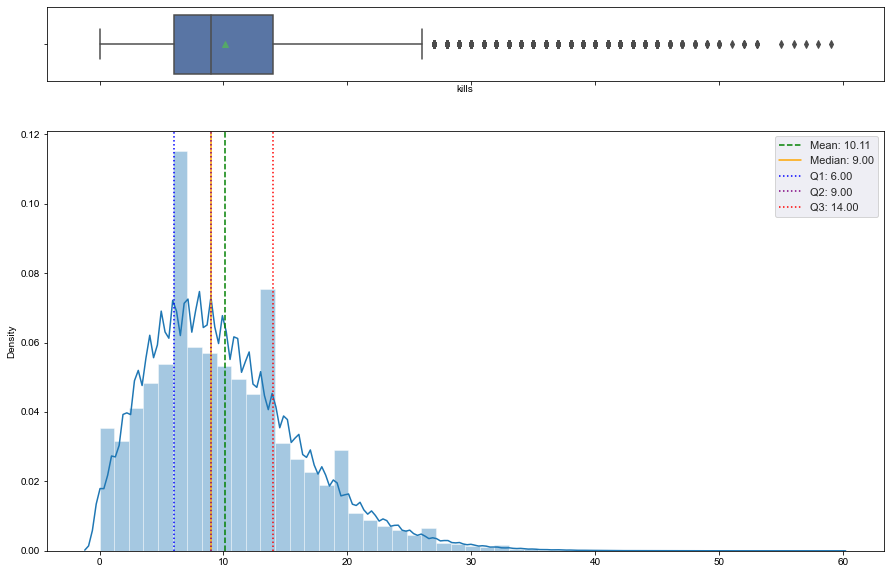

In [23]:
hist_box('kills')

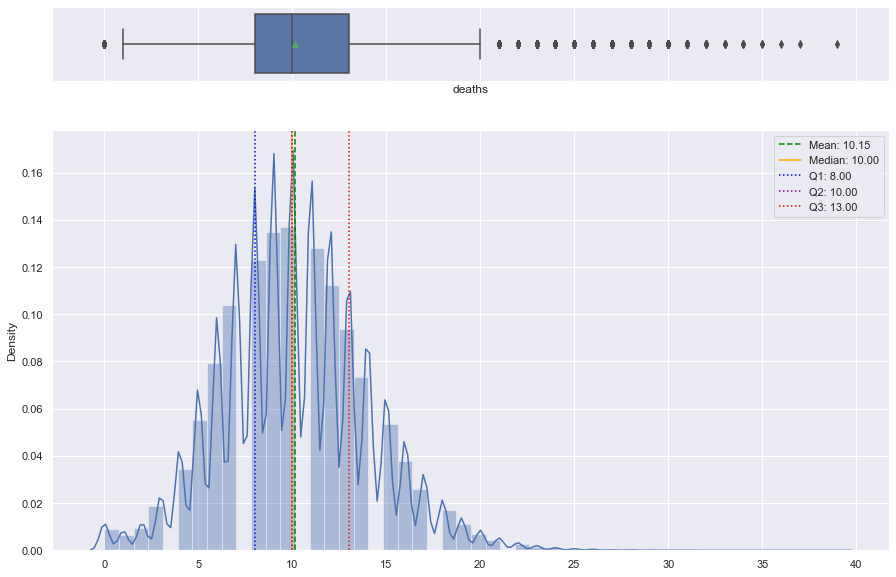

In [24]:
hist_box('deaths')

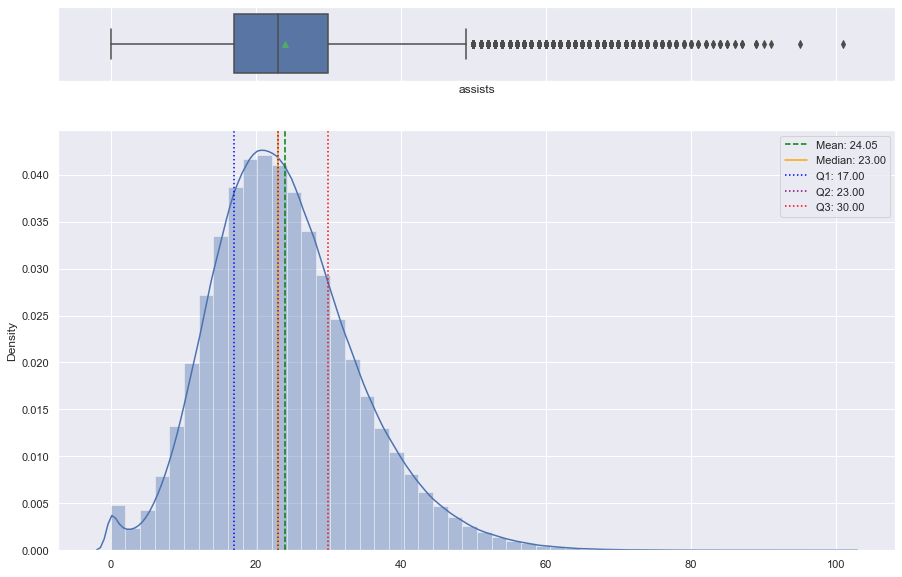

In [25]:
hist_box('assists')

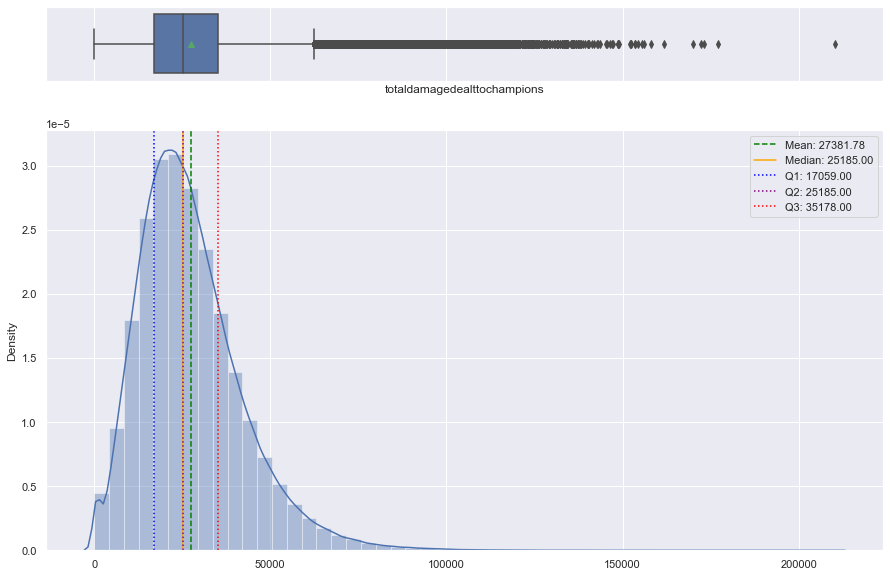

In [26]:
hist_box('totaldamagedealttochampions')

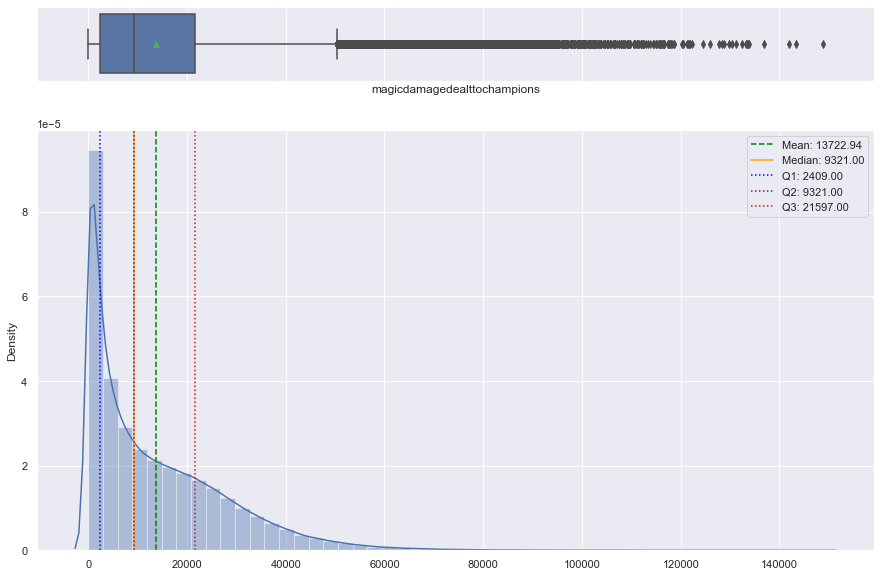

In [27]:
hist_box('magicdamagedealttochampions')

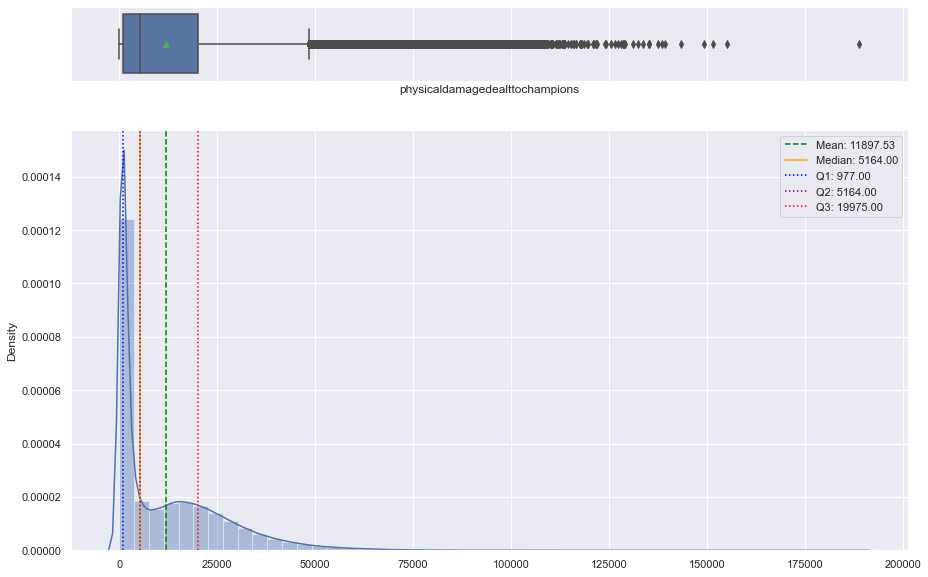

In [28]:
hist_box('physicaldamagedealttochampions')

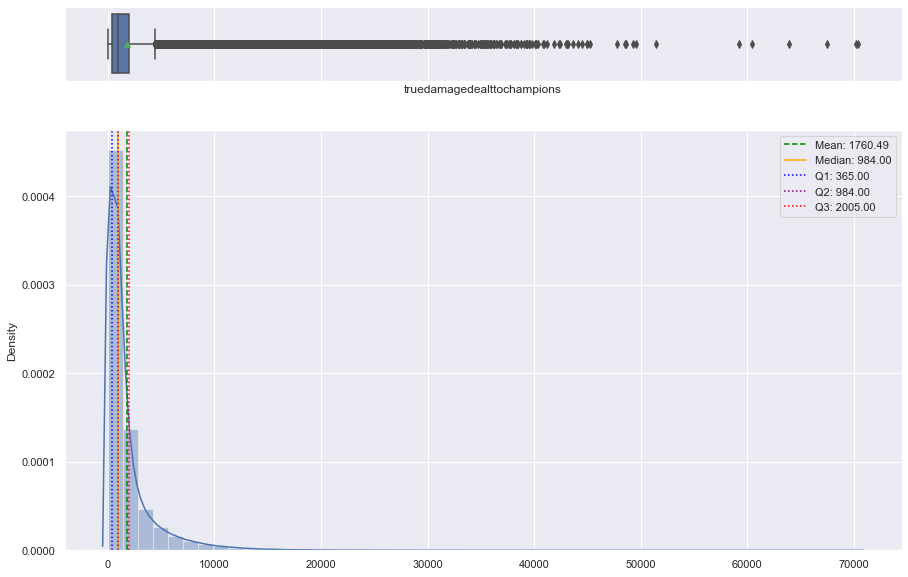

In [29]:
hist_box('truedamagedealttochampions')

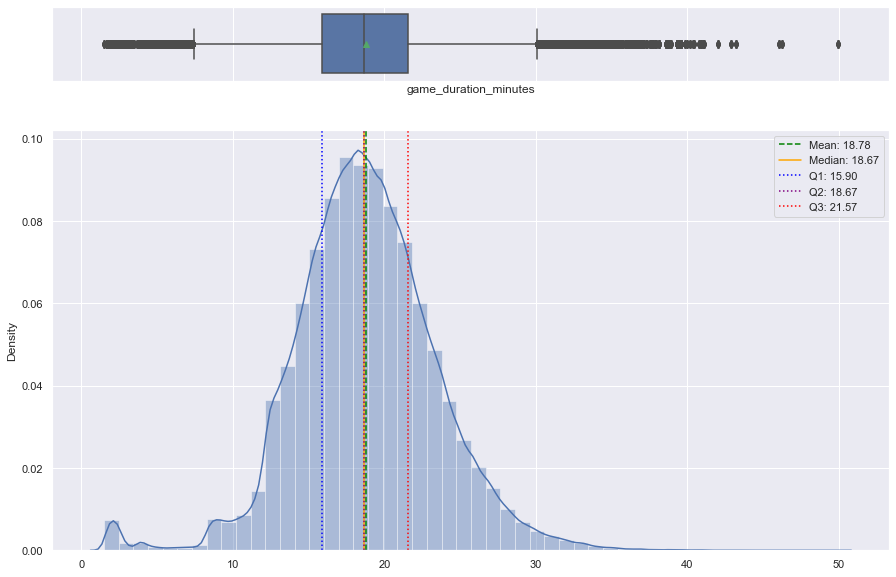

In [30]:
hist_box('game_duration_minutes')

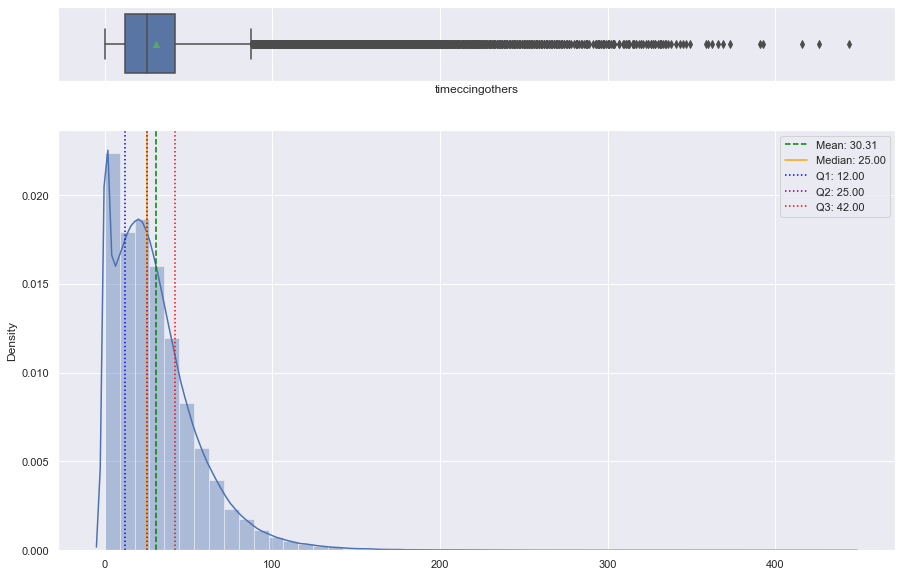

In [31]:
hist_box('timeccingothers')

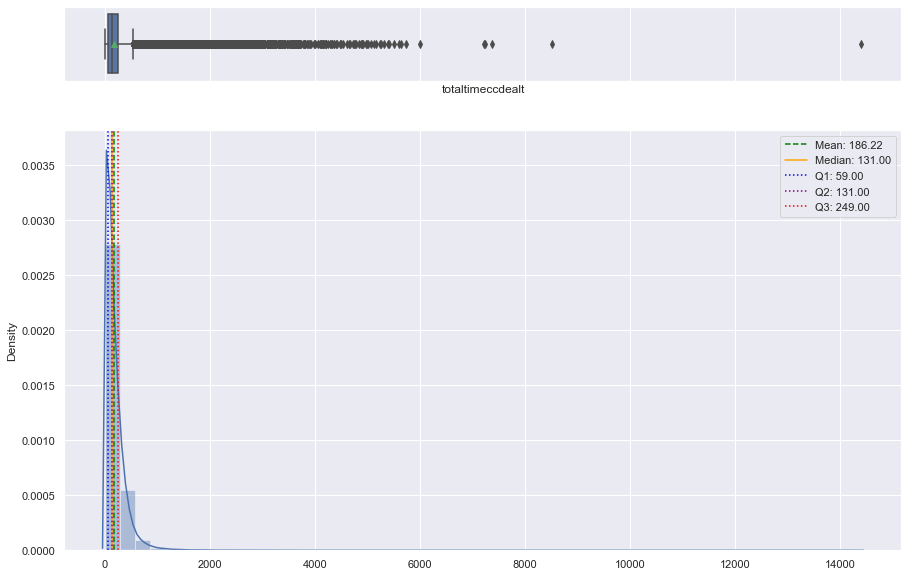

In [32]:
hist_box('totaltimeccdealt')

**Observations:**
- Every varaible is heavily right skewed, except for game_duration which has outliers on both sides
- The median kills are around 9 per game
- The median deaths are around 10 per game
- The median game length is around 18 minutes
- Magic damage is the most common damage type, with physical damage second, and true damage last

In [33]:
def plot_most_played_champs(dataframe, top_n=20):
    """
    Create a bar plot showing the most played champions.

    Parameters:
        dataframe (pd.DataFrame): The input DataFrame containing the data.
        top_n (int): Number of top champions to plot (default is 10).
    """
    # Count the occurrences of each champion
    champion_counts = dataframe['championname'].value_counts(1).head(top_n)
    
    # Create the bar plot
    plt.figure(figsize=(20, 6))
    champion_counts.plot(kind='bar')
    
    plt.title(f"Top {top_n} Most Played Champions")
    plt.xlabel("Champion")
    plt.ylabel("Number of Games Played")
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    plt.show()

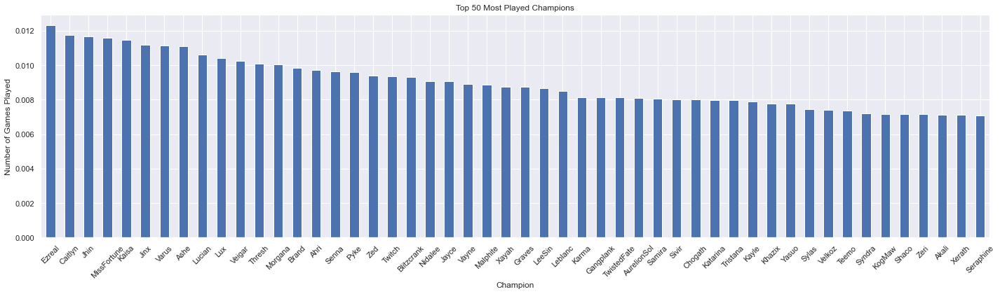

In [34]:
plot_most_played_champs(df, 50)

Observation: **AD Carries** are the most popular champions in ARAM in general

In [35]:
def percentage_below_threshold(df, column_name, threshold):
    """
    Calculate the percentage of values in a DataFrame column that are
    less than or equal to the given threshold.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing the data.
    - column_name (str): The name of the column to analyze.
    - threshold (float): The threshold value to compare against.

    Returns:
    - float: The percentage of values below or equal to the threshold.
    """
    # Ensure the column exists in the DataFrame
    if column_name not in df.columns:
        raise ValueError(f"Column '{column_name}' not found in the DataFrame.")

    # Calculate the percentage
    total_count = len(df)
    below_threshold_count = len(df[df[column_name] <= threshold])
    percentage = (below_threshold_count / total_count) * 100

    return percentage

In [36]:
# Assuming you have a DataFrame called 'df' with a column 'game_duration_minutes'
# and you want to find the percentage of values less than or equal to 60 minutes.
minutes = 49.56
result = percentage_below_threshold(df, 'game_duration_minutes', minutes)
print(f"Percentage of game durations below value {minutes}: {result}")

Percentage of game durations below value 49.56: 99.99891259433244


In [18]:
df['game_duration_minutes'].max()

46.25

In [20]:
df.shape

(544570, 123)

## Bivariable Analysis

**Heatmap of variables**

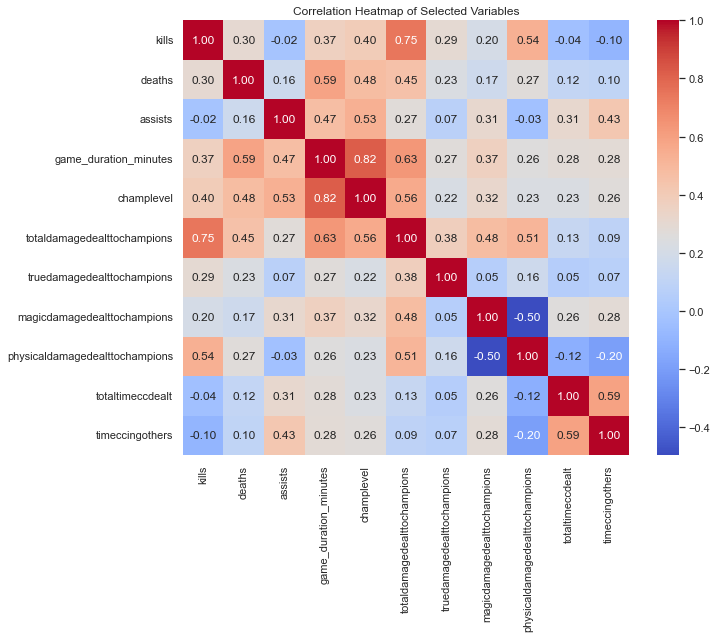

In [37]:
# Select specific columns for description
columns_to_describe = ['kills', 'deaths', 'assists', 'game_duration_minutes', 
'champlevel', 'totaldamagedealttochampions', 'truedamagedealttochampions',
'magicdamagedealttochampions', 'physicaldamagedealttochampions', 'totaltimeccdealt', 'timeccingothers'
                    
]

# Create a subset DataFrame with selected columns
subset_df = df[columns_to_describe]

# Calculate the correlation matrix
correlation_matrix = subset_df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create a heatmap using seaborn
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")

plt.title("Correlation Heatmap of Selected Variables")
plt.show()

Pairplot of these variables

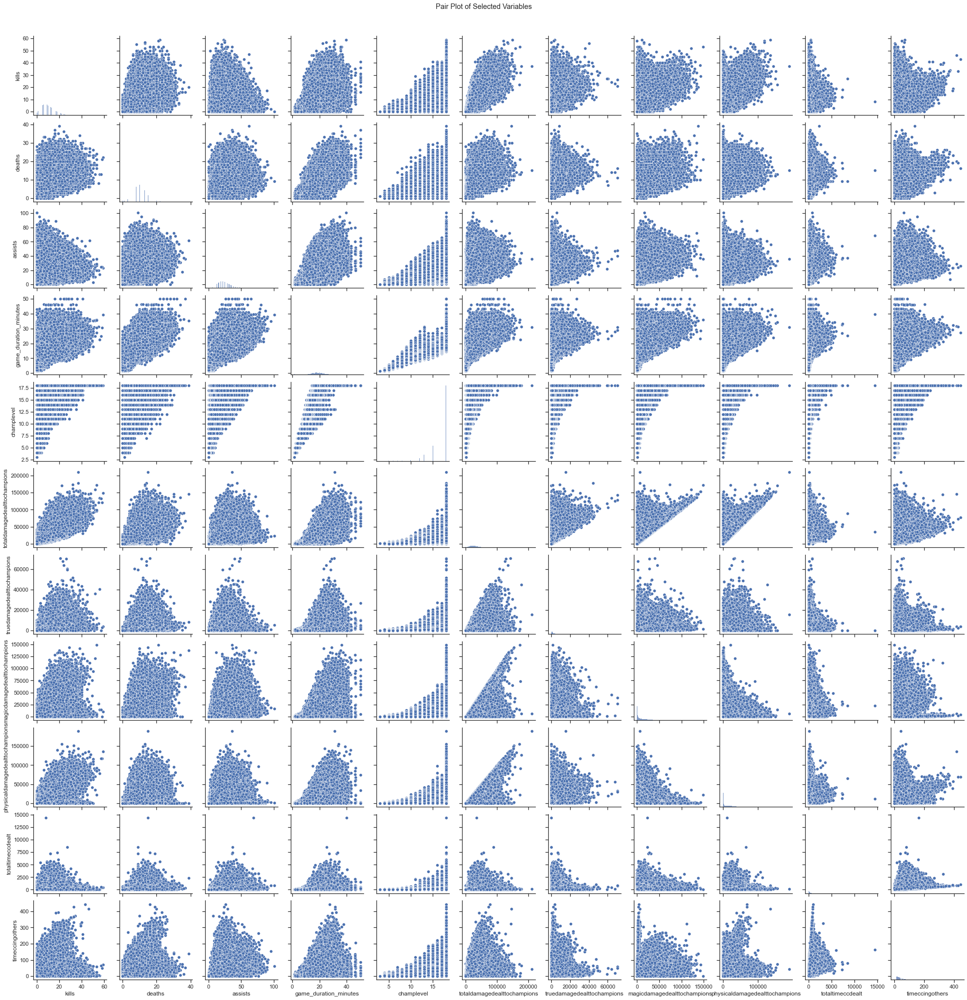

In [38]:
# Select specific columns for description
columns_to_describe = ['kills', 'deaths', 'assists', 'game_duration_minutes', 
'champlevel', 'totaldamagedealttochampions', 'truedamagedealttochampions',
'magicdamagedealttochampions', 'physicaldamagedealttochampions', 'totaltimeccdealt', 'timeccingothers'
                    
]

# Create a pair plot using seaborn
sns.set(style='ticks')
sns.pairplot(df[columns_to_describe])
plt.suptitle("Pair Plot of Selected Variables", y=1.02)
plt.show()

### More Multivariable Analysis

In [39]:
def plot_win_rate_vs_column(df, column_name):
    """
    Plots the win rate versus a specified column in the DataFrame.

    Args:
        df (pd.DataFrame): The DataFrame containing the data.
        column_name (str): The name of the column to analyze.

    Returns:
        None (displays a plot).
    """
    # Group the data by the specified column and calculate win rate
    column_counts = df[column_name].value_counts().sort_index()
    win_counts = df.groupby(column_name)['win'].sum().fillna(0).astype(int).reindex(column_counts.index, fill_value=0)
    win_rate = win_counts / column_counts

    # Create a bar plot
    plt.figure(figsize=(15, 6))
    plt.bar(win_rate.index, win_rate * 100, width=0.8, align='center')
    plt.xlabel(column_name)
    plt.ylabel('Win Rate (%)')
    plt.title(f'Win Rate vs. {column_name}')
    plt.xticks(win_rate.index)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.ylim(0, 100)

    # Show the plot
    plt.show()

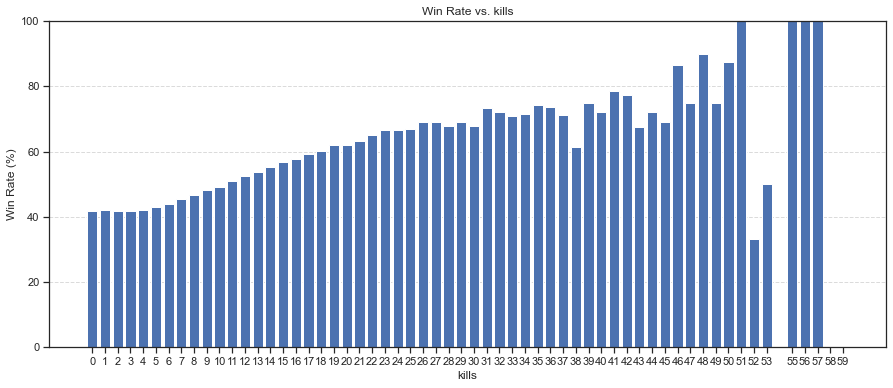

In [40]:
plot_win_rate_vs_column(df, 'kills')

**Observation:** It seems that the more kills players get higher their win percentage is. It seems at the very end of the graph when kills get really high the odds seem to become speratic with win percentage fluctuating up and down. This might indicate that as the game goes on longer the enemy team might get a higher chance of winning.

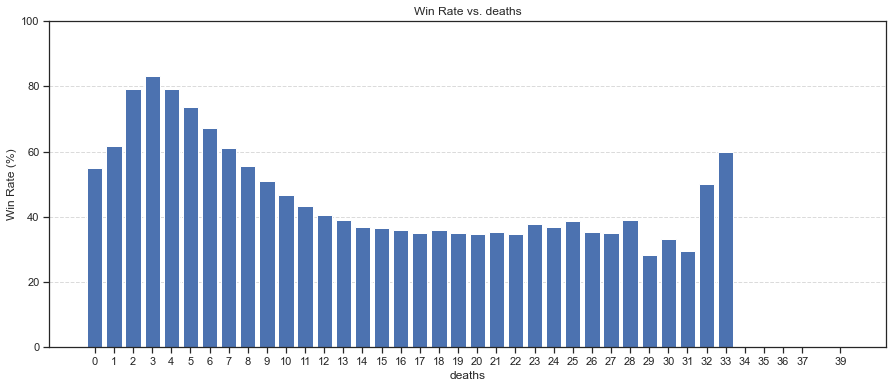

In [41]:
plot_win_rate_vs_column(df, 'deaths')

**Observation:** We can see that the more deaths a player gets the lower the win percentage gets. We see at the tail end a increase in win chance. this might be similar to what we see with kills above in that as the game goes on longer having a lot of deaths doesnt matter as much anymore.

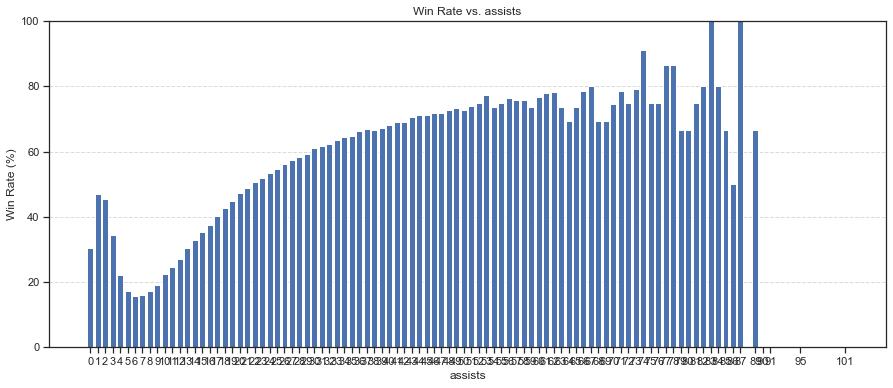

In [42]:
plot_win_rate_vs_column(df, 'assists')

**Observation:** The more assists you get the more likely you are to win the game, however, like the other factors at some point it doesnt seem to matter as much.

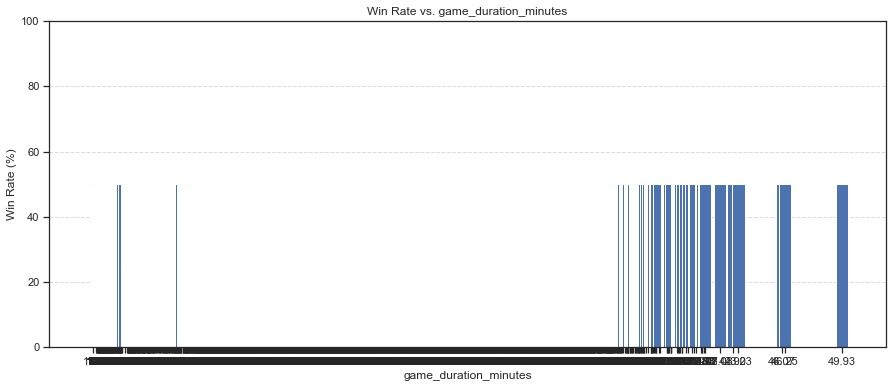

In [43]:
plot_win_rate_vs_column(df, 'game_duration_minutes')

**Observation:** Game duration doesnt seem to affect the win percentage of games

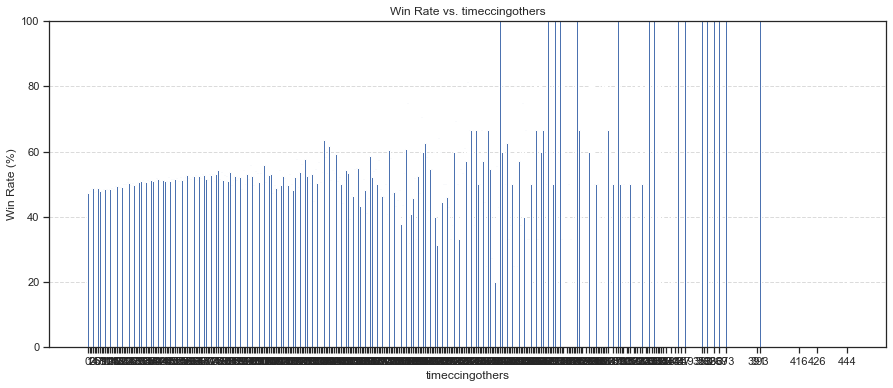

In [44]:
plot_win_rate_vs_column(df, 'timeccingothers')

**Observation:** It seems that the more cc you do the more likely you are to win the game. Although at some point it seems to be a little more speratic.

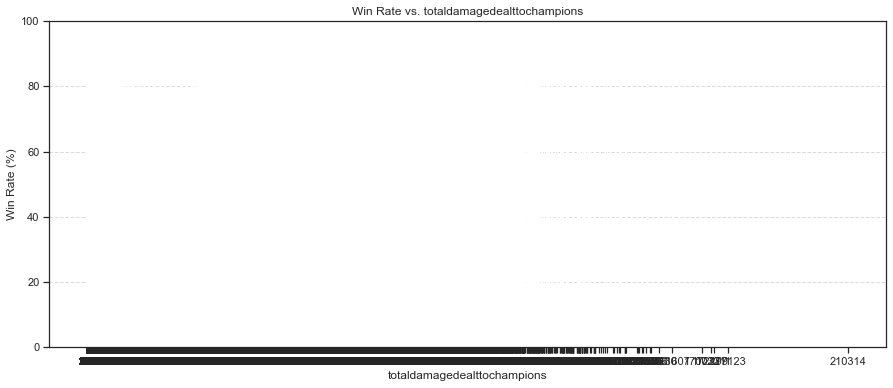

In [45]:
plot_win_rate_vs_column(df, 'totaldamagedealttochampions')

**Observation:**

## Data Preprocessing for clustering

In [46]:
# Columns to for clustering 
columns_for_clustering = ['kills', 'deaths', 'assists', 'game_duration_minutes', 
'champlevel', 'totaldamagedealttochampions', 'truedamagedealttochampions',
'magicdamagedealttochampions', 'physicaldamagedealttochampions', 'totaltimeccdealt', 'timeccingothers'
                    
]
df_clustering = df[columns_for_clustering]

## Principal Component Analysis

In [47]:
scaler = StandardScaler()
data_scaled = pd.DataFrame(scaler.fit_transform(df_clustering), columns = df_clustering.columns)

In [48]:
data_scaled.head()

,kills,deaths,assists,game_duration_minutes,champlevel,totaldamagedealttochampions,truedamagedealttochampions,magicdamagedealttochampions,physicaldamagedealttochampions,totaltimeccdealt,timeccingothers
0,-0.34,-0.30,1.68,0.05,0.70,-0.35,-0.10,0.17,-0.52,-0.07,1.91
1,-0.34,-1.33,-0.00,0.72,0.70,-0.27,-0.29,0.59,-0.82,0.86,1.14
2,-0.83,-0.81,2.07,0.72,0.70,-1.17,0.74,-0.58,-0.79,1.16,0.49
3,-0.02,-1.58,1.28,0.40,0.70,1.14,-0.70,2.17,-0.82,0.86,3.68
4,-0.18,-0.04,-0.10,-0.63,-0.64,0.63,-0.58,1.58,-0.79,-0.34,-0.59


In [49]:
# Defining the number of principal components to generate
n = data_scaled.shape[1]

# Finding principal components for the data
pca = PCA(n_components = n, random_state = 1)

data_pca1 = pd.DataFrame(pca.fit_transform(data_scaled))

# The percentage of variance explained by each principal component
exp_var = pca.explained_variance_ratio_

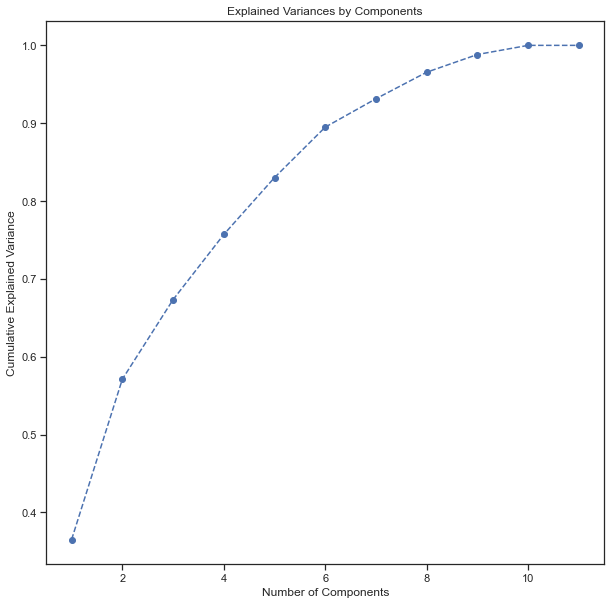

In [50]:
# Plotting the explained cumulative variance by principal components
plt.figure(figsize = (10, 10))

plt.plot(range(1, 12), pca.explained_variance_ratio_.cumsum(), marker = 'o', linestyle = '--')

plt.title("Explained Variances by Components")

plt.xlabel("Number of Components")

plt.ylabel("Cumulative Explained Variance")

plt.show()

In [51]:
# Finding the least number of components that can explain more than 70% variance
sum = 0

for ix, i in enumerate(exp_var):

    sum = sum + i
    
    if(sum>0.70):
        
        print("Number of PCs that explain at least 70% variance:", ix + 1)
        break

Number of PCs that explain at least 70% variance: 4


In [52]:
pc_comps = ['PC1', 'PC2', 'PC3', 'PC4']

data_pca = pd.DataFrame(np.round(pca.components_[:4,:],2), index = pc_comps, columns = data_scaled.columns)

data_pca.T

,PC1,PC2,PC3,PC4
kills,0.30,-0.36,-0.24,0.18
deaths,0.32,-0.10,0.08,-0.19
assists,0.27,0.31,0.22,-0.28
game_duration_minutes,0.44,0.03,0.08,-0.23
champlevel,0.42,0.04,0.11,-0.31
totaldamagedealttochampions,0.42,-0.20,-0.23,0.12
truedamagedealttochampions,0.20,-0.14,-0.06,0.65
magicdamagedealttochampions,0.24,0.32,-0.68,-0.03
physicaldamagedealttochampions,0.17,-0.50,0.45,0.03
totaltimeccdealt,0.18,0.39,0.28,0.40


In [53]:
def color_high(val):
    
    if val < -0.25:                     # You can decide any value as per your understanding
        return 'background: pink'
    
    elif val > 0.25:
        return 'background: skyblue'   
    
data_pca.T.style.applymap(color_high)

,PC1,PC2,PC3,PC4
kills,0.300000,-0.360000,-0.240000,0.180000
deaths,0.320000,-0.100000,0.080000,-0.190000
assists,0.270000,0.310000,0.220000,-0.280000
game_duration_minutes,0.440000,0.030000,0.080000,-0.230000
champlevel,0.420000,0.040000,0.110000,-0.310000
totaldamagedealttochampions,0.420000,-0.200000,-0.230000,0.120000
truedamagedealttochampions,0.200000,-0.140000,-0.060000,0.650000
magicdamagedealttochampions,0.240000,0.320000,-0.680000,-0.030000
physicaldamagedealttochampions,0.170000,-0.500000,0.450000,0.030000
totaltimeccdealt,0.180000,0.390000,0.280000,0.400000


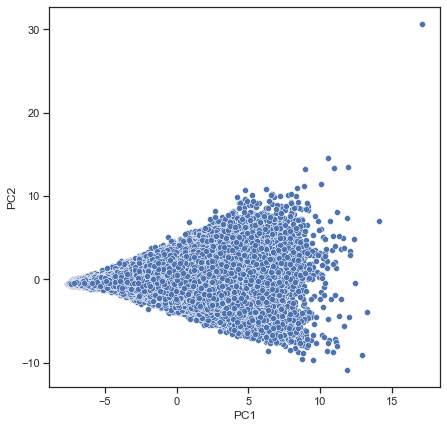

In [54]:
plt.figure(figsize = (7,7))

sns.scatterplot(x = data_pca1[0], y = data_pca1[1])

plt.xlabel("PC1")

plt.ylabel("PC2")

plt.show()

Observation: No clear groupings in the data, however there does seem to be a pattern 

## K-Means

In [55]:
# K-Means clustering
kmeans = KMeans(n_clusters=3)
kmeans_labels = kmeans.fit_predict(data_scaled)

In [56]:
# Apply PCA for dimensionality reduction
pca = PCA(n_components=8)
pca_result = pca.fit_transform(data_scaled)

Text(0.5, 1.0, 'K-Means Clustering')

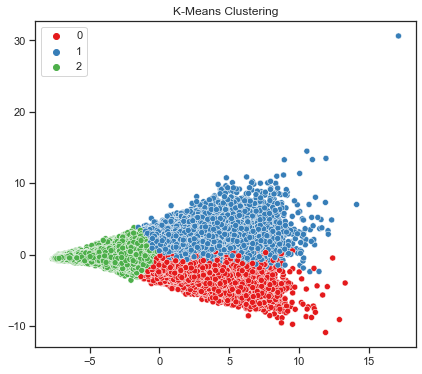

In [57]:
# Plot the results
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=kmeans_labels, palette='Set1')
plt.title("K-Means Clustering")

## t-SNE

The amount of data in the orginal dataset makes computing tsne take a long time so we will use a random subset of the data to make it faster to see if there are any patterns


In [58]:
# Take a random sample of data_scaled
sample_data_scaled = data_scaled.sample(n=10000, random_state=42)

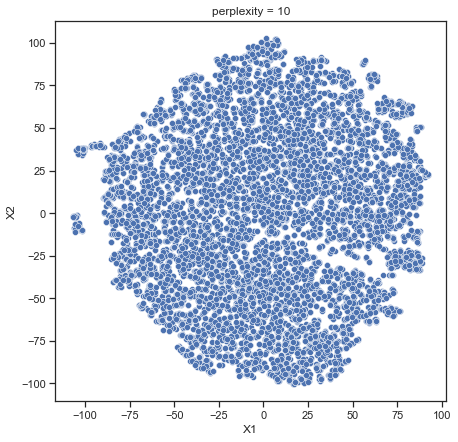

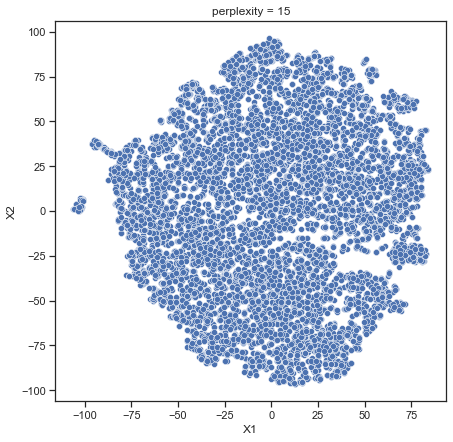

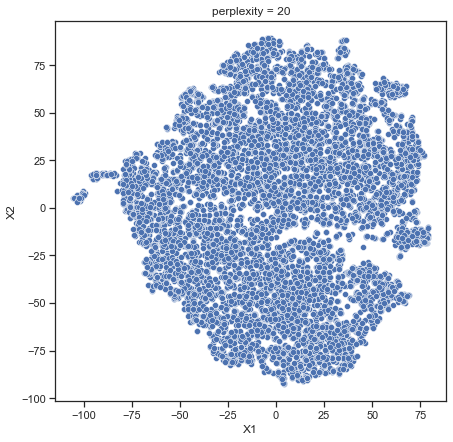

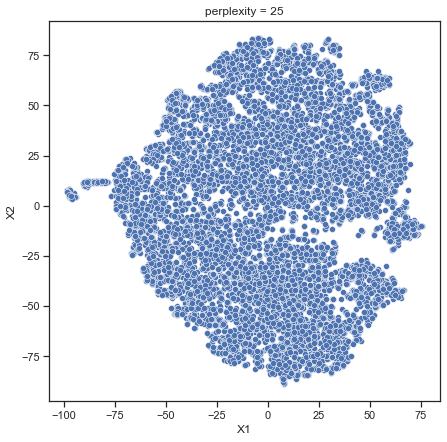

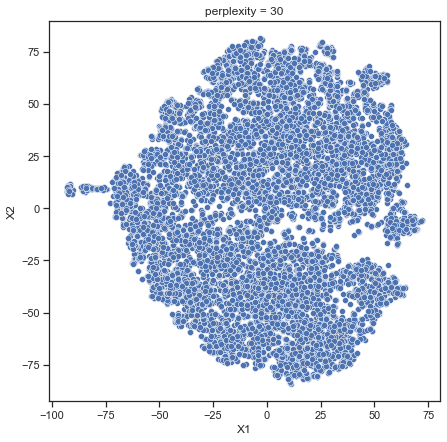

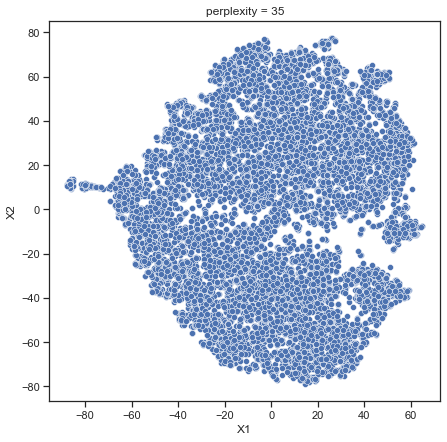

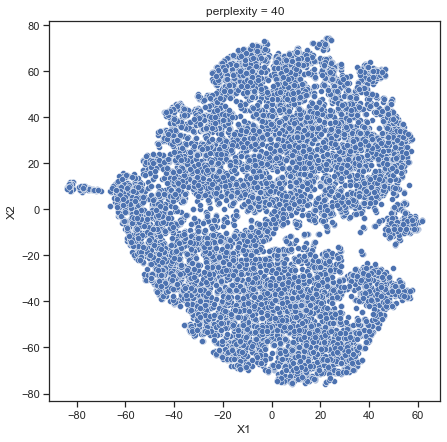

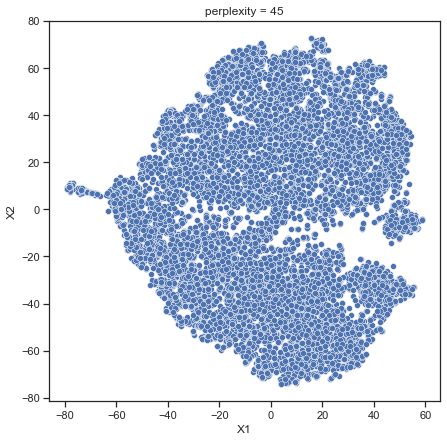

In [59]:
for i in range(10, 50, 5):
    tsne = TSNE(n_components = 2, random_state = 1, perplexity = i)
    
    data_tsne = tsne.fit_transform(sample_data_scaled)
    
    data_tsne = pd.DataFrame(data_tsne)
    
    data_tsne.columns = ['X1', 'X2']
    
    plt.figure(figsize = (7,7))
    
    sns.scatterplot(x = 'X1', y = 'X2', data = data_tsne)
    
    plt.title("perplexity = {}".format(i))

## Player Network Analysis

### Import Libaries for Network Analysis

In [9]:
import os

import networkx as nx

from decorator import decorator

from networkx.utils import create_random_state, create_py_random_state

from multiprocessing import Pool, cpu_count

import multiprocessing as mp

import time


In [14]:
# Get the number of CPU cores
num_cores = mp.cpu_count()
print(f"Number of CPU cores: {num_cores}")

Number of CPU cores: 16


### Creating a dataset

In [10]:
# Take a random sample of data_scaled
sample_df = df.sample(n=100, random_state=42)

In [48]:
sample_df.head()

,puuid,match_id,assists,baronkills,bountylevel,champexperience,champlevel,championid,championname,championtransform,consumablespurchased,damagedealttobuildings,damagedealttoobjectives,damagedealttoturrets,damageselfmitigated,deaths,detectorwardsplaced,doublekills,dragonkills,firstbloodassist,firstbloodkill,firsttowerassist,firsttowerkill,gameendedinearlysurrender,gameendedinsurrender,goldearned,goldspent,individualposition,inhibitorkills,inhibitortakedowns,inhibitorslost,item0,item1,item2,item3,item4,item5,item6,itemspurchased,killingsprees,kills,lane,largestcriticalstrike,largestkillingspree,largestmultikill,longesttimespentliving,magicdamagedealt,magicdamagedealttochampions,magicdamagetaken,neutralminionskilled,nexuskills,nexustakedowns,nexuslost,objectivesstolen,objectivesstolenassists,participantid,pentakills,physicaldamagedealt,physicaldamagedealttochampions,physicaldamagetaken,profileicon,quadrakills,riotidname,riotidtagline,champion_role,sightwardsboughtingame,spell1casts,spell2casts,spell3casts,spell4casts,summoner1casts,summoner1id,summoner2casts,summoner2id,summonerid,summonerlevel,summonername,teamearlysurrendered,teamid,teamposition,timeccingothers,timeplayed,totaldamagedealt,totaldamagedealttochampions,totaldamageshieldedonteammates,totaldamagetaken,totalheal,totalhealsonteammates,totalminionskilled,totaltimeccdealt,totaltimespentdead,totalunitshealed,triplekills,truedamagedealt,truedamagedealttochampions,truedamagetaken,turretkills,turrettakedowns,turretslost,unrealkills,visionscore,visionwardsboughtingame,wardskilled,wardsplaced,win,summoner_name,dataversion,game_creation,game_end_time_stamp,game_id,game_mode,game_name,game_start_time_stamp,game_type,game_version,map_id,platform_id,queue_id,winning_team_id,losing_team_id,game_duration_minutes,0,1,2,3,4,5,6,7,8,9
193629,orbgsE0RqHgZcHhtAsAqgezCHvmWxMaEvbZrsyYKE9tJwE...,NA1_4474721458,17,0,0,20549,18,54,Malphite,False,1,111,111,111,35545,16,0,1,0,False,False,False,False,False,False,15016,14850,Invalid,0,0,2,4636,3157,4645,3089,3108,3020,2052,19,2,11,TOP,0,2,2,155,49319,23582,23874,0,0,0,1,0,0,1,0,26273,3485,13806,4763,0,,,SUPPORT,0,43,43,33,14,14,32,1,4,c0D2TWqXaohJZakBOl3mbyMyhwJOV29BSYUpFI6m-cVrq-E,639,aurafrost8,False,100,,32,1412,76267,27602,0,38677,1761,0,57,355,454,1,0,675,535,996,0,1,4,0,0,0,0,0,False,aurafrost8,2,1666751570206,2022-10-25 19:57:36.475000,4474721458,ARAM,teambuilder-match-4474721458,2022-10-25 19:34:03.738000,MATCHED_GAME,12.20.474.8882,12,NA1,450,200,100,23.533333,orbgsE0RqHgZcHhtAsAqgezCHvmWxMaEvbZrsyYKE9tJwE...,vR29CRN6wXCH-nyqgWWQpR_rhtJc7bos68aBdsxlsYu5W2...,t_UMARAim22WdRICaRfwQKGBaLaLVCJMAgz1_t3KJo_oGG...,KDA5LsOHY3sRe-b-FacxVxFRredYy_CbqW-NsIkxx-0XBU...,D9OShfZ8rCsIychcXNFAWrCBzQxoxsU6WS01hlz5BNl8bk...,1ohL4i861uK8Pa5oceWVcF5W8x_f97N3qaVGc5R3ImvgEf...,hZOMUPDCCdZLuA6opijDGnHZvbwsqFhtyLnlK-5wfdJu0L...,OuzTiGyizPB3jq1-mj_2ZsKt2YLLJhNBZnVq70IY6cEjro...,v1p4aaVVCta5-cUzXmLmgHs1Loa7qBuXb4S3jrkM2UkR1s...,cTXhDBq0Y-zBgavkZaEuyFcMkaPQ3AXlGJDRUkppGBwa-F...
153507,vpO2viECmM4TPxx7PZ9Pkaan_yj-o9CkA3Cl0fhg8xipy2...,NA1_4634648671,15,0,0,14501,15,114,Fiora,False,0,470,470,470,31886,12,0,0,0,False,True,False,False,False,False,11416,10650,Invalid,0,0,1,3074,3158,2051,6632,1031,3133,2052,18,1,7,NONE,495,2,1,97,1409,684,21978,0,0,0,1,0,0,4,0,34821,14273,12107,5448,0,,,SUPPORT,0,73,19,36,8,4,4,7,6,CZfKqelHxaC90sv9yFrw3mVhgRHjf8oxm4EnBxgb_pKkWTE,464,mìdníght,False,100,,8,960,41353,20078,0,35451,10511,931,25,63,276,8,0,5121,5121,1366,0,0,4,0,0,0,0,0,False,mìdníght,2,1681978901425,2023-04-20 01:38:09.633000,4634648671,ARAM,teambuilder-match-4634648671,2023-04-20 01:22:08.910000,MATCHED_GAME,13.8.504.1242,12,NA1,450,200,100,16.000000,jtecvvzDCEQC2NCpZG-OvlN4GJFL-yPO_wooNgx_YrkYcx...,jYtGvGa4Qoex4VFp4BRTn6XhU-FSBwPWuyEZGf8DdVdDih...,Hq-u0YmROs4cqTU1fQGDFGnTrcPx7MZemu6JWUuZh-mRw2...,vpO2viECmM4TPxx7PZ9Pkaan_yj-o9CkA3Cl0fhg8xipy2...,BMmr8ib5meqqHrCWzbKNqHpTQ-pTR0wyobjZzqDvRcc33z...,sOhg22TATeEgdaEMCT47UmGznWDni5XGfDy80o77SNwB4D...,9DGyt0mC0b6j5Jh3qxP_p421H24

In [11]:
sample_df['summoner_name'].value_counts()

threaten           1
isentar            1
ztwow              1
troytaco           1
bluekalamarittv    1
                  ..
lil valko          1
sambitesthedust    1
depressíon         1
jackgorbeatco      1
fujine             1
Name: summoner_name, Length: 100, dtype: int64

In [12]:
sample_df['match_id'].value_counts()

NA1_4761412515    1
NA1_4668610113    1
NA1_4742922086    1
NA1_4684847649    1
NA1_4764435904    1
                 ..
NA1_4766283088    1
NA1_4675061373    1
NA1_4765021956    1
NA1_4584063117    1
NA1_4753198912    1
Name: match_id, Length: 100, dtype: int64

### Not Parallelized

In [16]:
def create_summoner_network(df):
    # Assuming your original DataFrame is named 'df' and contains a 'summoner_name' column

    # Create an empty DataFrame to store the network data
    network_df = pd.DataFrame(columns=['player1', 'player2', 'games_played_together'])

    # Create a set to store unique summoner names
    unique_summoners = set(df['summoner_name'])

    # Get the total number of unique summoners
    total_summoners = len(unique_summoners)

    # Counter to track the progress
    progress_counter = 0

    # Iterate through unique summoner names
    for player1 in unique_summoners:
        for player2 in unique_summoners:
            if player1 != player2:
                # Filter rows where both players are present in the same game
                common_games = df[(df['summoner_name'] == player1) | (df['summoner_name'] == player2)]['match_id'].nunique()
                if common_games > 0:
                    # Check if the current row is already in the network DataFrame
                    if not ((network_df['player1'] == player1) & (network_df['player2'] == player2)).any():
                        # check if the inverse of the row is already in the network DataFrame
                        if not ((network_df['player1'] == player2) & (network_df['player2'] == player1)).any():
                            network_df = network_df.append({'player1': player1, 'player2': player2, 'games_played_together': common_games}, ignore_index=True)

        # Update the progress every 100 iterations
        progress_counter += 1
        if progress_counter % 10 == 0:
            print(f'Progress: {progress_counter}/{total_summoners}', flush=True)  # Use flush=True

    # Optional: Sort the network DataFrame by the number of games played together
    network_df = network_df.sort_values(by='games_played_together', ascending=False)

    # Return the resulting network DataFrame
    return network_df

In [17]:
summoner_network_df = create_summoner_network(sample_df)

Progress: 10/100
Progress: 20/100
Progress: 30/100
Progress: 40/100
Progress: 50/100
Progress: 60/100
Progress: 70/100
Progress: 80/100
Progress: 90/100
Progress: 100/100


In [18]:
summoner_network_df.head()

,player1,player2,games_played_together
0,maicowbei,dojogahu,2
3298,surtycow,jayyj,2
3305,surtycow,bestie byron,2
3304,surtycow,aterout,2
3303,surtycow,troytaco,2


In [77]:
summoner_network_df.head()

,player1,player2,games_played_together
4851,alexz fool,one dark cat,3
1813,alexz fool,thebestofthewest,3
2401,alexz fool,icefrog1998,3
7204,alexz fool,zetetsuken,3
5636,alexz fool,kk need,3


In [79]:
# summoner_network_df['player1'] == 'one dark cat' and summoner_network_df['player2'] == 'alexz fool'
test = summoner_network_df[(summoner_network_df['player2'] == 'one dark cat') & (summoner_network_df['player1'] == 'alexz fool')]


In [80]:
test

,player1,player2,games_played_together
4851,alexz fool,one dark cat,3


In [81]:
# summoner_network_df['player1'] == 'one dark cat' and summoner_network_df['player2'] == 'alexz fool'
test = summoner_network_df[(summoner_network_df['player1'] == 'one dark cat') & (summoner_network_df['player2'] == 'alexz fool')]

In [82]:
test

,player1,player2,games_played_together


In [27]:
summoner_network_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 911070 entries, 0 to 911069
Data columns (total 3 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   player1                910116 non-null  object
 1   player2                910116 non-null  object
 2   games_played_together  911070 non-null  int32 
dtypes: int32(1), object(2)
memory usage: 17.4+ MB


In [71]:
summoner_network_df['player1'].value_counts()

one dark cat        98
stop complaining    98
pegasus402          98
mrandyt             98
lokinde             98
                    ..
codsteh             98
krajj               98
insatiable pug      98
alexz fool          98
mìdníght            98
Name: player1, Length: 99, dtype: int64

Preprocess the data

In [19]:
# convert the games_played_together variable to integers
summoner_network_df['games_played_together'] = summoner_network_df['games_played_together'].astype(int)

In [22]:
summoner_network_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 911070 entries, 92119 to 311995
Data columns (total 3 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   player1                910116 non-null  object
 1   player2                910116 non-null  object
 2   games_played_together  911070 non-null  int32 
dtypes: int32(1), object(2)
memory usage: 24.3+ MB


In [26]:
summoner_network_df.isna().sum()

player1                  954
player2                  954
games_played_together      0
dtype: int64

In [28]:
summoner_network_df.shape

(911070, 3)

In [29]:
summoner_network_df = summoner_network_df.dropna()

In [20]:
summoner_network_df.shape

(4950, 3)

In [21]:
summoner_network_df['player1'].value_counts()

maicowbei           99
dojogahu            98
mkr                 97
aykaizer            96
èasypeasy           95
                    ..
laliot               5
who8mypie            4
funnymodpee          3
imfinethankuandu     2
hi im bown           1
Name: player1, Length: 99, dtype: int64

In [22]:
# Save the df as a csv file
summoner_network_df.to_csv('summoner_network_100.csv', index=False)

In [21]:
summoner_network_df = pd.read_csv('summoner_network_1000.csv')

In [31]:

# Create an empty list to store unique combinations of players
unique_combinations = []

# Iterate through each row in the DataFrame
for index, row in summoner_network_df.iterrows():
    player1 = row['player1']
    player2 = row['player2']
    games_played = row['games_played_together']

    # Check if the reverse combination already exists in the unique_combinations list
    reverse_combination = (player2, player1, games_played)
    if (player1, player2, games_played) not in unique_combinations and reverse_combination not in unique_combinations:
        unique_combinations.append((player1, player2, games_played))

# Create a new DataFrame with unique combinations
unique_df = pd.DataFrame(unique_combinations, columns=['player1', 'player2', 'games_played_together'])


In [ ]:
# Save the df as a csv file
unique_df.to_csv('summoner_network_1000_cleaned.csv', index=False)

In [ ]:
unique_df.shape

### Parallelized 

In [6]:
def calculate_common_games(player1, player2):
    # Filter rows where both players are present in the same game
    common_games = df[(df['summoner_name'] == player1) | (df['summoner_name'] == player2)]['match_id'].nunique()
    return player1, player2, common_games

def create_summoner_network_parallel(df, num_processes=11):
    # Create a set to store unique summoner names
    unique_summoners = set(df['summoner_name'])
    
    # Get the total number of unique summoners
    total_summoners = len(unique_summoners)
    
    # Counter to track the progress
    progress_counter = 0

    # If num_processes is not provided, use the number of CPU cores
    if num_processes is None:
        num_processes = cpu_count()
    
    # Create a multiprocessing Pool
    with Pool(processes=num_processes) as pool:
        results = []
        
        # Record the start time
        start_time = time.time()
        
        try:
            for player1 in unique_summoners:
                for player2 in unique_summoners:
                    if player1 != player2:
                        results.append(pool.apply_async(calculate_common_games, (player1, player2)))
                        
                        # Print progress based on elapsed time
                        progress_counter += 1
                        if progress_counter % 100 == 0:
                            elapsed_time = time.time() - start_time
                            print(f'Progress: {progress_counter}/{total_summoners} (Elapsed Time: {elapsed_time:.2f} seconds)', flush=True)
        
        except Exception as e:
            print(f"An error occurred: {e}")
        finally:
            # Close the pool to ensure proper termination
            pool.close()
            pool.join()
        
        print('IM OUT', flush=True)

        # Collect the results
        network_data = [result.get() for result in results]
        
        # Create the network DataFrame
        network_df = pd.DataFrame(network_data, columns=['player1', 'player2', 'games_played_together'])
        
        # Optional: Sort the network DataFrame by the number of games played together
        network_df = network_df.sort_values(by='games_played_together', ascending=False)
        
    return network_df


Runtimes: original was 6min/100 iterations out of 1000

In [7]:
# network_df = create_summoner_network_parallel(sample_df)

Progress: 100/948 (Elapsed Time: 0.00 seconds)
Progress: 200/948 (Elapsed Time: 0.01 seconds)
Progress: 300/948 (Elapsed Time: 0.01 seconds)
Progress: 400/948 (Elapsed Time: 0.01 seconds)
Progress: 500/948 (Elapsed Time: 0.01 seconds)
Progress: 600/948 (Elapsed Time: 0.02 seconds)
Progress: 700/948 (Elapsed Time: 0.02 seconds)
Progress: 800/948 (Elapsed Time: 0.02 seconds)
Progress: 900/948 (Elapsed Time: 0.02 seconds)
Progress: 1000/948 (Elapsed Time: 0.03 seconds)
Progress: 1100/948 (Elapsed Time: 0.03 seconds)
Progress: 1200/948 (Elapsed Time: 0.03 seconds)
Progress: 1300/948 (Elapsed Time: 0.03 seconds)
Progress: 1400/948 (Elapsed Time: 0.03 seconds)
Progress: 1500/948 (Elapsed Time: 0.04 seconds)
Progress: 1600/948 (Elapsed Time: 0.04 seconds)
Progress: 1700/948 (Elapsed Time: 0.04 seconds)
Progress: 1800/948 (Elapsed Time: 0.04 seconds)
Progress: 1900/948 (Elapsed Time: 0.04 seconds)
Progress: 2000/948 (Elapsed Time: 0.05 seconds)
Progress: 2100/948 (Elapsed Time: 0.05 seconds)
P

Progress: 11200/948 (Elapsed Time: 0.26 seconds)
Progress: 11300/948 (Elapsed Time: 0.79 seconds)
Progress: 11400/948 (Elapsed Time: 0.79 seconds)
Progress: 11500/948 (Elapsed Time: 0.80 seconds)
Progress: 11600/948 (Elapsed Time: 0.80 seconds)
Progress: 11700/948 (Elapsed Time: 0.80 seconds)
Progress: 11800/948 (Elapsed Time: 0.80 seconds)
Progress: 11900/948 (Elapsed Time: 0.80 seconds)
Progress: 12000/948 (Elapsed Time: 0.80 seconds)
Progress: 12100/948 (Elapsed Time: 0.81 seconds)
Progress: 12200/948 (Elapsed Time: 0.81 seconds)
Progress: 12300/948 (Elapsed Time: 0.81 seconds)
Progress: 12400/948 (Elapsed Time: 0.81 seconds)
Progress: 12500/948 (Elapsed Time: 0.81 seconds)
Progress: 12600/948 (Elapsed Time: 0.81 seconds)
Progress: 12700/948 (Elapsed Time: 0.82 seconds)
Progress: 12800/948 (Elapsed Time: 0.82 seconds)
Progress: 12900/948 (Elapsed Time: 0.82 seconds)
Progress: 13000/948 (Elapsed Time: 0.82 seconds)
Progress: 13100/948 (Elapsed Time: 0.82 seconds)
Progress: 13200/948 

In [26]:
def create_summoner_network(df, num_cores):
    # Assuming your original DataFrame is named 'df' and contains a 'summonername' column

    # Create an empty DataFrame to store the network data
    network_df = pd.DataFrame(columns=['player1', 'player2', 'games_played_together'])

    # Create a set to store unique summoner names
    unique_summoners = set(df['summoner_name'])

    # Get the total number of unique summoners
    total_summoners = len(unique_summoners)

    # Create a pool of workers
    pool = mp.Pool(num_cores)

    # Iterate through unique summoner names in parallel
    tasks = []
    for player1 in unique_summoners:
        tasks.append((player1, unique_summoners, network_df))

    # Map the tasks to the pool of workers
    results = pool.map(_create_network_df_for_player, tasks)

    # Combine the results from the workers
    for result in results:
        network_df = network_df.append(result)

    # Sort the network DataFrame by the number of games played together
    network_df = network_df.sort_values(by='games_played_together', ascending=False)

    # Return the resulting network DataFrame
    return network_df

def _create_network_df_for_player(player1, unique_summoners, network_df):
    # Iterate through unique summoner names for the current player
    for player2 in unique_summoners:
        if player1 != player2:
            # Filter rows where both players are present in the same game
            common_games = df[(df['summoner_name'] == player1) | (df['summoner_name'] == player2)]['match_id'].nunique()
            if common_games > 0:
                network_df = network_df.append({'player1': player1, 'player2': player2, 'games_played_together': common_games}, ignore_index=True)

    return network_df

In [28]:
# network_df = create_summoner_network(sample_df, 11)

In [ ]:
# Save the df as a csv file
network_df.to_csv('summoner_network.csv', index=False)

In [24]:
summoner_network_df.head()

,player1,player2,games_played_together
0,gtf0mylane,ryusua,2
6602,dlÿ,turnberry,2
6595,dlÿ,w1dowmak3r,2
6596,dlÿ,firebender iroh,2
6597,dlÿ,jodi ahrias,2


### Creating a Graph Network

In [23]:
# nx.from_pandas_edgelist returns a graph from a Pandas DataFrame containing an edge list
G = nx.from_pandas_edgelist(summoner_network_df, 'player1', "player2", edge_attr = "games_played_together", create_using = nx.Graph())

In [24]:
# The number of unique connections
# Creating functions to calculate the number of unique connections per character, Degree Centrality, Eigenvector Centrality, and Betweenness Centrality
def numUniqueConnec(G):
    numUniqueConnection = list(G.degree())
    
    numUniqueConnection = sorted(numUniqueConnection, key = lambda x:x[1], reverse = True)
    
    numUniqueConnection = pd.DataFrame.from_dict(numUniqueConnection)
    
    numUniqueConnection.columns = (["Character", "NumberOfUniqueHCPConnections"])
    
    return numUniqueConnection

In [25]:
numUniqueConnec(G)

,Character,NumberOfUniqueHCPConnections
0,maicowbei,99
1,dojogahu,99
2,surtycow,99
3,jayyj,99
4,bestie byron,99
...,...,...
95,yelloooo,99
96,dropthatash,99
97,ah bla blur blap,99
98,èasypeasy,99


In [26]:
# Degree Centrality 
''' nx.degree_centrality(G) computes the degree centrality for nodes.
The degree centrality for a node v is the fraction of nodes it is connected to.'''

def deg_central(G):
    deg_centrality = nx.degree_centrality(G)
    
    deg_centrality_sort = sorted(deg_centrality.items(), key = lambda x:x[1], reverse = True) #sort the degree centralities of characters in decending order
    
    deg_centrality_sort = pd.DataFrame.from_dict(deg_centrality_sort)
    
    deg_centrality_sort.columns = (["Character", "Degree Centrality"])
    
    return deg_centrality_sort

In [27]:
deg_centrality_sort = deg_central(G)
deg_central(G)

,Character,Degree Centrality
0,maicowbei,1.0
1,dojogahu,1.0
2,surtycow,1.0
3,jayyj,1.0
4,bestie byron,1.0
...,...,...
95,yelloooo,1.0
96,dropthatash,1.0
97,ah bla blur blap,1.0
98,èasypeasy,1.0


In [28]:
# Eigenvector Centrality
''' nx.eigenvector_centrality computes the eigenvector centrality for the graph G.
Eigenvector centrality computes the centrality for a node based on the centrality of its neighbors. 
The eigenvector centrality for node i is the i-th element of the vector x defined by the equation Ax=kx'''

def eigen_central(G):
    eigen_centrality = nx.eigenvector_centrality(G, weight = "weight")
    
    eigen_centrality_sort = sorted(eigen_centrality.items(), key = lambda x:x[1], reverse = True)
    
    eigen_centrality_sort = pd.DataFrame.from_dict(eigen_centrality_sort)
    
    eigen_centrality_sort.columns = (["Character", "EigenVector Centrality"])
    
    return eigen_centrality_sort

In [29]:
eigen_central(G)

,Character,EigenVector Centrality
0,maicowbei,0.1
1,dojogahu,0.1
2,surtycow,0.1
3,jayyj,0.1
4,bestie byron,0.1
...,...,...
95,yelloooo,0.1
96,dropthatash,0.1
97,ah bla blur blap,0.1
98,èasypeasy,0.1


In [42]:
# Betweenness Centrality
'''nx.betweenness_centrality(G) computes the shortest-path betweenness centrality for nodes.
Betweenness centrality of a node v is the sum of the fraction of all-pairs shortest paths that pass through v. 
'''
def betweenness_central(G):
    betweenness_centrality = nx.betweenness_centrality(G, weight = "games_played_together")
    
    betweenness_centrality_sort = sorted(betweenness_centrality.items(), key = lambda x:x[1], reverse = True)
    
    betweenness_centrality_sort = pd.DataFrame.from_dict(betweenness_centrality_sort)
    
    betweenness_centrality_sort.columns = (["Character", "Betweenness Centrality"])
    
    return betweenness_centrality_sort

In [43]:
# betweenness_central(G)

KeyboardInterrupt: 

### Visualizing the Network

In [30]:
def draw_plotly_network_graph(Graph_obj, filter = None, filter_nodesbydegree = None):
    G_dup = Graph_obj.copy()

    degrees = nx.classes.degree(G_dup)
    
    degree_df = pd.DataFrame(degrees)
    
    # Filter out the nodes with fewer connections
    if filter is not None:
        top = deg_centrality_sort[:filter_nodesbydegree]["Character"].values# sort the top characters using filter_nodesbydegree
        
        G_dup.remove_nodes_from([node
                             for node in G_dup.nodes
                             if node not in top
                            ]) 

    pos = nx.spring_layout(G_dup)

    for n, p in pos.items():
        G_dup.nodes[n]['pos'] = p

    # Create edges 
    # Add edges as disconnected lines in a single trace and nodes as a scatter trace
    edge_trace = go.Scatter(
        x = [],
        y = [],
        line = dict(width = 0.5, color = '#888'),
        hoverinfo = 'none',
        mode = 'lines')

    for edge in G_dup.edges():
        x0, y0 = G_dup.nodes[edge[0]]['pos']
        
        x1, y1 = G_dup.nodes[edge[1]]['pos']
        
        edge_trace['x'] += tuple([x0, x1, None])
        
        edge_trace['y'] += tuple([y0, y1, None])

    node_trace = go.Scatter(
        x = [],
        y = [],
        text = [],
        mode = 'markers',
        hoverinfo = 'text',
        marker = dict(
            showscale = True,
            colorscale = 'RdBu',
            reversescale = True,
            color = [],
            size = 15,
            colorbar = dict(
                thickness = 10,
                title = 'Node Connections',
                xanchor = 'left',
                titleside = 'right'
            ),
            line = dict(width = 0)))

    for node in G_dup.nodes():
        x, y = G_dup.nodes[node]['pos']
        
        node_trace['x'] += tuple([x])
        
        node_trace['y'] += tuple([y])

    # Color node points by the number of connections
    for node, adjacencies in enumerate(G_dup.adjacency()):
        node_trace['marker']['color'] += tuple([int(degree_df[degree_df[0] == adjacencies[0]][1].values)])
        
        node_info = adjacencies[0] + '<br /># of connections: ' + str(int(degree_df[degree_df[0] == adjacencies[0]][1].values))
        
        node_trace['text'] += tuple([node_info])

    # Create a network graph
    fig = go.Figure(data = [edge_trace, node_trace],
                 layout = go.Layout(
                    title = '<br>Summoner_name network connections',
                    titlefont = dict(size = 20),
                    showlegend = False,
                    hovermode = 'closest',
                    margin = dict(b = 20, l = 5, r = 5, t = 0),
                    annotations=[ dict(
                        text = "",
                        showarrow = False,
                        xref = "paper", yref = "paper") ],
                    xaxis = dict(showgrid = False, zeroline = False, showticklabels = False),
                    yaxis = dict(showgrid = False, zeroline = False, showticklabels = False)))

    iplot(fig)

In [31]:
draw_plotly_network_graph(Graph_obj = G, filter = None, filter_nodesbydegree = None)
# 2 minutes for 100 player from orginal database

# My Games

**These are my solo q ARAM games**

## Data Preprocessing

#### Filter only the games where Im solo queing

Create a dataframe with only my solo q games (aka games where none of my friends are in)

In [61]:
def filter_matches_by_summoner(summoner_name, friend_summoner_names, dataframe):

    # Create a dataframe of match_ids that shade20 has
    summoner_rows = df[df['summoner_name'] == summoner_name]
        
    summoner_match_ids = summoner_rows['match_id']

    summoner_match_ids = summoner_match_ids.drop_duplicates()

    # Create a DataFrame of unique match_ids that friends_names have
    friends_match_ids = df[df['summoner_name'].isin(friends_names)]['match_id']

    friends_match_ids = friends_match_ids.drop_duplicates()

    unique_match_ids = summoner_match_ids[~summoner_match_ids.isin(friends_match_ids)]

    return df.loc[df['match_id'].isin(unique_match_ids)]

In [62]:
friends_names = ['i reformed gg', 'taran', 'treebéard', 'poppa flores', 'thedeadchicken', 'ronzoni', 'riot slickStoat', 'send gromp nudes', 'shepherdofsheep']  

summoner_name = 'shade20'

filtered_df = filter_matches_by_summoner(summoner_name, friends_names, df)

In [63]:
filtered_df.head()

,puuid,match_id,assists,baronkills,bountylevel,champexperience,champlevel,championid,championname,championtransform,consumablespurchased,damagedealttobuildings,damagedealttoobjectives,damagedealttoturrets,damageselfmitigated,deaths,detectorwardsplaced,doublekills,dragonkills,firstbloodassist,firstbloodkill,firsttowerassist,firsttowerkill,gameendedinearlysurrender,gameendedinsurrender,goldearned,goldspent,individualposition,inhibitorkills,inhibitortakedowns,inhibitorslost,item0,item1,item2,item3,item4,item5,item6,itemspurchased,killingsprees,kills,lane,largestcriticalstrike,largestkillingspree,largestmultikill,longesttimespentliving,magicdamagedealt,magicdamagedealttochampions,magicdamagetaken,neutralminionskilled,nexuskills,nexustakedowns,nexuslost,objectivesstolen,objectivesstolenassists,participantid,pentakills,physicaldamagedealt,physicaldamagedealttochampions,physicaldamagetaken,profileicon,quadrakills,riotidname,riotidtagline,champion_role,sightwardsboughtingame,spell1casts,spell2casts,spell3casts,spell4casts,summoner1casts,summoner1id,summoner2casts,summoner2id,summonerid,summonerlevel,summonername,teamearlysurrendered,teamid,teamposition,timeccingothers,timeplayed,totaldamagedealt,totaldamagedealttochampions,totaldamageshieldedonteammates,totaldamagetaken,totalheal,totalhealsonteammates,totalminionskilled,totaltimeccdealt,totaltimespentdead,totalunitshealed,triplekills,truedamagedealt,truedamagedealttochampions,truedamagetaken,turretkills,turrettakedowns,turretslost,unrealkills,visionscore,visionwardsboughtingame,wardskilled,wardsplaced,win,summoner_name,dataversion,game_creation,game_end_time_stamp,game_id,game_mode,game_name,game_start_time_stamp,game_type,game_version,map_id,platform_id,queue_id,winning_team_id,losing_team_id,game_duration_minutes,0,1,2,3,4,5,6,7,8,9
20,TCiviLRdwHnYrv8z6YUjzSbc4dgn5xyoTS4VzYhaeA5PJd...,NA1_4761045635,19,0,0,12957,14,29,Twitch,False,3,2861,2861,2861,4464,6,0,2,0,False,False,True,False,False,False,11617,11550,Invalid,0,1,0,6672,3031,3006,3153,1042,1042,2052,19,4,14,NONE,388,5,2,142,3482,1642,7583,0,0,1,0,0,0,5,0,46062,15924,3473,23,0,,,SUPPORT,0,34,16,11,5,3,4,0,6,Lhxoafm0FThlZssrW4A7wS5tzij_P1m7kwXOVM2golrigozU,351,thanhtruongsony,False,100,,5,768,54294,19037,0,12956,1460,0,51,64,104,1,0,4749,1470,1899,1,4,1,0,0,0,0,0,True,thanhtruongsony,2,1693520258609,2023-08-31 15:30:50.451000,4761045635,ARAM,teambuilder-match-4761045635,2023-08-31 15:18:01.960000,MATCHED_GAME,13.17.528.2266,12,NA1,450,100,200,12.80,UPJEHO0RNsx8KZwFB3B1qOPJinETt2Pexh9Ftj4yDRBStP...,gkQL1hD8PLlIrZyaTe93jYMGCYRPnF-_tIc1VV7AOoD1VQ...,fthpJhamL6mxkhIeAWhlcC4k9-lDmqcbB4cHwvYob3haBl...,rWNQvxBOQ4SJwDczotWgb_GM7yOOq_LxeSeS-JWs5gBpoS...,TCiviLRdwHnYrv8z6YUjzSbc4dgn5xyoTS4VzYhaeA5PJd...,TWktwh7mx84pmqTYSeQ9GWAawJ50shDnwhgV9xnwtdGprS...,OtpKLuhOYduOhGOTK8mFHr9u3iS9dq5ClauPmPa2cMQA68...,xV-kH_Tc7j25-mAWiGIuyxocAeEfuVfJnRdckgc0o9n0k_...,SCfwhosNAHW41taqEPDJXf-QOS6ueZkdnHvJhflSfbr0eS...,wzGJp7Vprk1SsmbflPOb7X-FA0wm52_oPXmUISvOU6GaZR...
21,np2Fuqd9IY6D7dUvmr96YRvT1PZoXskF-dgI6VsDuBmuV1...,NA1_4760965379,27,0,1,20823,18,62,MonkeyKing,False,0,259,259,259,42330,11,0,0,0,True,False,False,False,False,False,14532,12850,Invalid,0,0,0,2051,3047,3053,6632,3071,3211,2052,18,1,8,TOP,0,3,1,241,9330,4491,17979,0,1,1,0,0,0,1,0,49715,28118,24768,556,0,,,CARRY,0,89,27,51,18,22,32,4,4,EGeQ8kagpQ7j9-ssdi17U9deOUgA5q7fTIlemCoi3IuBmMo,323,tothfary,False,100,,17,1321,63016,34740,0,45114,9502,0,49,28,292,1,0,3970,2130,2366,0,0,1,0,0,0,0,0,True,tothfary,2,1693511613605,2023-08-31 13:16:51.279000,4760965379,ARAM,teambuilder-match-4760965379,2023-08-31 12:54:49.447000,MATCHED_GAME,13.17.528.2266,12,NA1,450,100,200,22.02,np2Fuqd9IY6D7dUvmr96YRvT1PZoXskF-dgI6VsDuBmuV1...,594wuvFUpxxUlFV6aPMcCoh4Hqtz8AaTYieTQr0loS5Pdk...,FzIlNWDPCDtCVoOovoU0IytnCkMUHV_V9MEw-gTCRya2m_...,YuY3z9dzISo6esY7FQQ66lEVg7znz7_rEC2QErQdGuXoXj...,zvFCHinW7OqIx0LTXxnRODXQUP4OQWMnui3C3xiFxlurMF...,ZyYY0ZVbSSc8LKPCaUUIjEbVHAKJtMHji7sCQPkDuhytcS...,wzGJp7Vprk1SsmbflPOb7X-FA0wm52_oPXmUIS

In [64]:
filtered_df.shape

(4930, 131)

In [65]:
filtered_df['summoner_name'].value_counts()

shade20          493
calcifer187        6
snacky boy         5
kkyros             5
aram bans pls      5
                ... 
 w5nd xd           1
trail mixed        1
znightraid         1
shadero            1
peppabig           1
Name: summoner_name, Length: 3654, dtype: int64

In [66]:
test = filtered_df[filtered_df['summoner_name'] == 'shade20']

In [67]:
test.head()

,puuid,match_id,assists,baronkills,bountylevel,champexperience,champlevel,championid,championname,championtransform,consumablespurchased,damagedealttobuildings,damagedealttoobjectives,damagedealttoturrets,damageselfmitigated,deaths,detectorwardsplaced,doublekills,dragonkills,firstbloodassist,firstbloodkill,firsttowerassist,firsttowerkill,gameendedinearlysurrender,gameendedinsurrender,goldearned,goldspent,individualposition,inhibitorkills,inhibitortakedowns,inhibitorslost,item0,item1,item2,item3,item4,item5,item6,itemspurchased,killingsprees,kills,lane,largestcriticalstrike,largestkillingspree,largestmultikill,longesttimespentliving,magicdamagedealt,magicdamagedealttochampions,magicdamagetaken,neutralminionskilled,nexuskills,nexustakedowns,nexuslost,objectivesstolen,objectivesstolenassists,participantid,pentakills,physicaldamagedealt,physicaldamagedealttochampions,physicaldamagetaken,profileicon,quadrakills,riotidname,riotidtagline,champion_role,sightwardsboughtingame,spell1casts,spell2casts,spell3casts,spell4casts,summoner1casts,summoner1id,summoner2casts,summoner2id,summonerid,summonerlevel,summonername,teamearlysurrendered,teamid,teamposition,timeccingothers,timeplayed,totaldamagedealt,totaldamagedealttochampions,totaldamageshieldedonteammates,totaldamagetaken,totalheal,totalhealsonteammates,totalminionskilled,totaltimeccdealt,totaltimespentdead,totalunitshealed,triplekills,truedamagedealt,truedamagedealttochampions,truedamagetaken,turretkills,turrettakedowns,turretslost,unrealkills,visionscore,visionwardsboughtingame,wardskilled,wardsplaced,win,summoner_name,dataversion,game_creation,game_end_time_stamp,game_id,game_mode,game_name,game_start_time_stamp,game_type,game_version,map_id,platform_id,queue_id,winning_team_id,losing_team_id,game_duration_minutes,0,1,2,3,4,5,6,7,8,9
26036,wzGJp7Vprk1SsmbflPOb7X-FA0wm52_oPXmUISvOU6GaZR...,NA1_4761538077,23,0,0,17116,17,166,Akshan,False,0,475,475,475,17210,12,0,1,0,False,False,False,False,False,False,14136,13500,Invalid,0,0,1,3153,3006,3124,3036,3814,0,2052,17,3,10,NONE,0,2,2,141,9060,5018,13335,0,0,0,1,0,0,8,0,46626,19419,10628,4022,0,,,SUPPORT,0,44,15,47,7,6,6,4,4,2465KoFTuNANeZVxtT_k75KIW6T0L1YYV6_kZsOI2tDVYsc,486,Shade20,False,200,,1,1079,58845,25785,0,25121,3631,0,42,36,278,1,0,3158,1347,1157,0,1,4,0,0,0,0,0,False,shade20,2,1693558462603,2023-09-01 02:13:21.231000,4761538077,ARAM,teambuilder-match-4761538077,2023-09-01 01:55:21.576000,MATCHED_GAME,13.17.529.525,12,NA1,450,100,200,17.98,T05w6x_dVSdzBCgmFKdsWXH4KDBm-ldUrXCrCXi1ENgNAE...,i3-3ajS4oLxrFrNw9BUe1GztopCqyJXTXy7G5QA2vUQNOe...,gfdRf4VptT7KBNBc0KkoFsHSaie4udnWEMn8o82IleSqRz...,grGPMyaGxBW_-Xi94ajn18Ur800CXGtFEBHvriQ-f-xxsX...,zVFfa_xMLKZn-Krsdlr9nlTflkC2O6FULMQldwxOxKpJgL...,t4YzTR-OucTlz8ryp2f8XInKKahOBERFl5r_dMmEYljdcC...,FeIeGXibnB989EkTCDTObmIJw3_C8qlFzXbGP5m4vfBCt3...,wzGJp7Vprk1SsmbflPOb7X-FA0wm52_oPXmUISvOU6GaZR...,D1RbSFDfb7b2Kz-2ZCM-NrGfDeT6GAfa1aClHlMZULalAG...,84ggqlCqtYbx833IW5n0_RZ12rH102L9x7uTFCZ-pz2gJF...
27189,wzGJp7Vprk1SsmbflPOb7X-FA0wm52_oPXmUISvOU6GaZR...,NA1_4682154963,10,0,0,12278,14,236,Lucian,False,0,850,850,850,9380,10,0,3,0,False,False,False,False,False,False,10765,10350,Invalid,0,0,2,3112,3070,6655,3158,3089,1058,2052,12,3,11,NONE,0,3,2,152,22240,10391,10150,0,0,0,1,0,0,10,0,16636,5231,7849,4022,0,,,SUPPORT,0,34,47,33,11,10,32,3,4,2465KoFTuNANeZVxtT_k75KIW6T0L1YYV6_kZsOI2tDVYsc,456,shade20,False,200,,0,871,39574,16219,0,18215,504,0,29,0,230,1,0,696,596,214,1,1,4,0,0,0,0,0,False,shade20,2,1686643691813,2023-06-13 01:23:58.656000,4682154963,ARAM,teambuilder-match-4682154963,2023-06-13 01:09:27.574000,MATCHED_GAME,13.11.513.8260,12,NA1,450,100,200,14.52,LxZ4aTGIDghboS9BcCWlGq0MSEJNmojDvfnEC6yhQR_d7Q...,vBW4PFucsaTYQXMlY6nQfYA3YgDQIJZtHYO1SqWLyU2UbQ...,SCkbYeJhidBLBCE-Hsj9_0Ra2JfrG77dSqMPPXAEGwSBDJ...,GpEGTh6nuvfLEYs4Y52kv6PI3ZEum0Qm_Zz05SLaVp2KQN...,rx3EbrQNScsrh4Lbgtd58W78AKpwAl9rdt4wQRQkvYBnaG...,cFB_M-R71251U26fO3dyjdMUs-_EjTQyb0_yQtytb43pfM...,H7Fk2IyegDhEJJFNm_IGINoJTOwvCaRKucbqeZzqVuhDwY...,6_I

Observation: There are no friends in the these observations

In [68]:
from scipy.stats import boxcox

def compare_and_conclude(df1, df2, col1, col2, alpha=0.05):
    """
    Compare two populations using a t-test and print a conclusion based on data assessment.

    Parameters:
    - df1: First DataFrame containing the first population data.
    - df2: Second DataFrame containing the second population data.
    - col1: Column name in df1 for the first population.
    - col2: Column name in df2 for the second population.
    - alpha: Significance level (default is 0.05 for 95% confidence).

    Returns:
    - result: A string indicating the conclusion of the hypothesis test.
    """

    # Step 1: Data Cleaning and Preparation
    # No specific code here, as data cleaning depends on your specific data.

    # Step 2: Data Distribution Assessment
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.histplot(df1[col1], kde=True, color='blue', label='Population 1')
    plt.title('Population 1 Distribution')
    plt.xlabel(col1)
    plt.legend()

    plt.subplot(1, 2, 2)
    sns.histplot(df2[col2], kde=True, color='orange', label='Population 2')
    plt.title('Population 2 Distribution')
    plt.xlabel(col2)
    plt.legend()
    plt.show()

    # Check for normality using Shapiro-Wilk test (you can use other tests)
    _, p_value1 = stats.shapiro(df1[col1])
    _, p_value2 = stats.shapiro(df2[col2])

    # If data is not normal, attempt a Box-Cox transformation
    if p_value1 < 0.05:
        df1[col1], _ = boxcox(df1[col1] + 1)  # Adding 1 to handle zero or negative values
    if p_value2 < 0.05:
        df2[col2], _ = boxcox(df2[col2] + 1)  # Adding 1 to handle zero or negative values

    # Re-assess normality after transformation
    _, p_value1 = stats.shapiro(df1[col1])
    _, p_value2 = stats.shapiro(df2[col2])

    # Step 3: Sample Size Check
    n1 = len(df1)
    n2 = len(df2)
    if n1 < 30 or n2 < 30:
        return "Sample sizes are small. Consider collecting more data for reliable results."

    # Step 4: Equality of Variances
    var1 = df1[col1].var()
    var2 = df2[col2].var()
    if abs(var1 / var2 - 1) > 0.1:
        return "Variances are significantly different. Set 'equal_var=False' when performing the test."

    # Step 5: Hypothesis Formulation
    null_hypothesis = "There is no significant difference between the two populations."
    alt_hypothesis = "There is a significant difference between the two populations."

    # Step 6: Significance Level (Alpha)
    alpha_str = f"Significance Level (alpha): {alpha}"

    # Step 7: Perform the T-test
    t_statistic, p_value = stats.ttest_ind(df1[col1], df2[col2], equal_var=True)

    # Step 8: Interpret the Results
    if p_value < alpha:
        result = "Reject the null hypothesis."
    else:
        result = "Fail to reject the null hypothesis."

    # Print the conclusion
    conclusion = f"Conclusion: {result}\n{null_hypothesis if result == 'Fail to reject the null hypothesis.' else alt_hypothesis}\n{alpha_str}\n\n"
    return conclusion

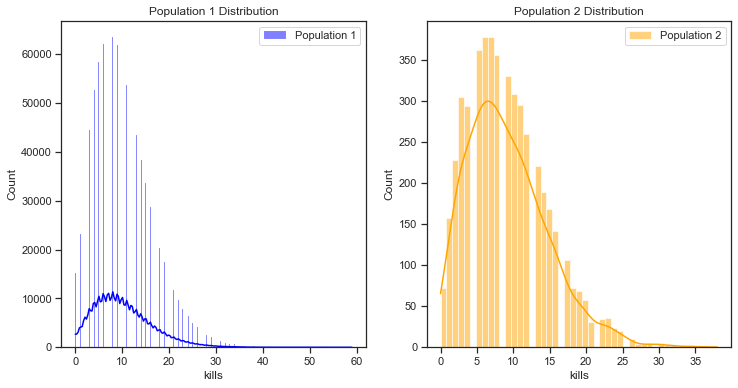

Variances are significantly different. Set 'equal_var=False' when performing the test.


In [69]:
# Compare the populations in 'column1_in_df1' and 'column2_in_df2'
conclusion = compare_and_conclude(df, filtered_df, 'kills', 'kills')

print(conclusion)

## Univeriable Analysis

In [70]:
# Defining the hist_box() function
def hist_box(col):
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={'height_ratios': (0.15, 0.85)}, figsize=(15, 10))
    sns.set(style='darkgrid')
    
    # Adding a graph in each part
    sns.boxplot(x=filtered_df[col], ax=ax_box, showmeans=True)
    sns.distplot(x=filtered_df[col], ax=ax_hist)
    
    mean_val = filtered_df[col].mean()
    median_val = filtered_df[col].median()
    std_val = filtered_df[col].std()
    q1_val = filtered_df[col].quantile(0.25)
    q2_val = filtered_df[col].quantile(0.5)
    q3_val = filtered_df[col].quantile(0.75)
    
    ax_hist.axvline(mean_val, color='green', linestyle='--', label=f'Mean: {mean_val:.2f}')
    ax_hist.axvline(median_val, color='orange', linestyle='-', label=f'Median: {median_val:.2f}')
    
    # Adding vertical lines for quartiles
    ax_hist.axvline(q1_val, color='blue', linestyle=':', label=f'Q1: {q1_val:.2f}')
    ax_hist.axvline(q2_val, color='purple', linestyle=':', label=f'Q2: {q2_val:.2f}')
    ax_hist.axvline(q3_val, color='red', linestyle=':', label=f'Q3: {q3_val:.2f}')
    
    ax_hist.legend()
    plt.show()

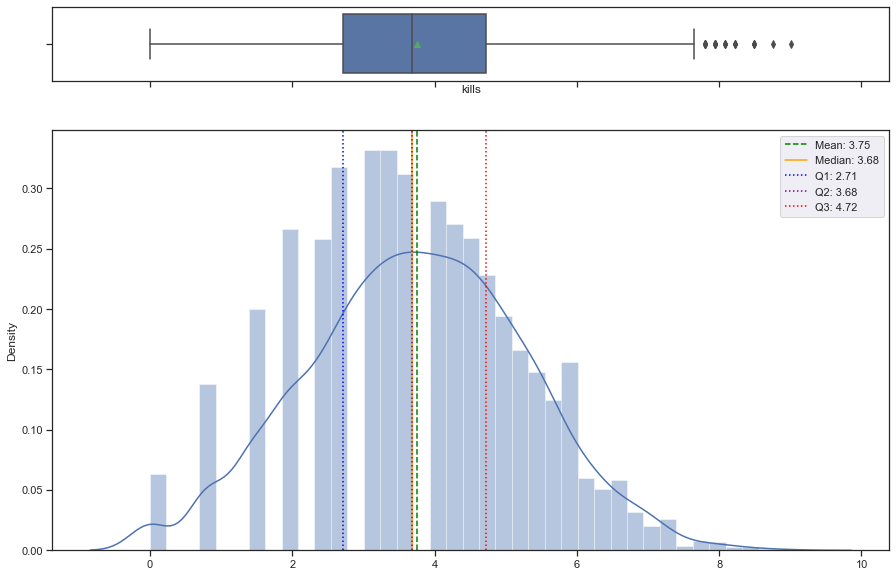

In [71]:
hist_box('kills')

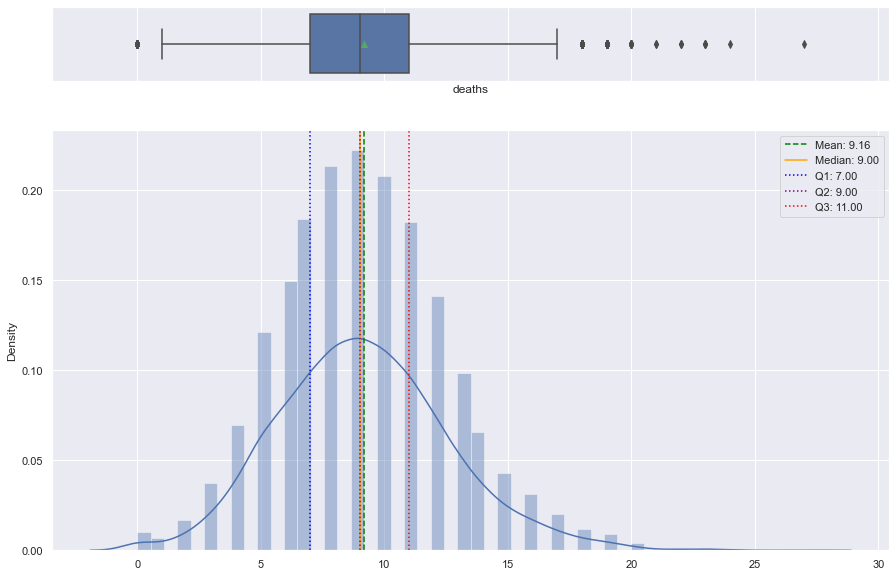

In [72]:
hist_box('deaths')

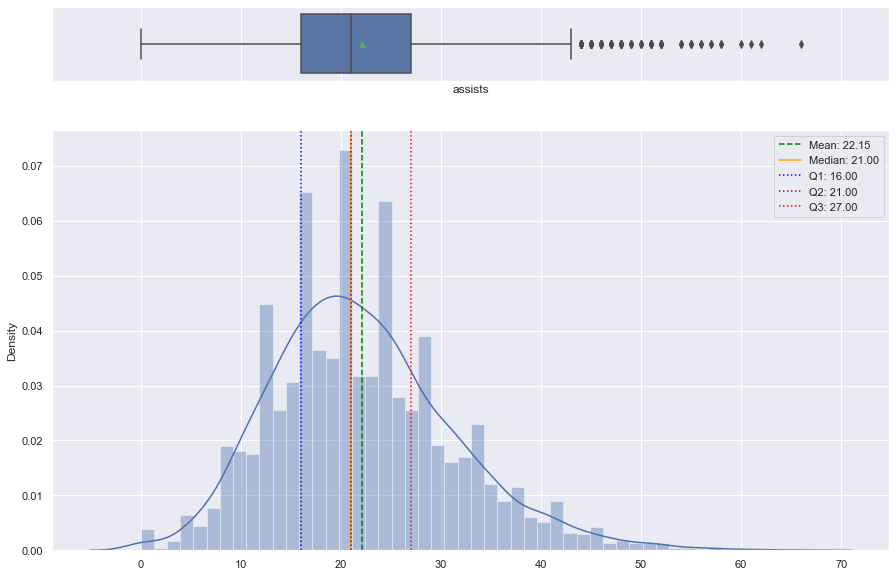

In [73]:
hist_box('assists')

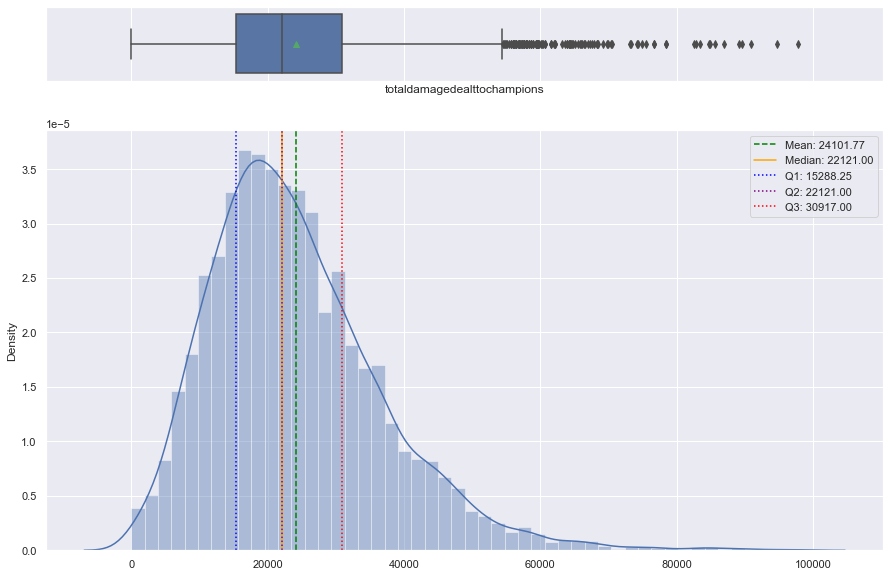

In [74]:
hist_box('totaldamagedealttochampions')

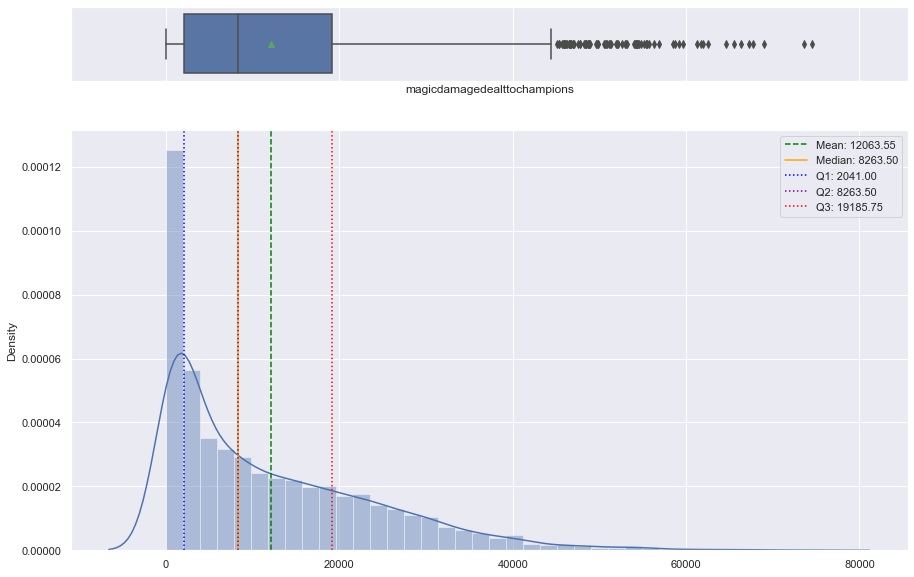

In [75]:
hist_box('magicdamagedealttochampions')

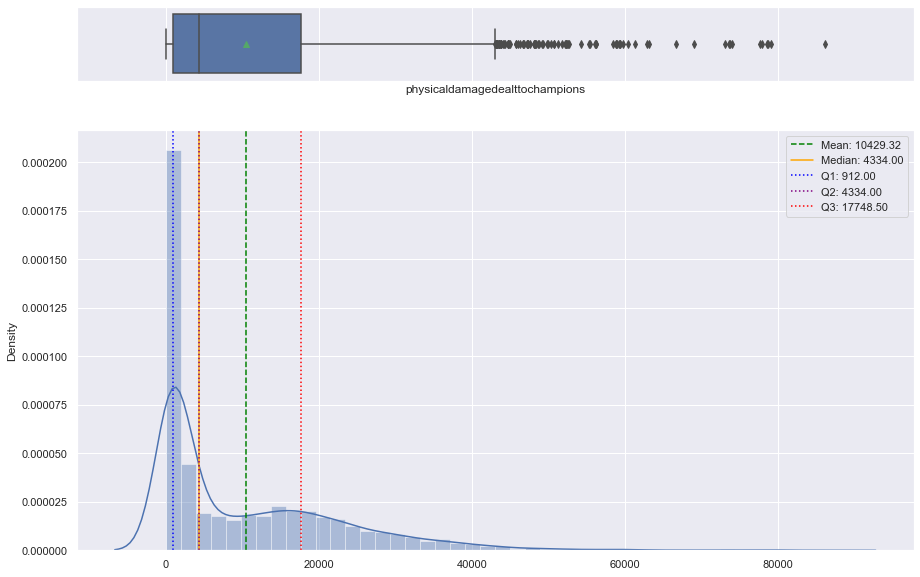

In [76]:
hist_box('physicaldamagedealttochampions')

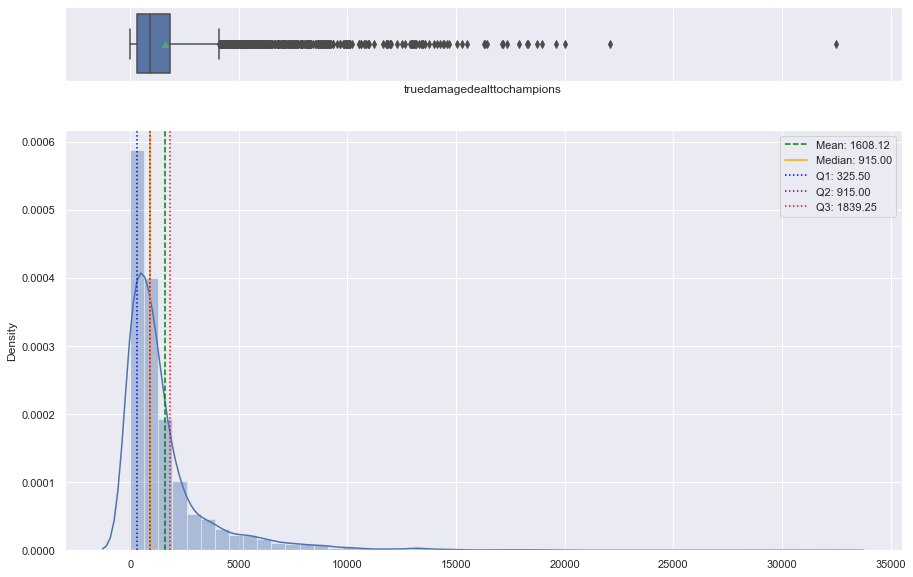

In [77]:
hist_box('truedamagedealttochampions')

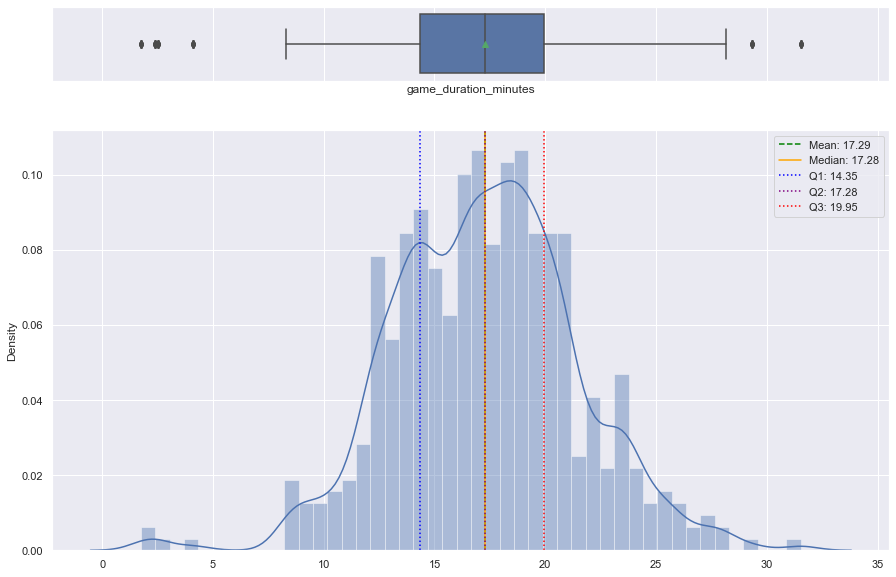

In [78]:
hist_box('game_duration_minutes')

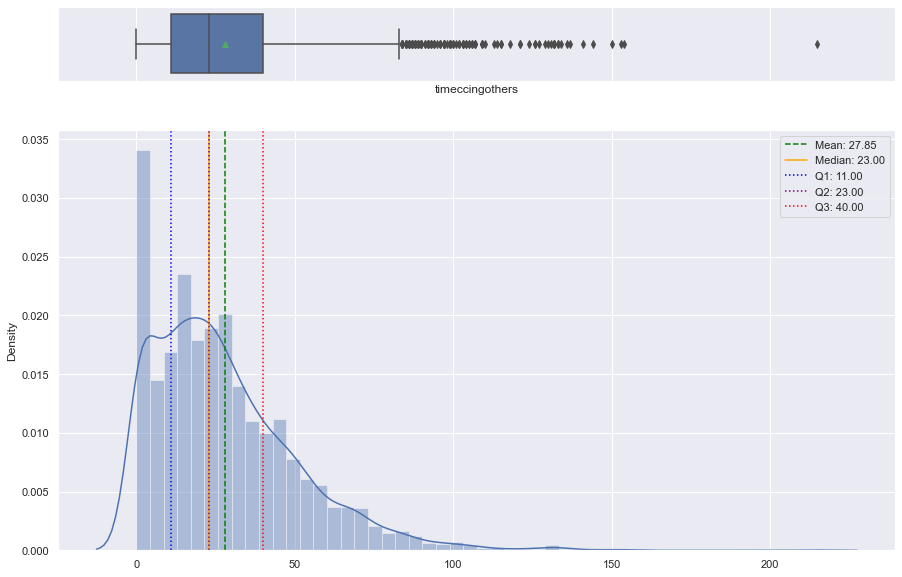

In [79]:
hist_box('timeccingothers')

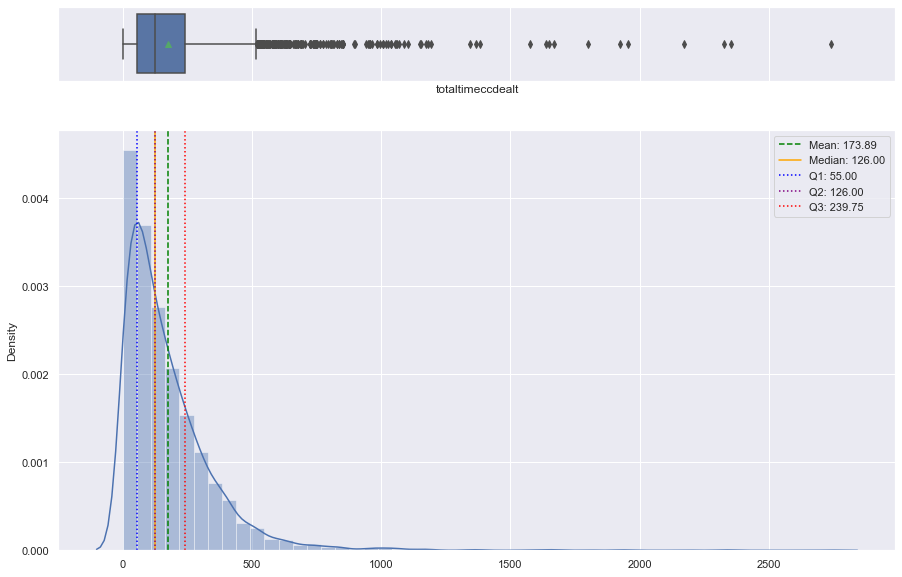

In [80]:
hist_box('totaltimeccdealt')

**Observations:**
- Every varaible is heavily right skewed, except for game_duration which has outliers on both sides
- The median kills are around 8 per game
- The median deaths are around 9 per game
- The median game length is around 17.12 minutes
- Magic damage is the most common damage type, with physical damage second, and true damage last

In [81]:
def plot_most_played_champs(dataframe, top_n=20):
    """
    Create a bar plot showing the most played champions.

    Parameters:
        dataframe (pd.DataFrame): The input DataFrame containing the data.
        top_n (int): Number of top champions to plot (default is 10).
    """
    # Count the occurrences of each champion
    champion_counts = dataframe['championname'].value_counts(1).head(top_n)
    
    # Create the bar plot
    plt.figure(figsize=(20, 6))
    champion_counts.plot(kind='bar')
    
    plt.title(f"Top {top_n} Most Played Champions")
    plt.xlabel("Champion")
    plt.ylabel("Number of Games Played")
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    plt.show()

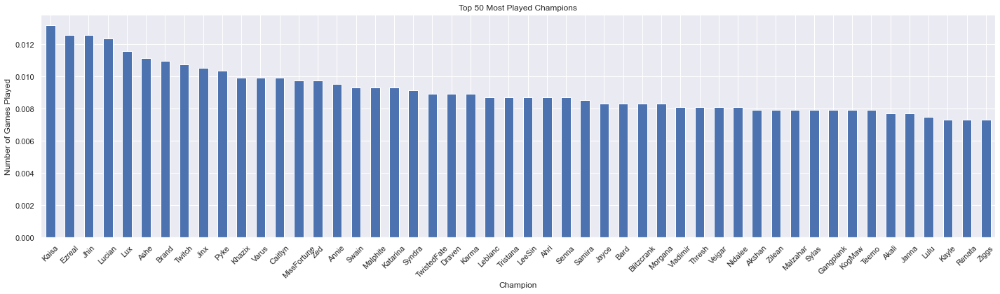

In [82]:
plot_most_played_champs(filtered_df, top_n=50)

Observation: AD Carries are still very prevelent as the most played champs but less so 

## Multivariable Analysis

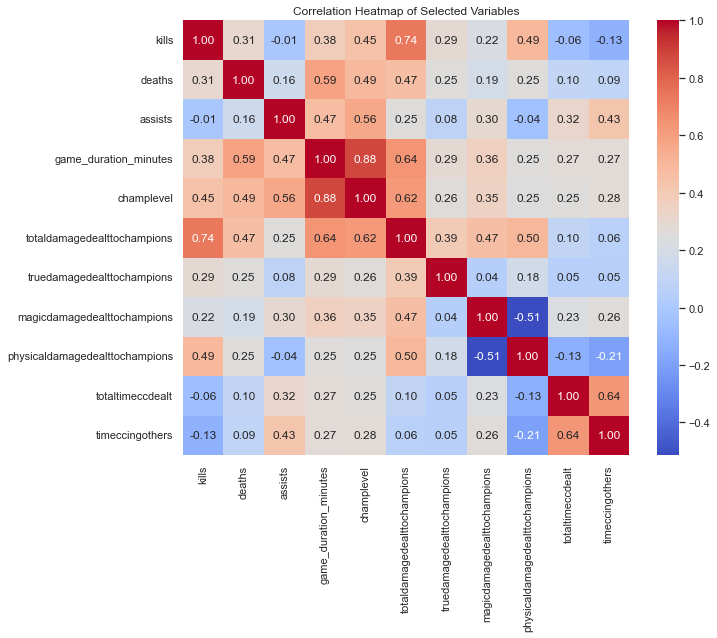

In [83]:
# Select specific columns for description
columns_to_describe = ['kills', 'deaths', 'assists', 'game_duration_minutes', 
'champlevel', 'totaldamagedealttochampions', 'truedamagedealttochampions',
'magicdamagedealttochampions', 'physicaldamagedealttochampions', 'totaltimeccdealt', 'timeccingothers'
                    
]

# Create a subset DataFrame with selected columns
subset_df = filtered_df[columns_to_describe]

# Calculate the correlation matrix
correlation_matrix = subset_df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create a heatmap using seaborn
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")

plt.title("Correlation Heatmap of Selected Variables")
plt.show()

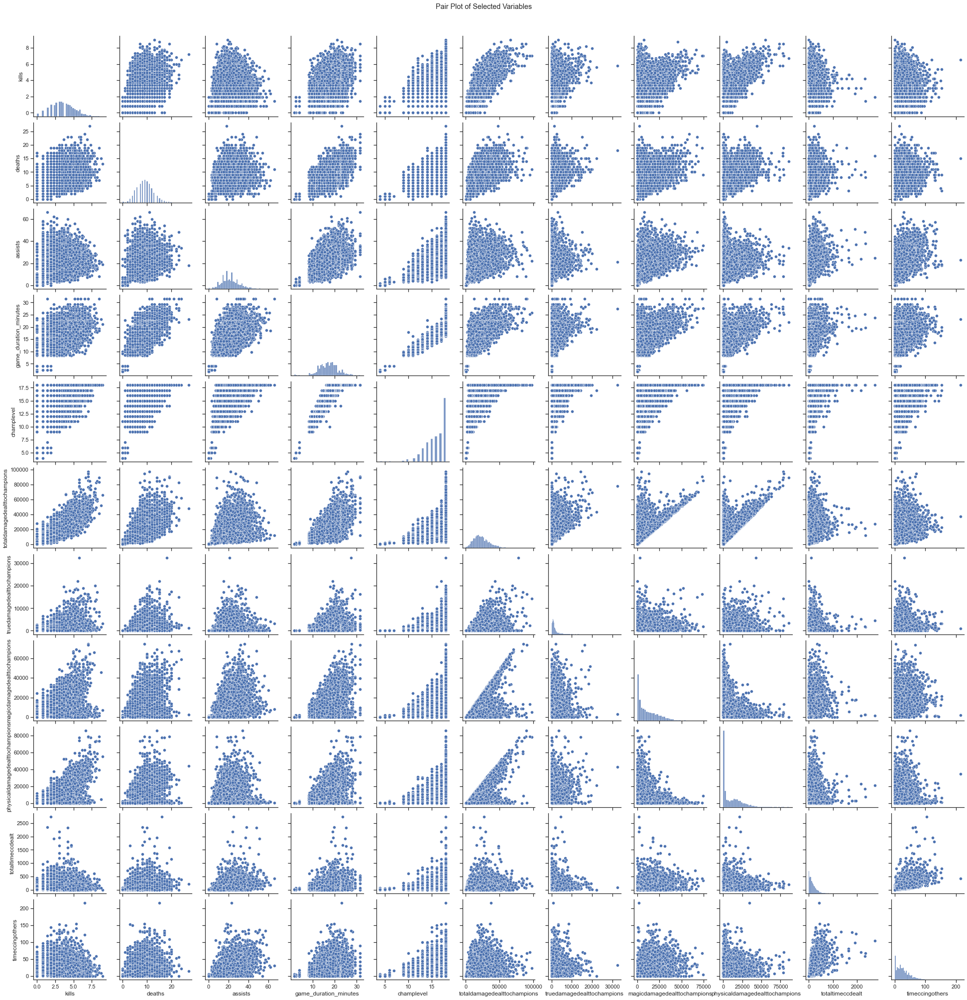

In [84]:
# Select specific columns for description
columns_to_describe = ['kills', 'deaths', 'assists', 'game_duration_minutes', 
'champlevel', 'totaldamagedealttochampions', 'truedamagedealttochampions',
'magicdamagedealttochampions', 'physicaldamagedealttochampions', 'totaltimeccdealt', 'timeccingothers'
                    
]

# Create a pair plot using seaborn
sns.set(style='ticks')
sns.pairplot(filtered_df[columns_to_describe])
plt.suptitle("Pair Plot of Selected Variables", y=1.02)
plt.show()

## More Multivariable Analysis

In [85]:
def plot_win_rate_vs_column(df, column_name):
    """
    Plots the win rate versus a specified column in the DataFrame.

    Args:
        df (pd.DataFrame): The DataFrame containing the data.
        column_name (str): The name of the column to analyze.

    Returns:
        None (displays a plot).
    """
    # Group the data by the specified column and calculate win rate
    column_counts = df[column_name].value_counts().sort_index()
    win_counts = df.groupby(column_name)['win'].sum().fillna(0).astype(int).reindex(column_counts.index, fill_value=0)
    win_rate = win_counts / column_counts

    # Create a bar plot
    plt.figure(figsize=(15, 6))
    plt.bar(win_rate.index, win_rate * 100, width=0.8, align='center')
    plt.xlabel(column_name)
    plt.ylabel('Win Rate (%)')
    plt.title(f'Win Rate vs. {column_name}')
    plt.xticks(win_rate.index)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.ylim(0, 100)

    # Show the plot
    plt.show()

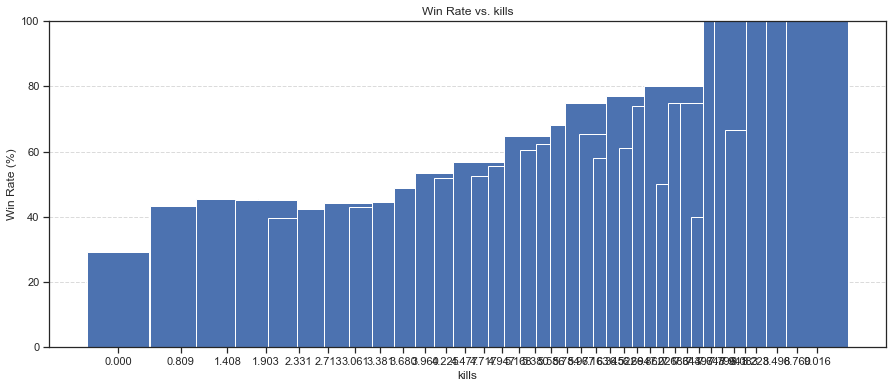

In [86]:
plot_win_rate_vs_column(filtered_df, 'kills')

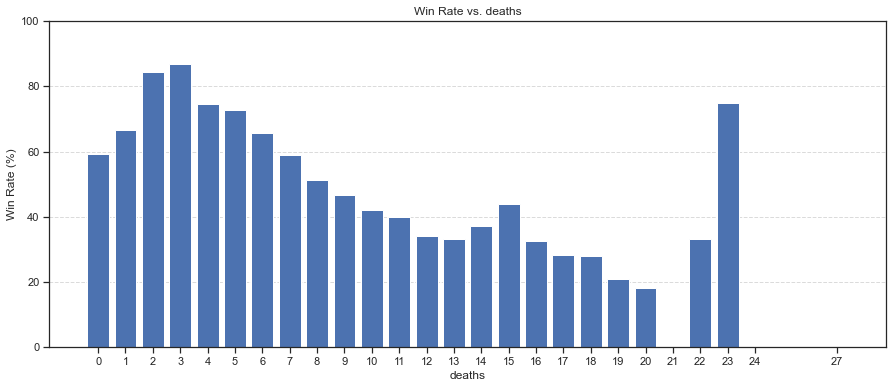

In [87]:
plot_win_rate_vs_column(filtered_df, 'deaths')

## Data Preprocessing for clustering

In [88]:
# Columns to for clustering 
columns_for_clustering = ['kills', 'deaths', 'assists', 'game_duration_minutes', 
'champlevel', 'totaldamagedealttochampions', 'truedamagedealttochampions',
'magicdamagedealttochampions', 'physicaldamagedealttochampions', 'totaltimeccdealt', 'timeccingothers'
                    
]
df_clustering_solo_q = filtered_df[columns_for_clustering]

In [89]:
scaler = StandardScaler()
data_scaled_solo_q = pd.DataFrame(scaler.fit_transform(df_clustering_solo_q), columns = df_clustering_solo_q.columns)

In [90]:
# Defining the number of principal components to generate
n = data_scaled_solo_q.shape[1]

# Finding principal components for the data
pca = PCA(n_components = n, random_state = 1)

data_pca1_solo_q = pd.DataFrame(pca.fit_transform(data_scaled_solo_q))

# The percentage of variance explained by each principal component
exp_var_solo_q = pca.explained_variance_ratio_

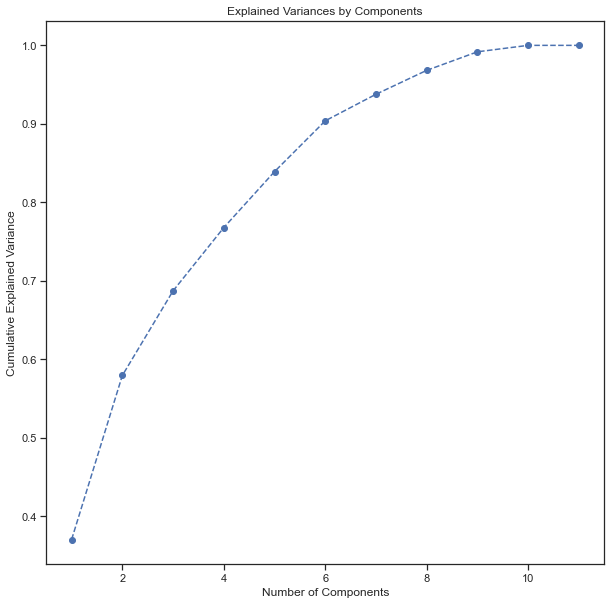

In [91]:
# Plotting the explained cumulative variance by principal components
plt.figure(figsize = (10, 10))

plt.plot(range(1, 12), pca.explained_variance_ratio_.cumsum(), marker = 'o', linestyle = '--')

plt.title("Explained Variances by Components")

plt.xlabel("Number of Components")

plt.ylabel("Cumulative Explained Variance")

plt.show()

In [92]:
# Finding the least number of components that can explain more than 70% variance
sum = 0

for ix, i in enumerate(exp_var_solo_q):

    sum = sum + i
    
    if(sum>0.70):
        
        print("Number of PCs that explain at least 70% variance:", ix + 1)
        break

Number of PCs that explain at least 70% variance: 4


In [93]:
pc_comps = ['PC1', 'PC2', 'PC3', 'PC4']

data_pca_solo_q = pd.DataFrame(np.round(pca.components_[:4,:],2), index = pc_comps, columns = data_scaled_solo_q.columns)

data_pca_solo_q.T

,PC1,PC2,PC3,PC4
kills,0.30,-0.35,-0.21,0.14
deaths,0.32,-0.10,0.03,-0.09
assists,0.26,0.31,0.17,-0.35
game_duration_minutes,0.44,0.03,0.05,-0.21
champlevel,0.44,0.04,0.06,-0.27
totaldamagedealttochampions,0.42,-0.20,-0.18,0.10
truedamagedealttochampions,0.21,-0.14,0.04,0.74
magicdamagedealttochampions,0.23,0.30,-0.68,0.04
physicaldamagedealttochampions,0.17,-0.48,0.48,-0.08
totaltimeccdealt,0.17,0.41,0.32,0.33


In [94]:
def color_high(val):
    
    if val < -0.25:                     # You can decide any value as per your understanding
        return 'background: pink'
    
    elif val > 0.25:
        return 'background: skyblue'   
    
data_pca_solo_q.T.style.applymap(color_high)

,PC1,PC2,PC3,PC4
kills,0.300000,-0.350000,-0.210000,0.140000
deaths,0.320000,-0.100000,0.030000,-0.090000
assists,0.260000,0.310000,0.170000,-0.350000
game_duration_minutes,0.440000,0.030000,0.050000,-0.210000
champlevel,0.440000,0.040000,0.060000,-0.270000
totaldamagedealttochampions,0.420000,-0.200000,-0.180000,0.100000
truedamagedealttochampions,0.210000,-0.140000,0.040000,0.740000
magicdamagedealttochampions,0.230000,0.300000,-0.680000,0.040000
physicaldamagedealttochampions,0.170000,-0.480000,0.480000,-0.080000
totaltimeccdealt,0.170000,0.410000,0.320000,0.330000


In [95]:
plt.figure(figsize = (7,7))

sns.scatterplot(x = data_pca_solo_q[0], y = data_pca_solo_q[1])

plt.xlabel("PC1")

plt.ylabel("PC2")

plt.show()

KeyError: 0

<Figure size 504x504 with 0 Axes>

## t-sne

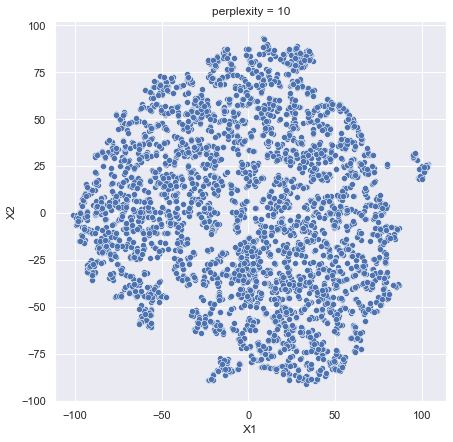

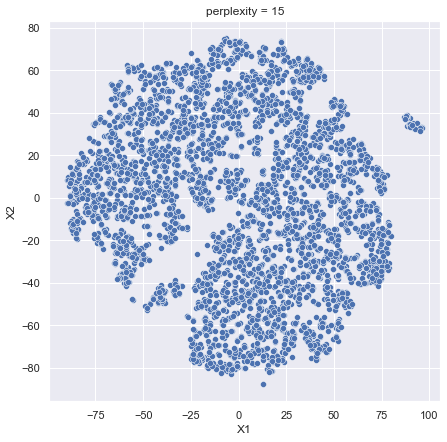

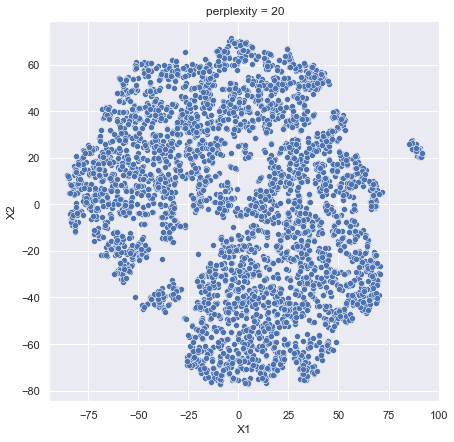

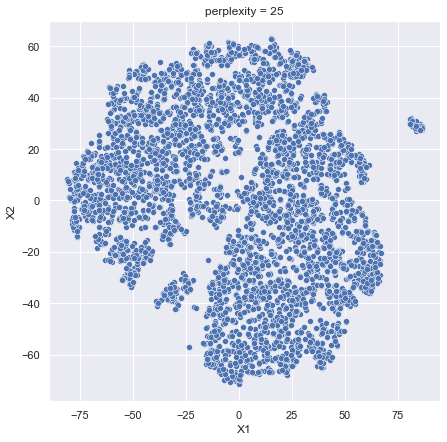

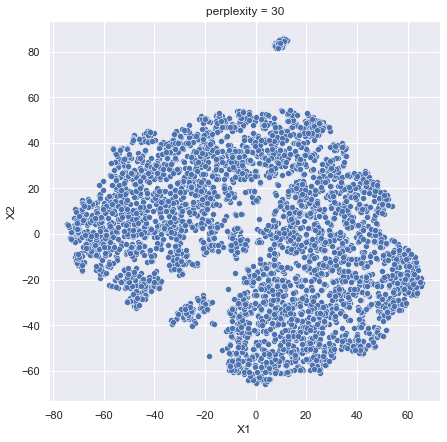

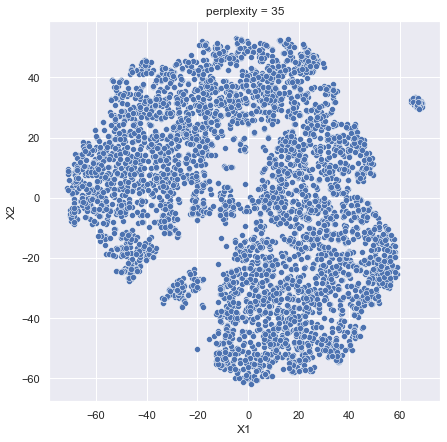

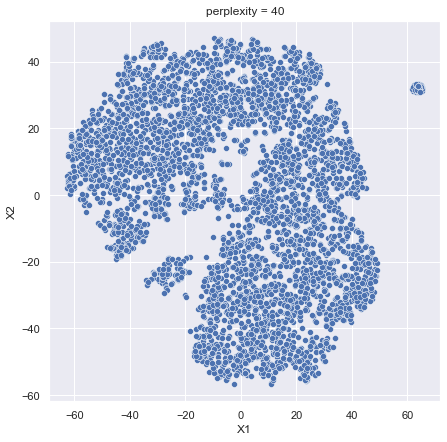

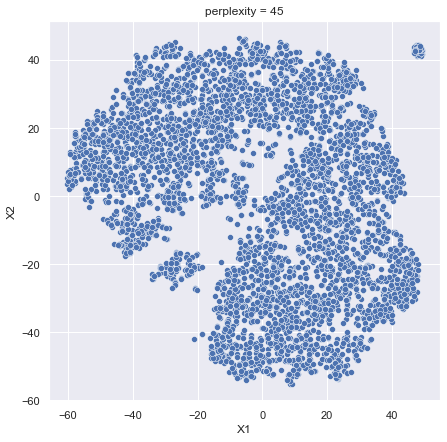

In [ ]:
for i in range(10, 50, 5):
    tsne = TSNE(n_components = 2, random_state = 1, perplexity = i)
    
    data_tsne_solo_q = tsne.fit_transform(data_scaled_solo_q)
    
    data_tsne_solo_q = pd.DataFrame(data_tsne_solo_q)
    
    data_tsne_solo_q.columns = ['X1', 'X2']
    
    plt.figure(figsize = (7,7))
    
    sns.scatterplot(x = 'X1', y = 'X2', data = data_tsne_solo_q)
    
    plt.title("perplexity = {}".format(i))

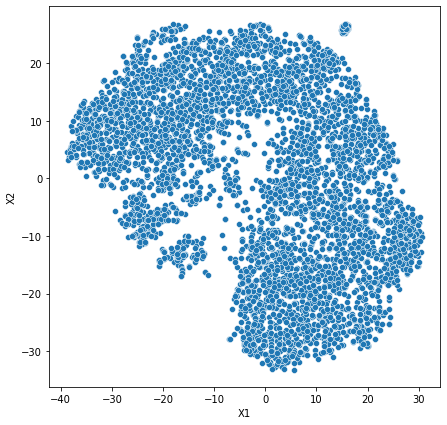

In [ ]:
# Fitting t-SNE with number of components equal to 2
tsne = TSNE(n_components = 2, random_state = 1, perplexity = 100)

data_tsne_solo_q = tsne.fit_transform(data_scaled_solo_q)

# Converting the embeddings to a dataframe
data_tsne_solo_q = pd.DataFrame(data_tsne_solo_q, columns = ["X1", "X2"])

# Scatter plot for two components
plt.figure(figsize = (7, 7))

sns.scatterplot(x = 'X1', y = 'X2', data = data_tsne_solo_q)

plt.show()

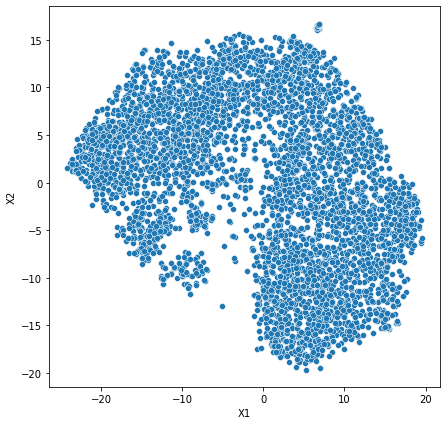

In [ ]:
# Fitting t-SNE with number of components equal to 2
tsne = TSNE(n_components = 2, random_state = 1, perplexity = 200)

data_tsne_solo_q = tsne.fit_transform(data_scaled_solo_q)

# Converting the embeddings to a dataframe
data_tsne_solo_q = pd.DataFrame(data_tsne_solo_q, columns = ["X1", "X2"])

# Scatter plot for two components
plt.figure(figsize = (7, 7))

sns.scatterplot(x = 'X1', y = 'X2', data = data_tsne_solo_q)

plt.show()

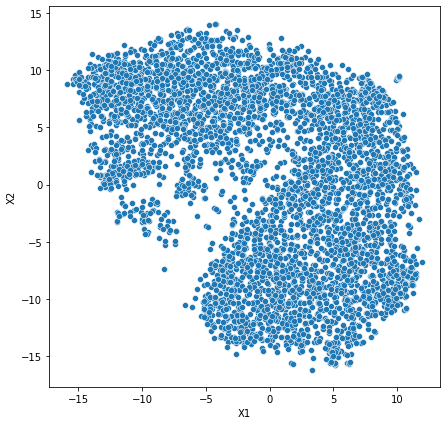

In [ ]:
# Fitting t-SNE with number of components equal to 2
tsne = TSNE(n_components = 2, random_state = 1, perplexity = 300)

data_tsne_solo_q = tsne.fit_transform(data_scaled_solo_q)

# Converting the embeddings to a dataframe
data_tsne_solo_q = pd.DataFrame(data_tsne_solo_q, columns = ["X1", "X2"])

# Scatter plot for two components
plt.figure(figsize = (7, 7))

sns.scatterplot(x = 'X1', y = 'X2', data = data_tsne_solo_q)

plt.show()

**Observation:** There isnt a clear grouping however, with perplexity 30 we clearly get two groupings. Although it might be more like three groupings in some of the cases

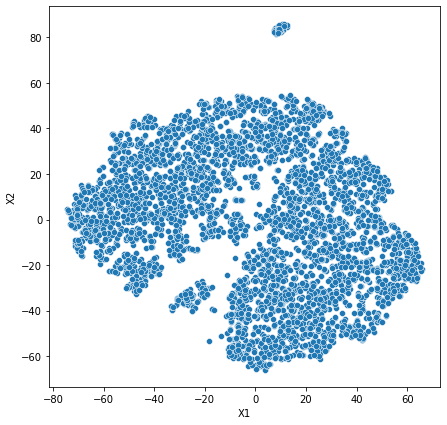

In [ ]:
# Fitting t-SNE with number of components equal to 2
tsne = TSNE(n_components = 2, random_state = 1, perplexity = 30)

data_tsne_solo_q = tsne.fit_transform(data_scaled_solo_q)

# Converting the embeddings to a dataframe
data_tsne_solo_q = pd.DataFrame(data_tsne_solo_q, columns = ["X1", "X2"])

# Scatter plot for two components
plt.figure(figsize = (7, 7))

sns.scatterplot(x = 'X1', y = 'X2', data = data_tsne_solo_q)

plt.show()

In [ ]:
# Let's assign points to 4 different groups
def grouping(x):
    first_component = x['X1']
    
    second_component = x['X2']
    
    if second_component > 60:
        return 'group_1'
    return 'group_2'

In [ ]:
data_tsne_solo_q['groups'] = data_tsne_solo_q.apply(grouping, axis = 1)

<AxesSubplot:xlabel='X1', ylabel='X2'>

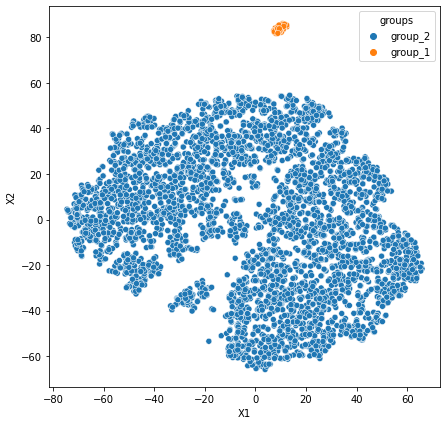

In [ ]:
# Scatter plot for two components with hue
plt.figure(figsize = (7, 7))

sns.scatterplot(x = 'X1', y = 'X2', data = data_tsne_solo_q, hue = 'groups')

Now, that we have two groupings we can start to measure the differences in these two groups

['kills', 'deaths', 'assists', 'game_duration_minutes', 'champlevel', 'totaldamagedealttochampions', 'truedamagedealttochampions', 'magicdamagedealttochampions', 'physicaldamagedealttochampions', 'totaltimeccdealt', 'timeccingothers']


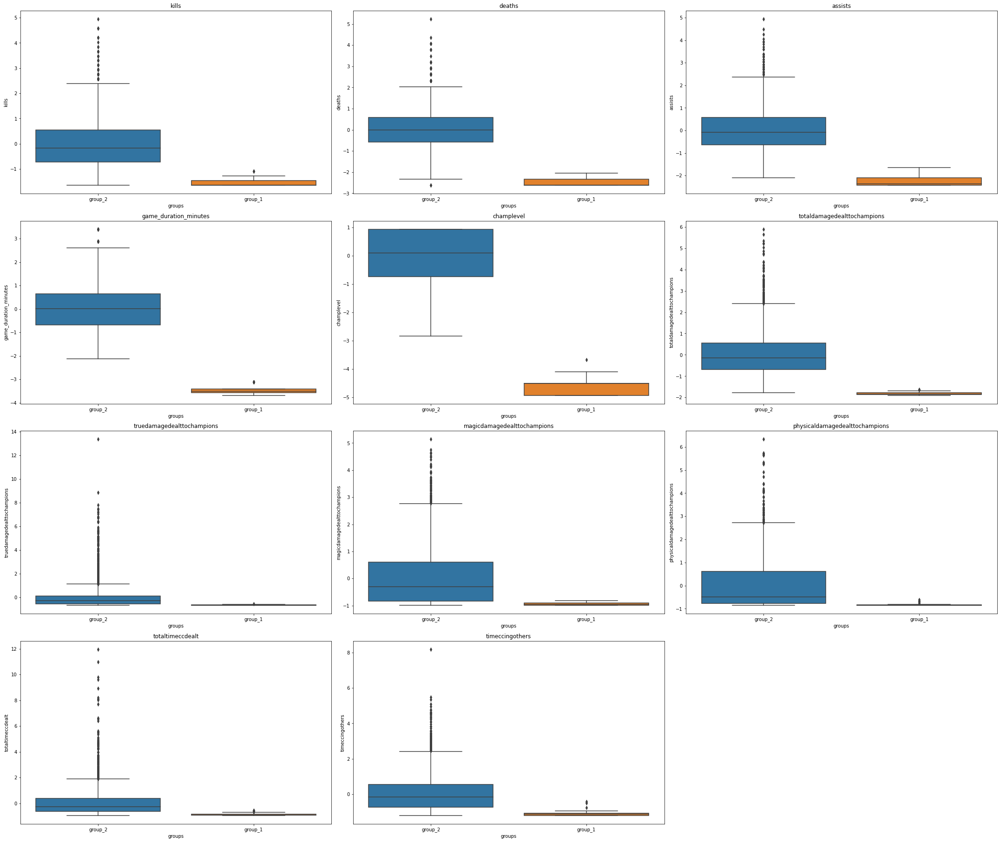

In [ ]:
all_col = data_scaled_solo_q.columns.tolist()
print(all_col)
plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)
    
    sns.boxplot(y=data_scaled_solo_q[variable], x=data_tsne_solo_q['groups'])
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

**Observation** From this grouping we can see that group_1 is made up of games where it is a very short game, low kills, deaths, any type of damage. This indicates as someone who has domain knowledge of the game, can tell these are remake games, or games that end extremely quickly, to the point where they probably are games where teams gave up.

In [ ]:
data_tsne_solo_q = data_tsne_solo_q.drop(columns='groups')

In [ ]:
data_tsne_solo_q.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4270 entries, 0 to 4269
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X1      4270 non-null   float32
 1   X2      4270 non-null   float32
dtypes: float32(2)
memory usage: 33.5 KB


In [ ]:
# K-Means clustering
kmeans = KMeans(n_clusters=3, max_iter=100)
kmeans_labels = kmeans.fit_predict(data_tsne_solo_q)

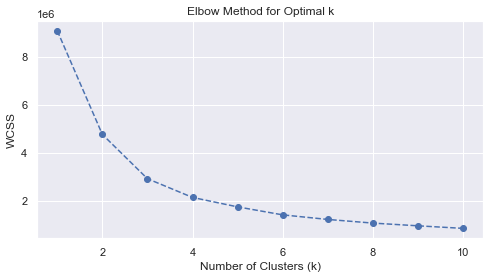

In [ ]:
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_tsne_solo_q)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 4))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')
plt.title('Elbow Method for Optimal k')
plt.show()

In [ ]:
silhouette_scores = []
# Define the range of cluster numbers to iterate through
cluster_range = range(2, 12)  # Start from 2 clusters and go up to 11 clusters

for n_clusters in cluster_range:
    # Create and fit the K-Means model
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(data_tsne_solo_q)
    
    # Calculate the Silhouette Score for this iteration
    silhouette_avg = silhouette_score(data_tsne_solo_q, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    
    print(f"Silhouette Score for {n_clusters} clusters: {silhouette_avg}")

Silhouette Score for 2 clusters: 0.42947752899788655
Silhouette Score for 3 clusters: 0.43637069259853156
Silhouette Score for 4 clusters: 0.4118335391382668
Silhouette Score for 5 clusters: 0.37956595666781956
Silhouette Score for 6 clusters: 0.38166049405316765
Silhouette Score for 7 clusters: 0.3716530880242018
Silhouette Score for 8 clusters: 0.3779714847934233
Silhouette Score for 9 clusters: 0.36847671823751554
Silhouette Score for 10 clusters: 0.37455342425207827
Silhouette Score for 11 clusters: 0.3749810220214622


Text(0.5, 1.0, 'K-Means Clustering')

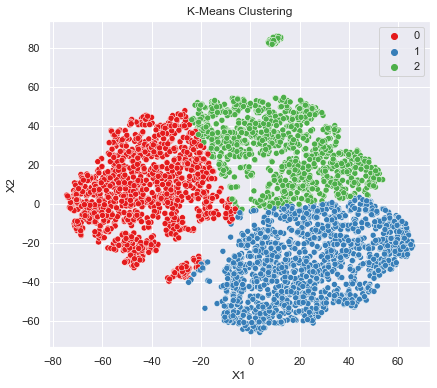

In [ ]:
# Plot the results
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(x='X1', y='X2', data=data_tsne_solo_q, hue=kmeans_labels, palette='Set1')
plt.title("K-Means Clustering")

In [ ]:
data_tsne_solo_q['groups'] = kmeans_labels


In [ ]:
data_tsne_solo_q.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4270 entries, 0 to 4269
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X1      4270 non-null   float32
 1   X2      4270 non-null   float32
 2   groups  4270 non-null   int32  
dtypes: float32(2), int32(1)
memory usage: 50.2 KB


['kills', 'deaths', 'assists', 'game_duration_minutes', 'champlevel', 'totaldamagedealttochampions', 'truedamagedealttochampions', 'magicdamagedealttochampions', 'physicaldamagedealttochampions', 'totaltimeccdealt', 'timeccingothers']


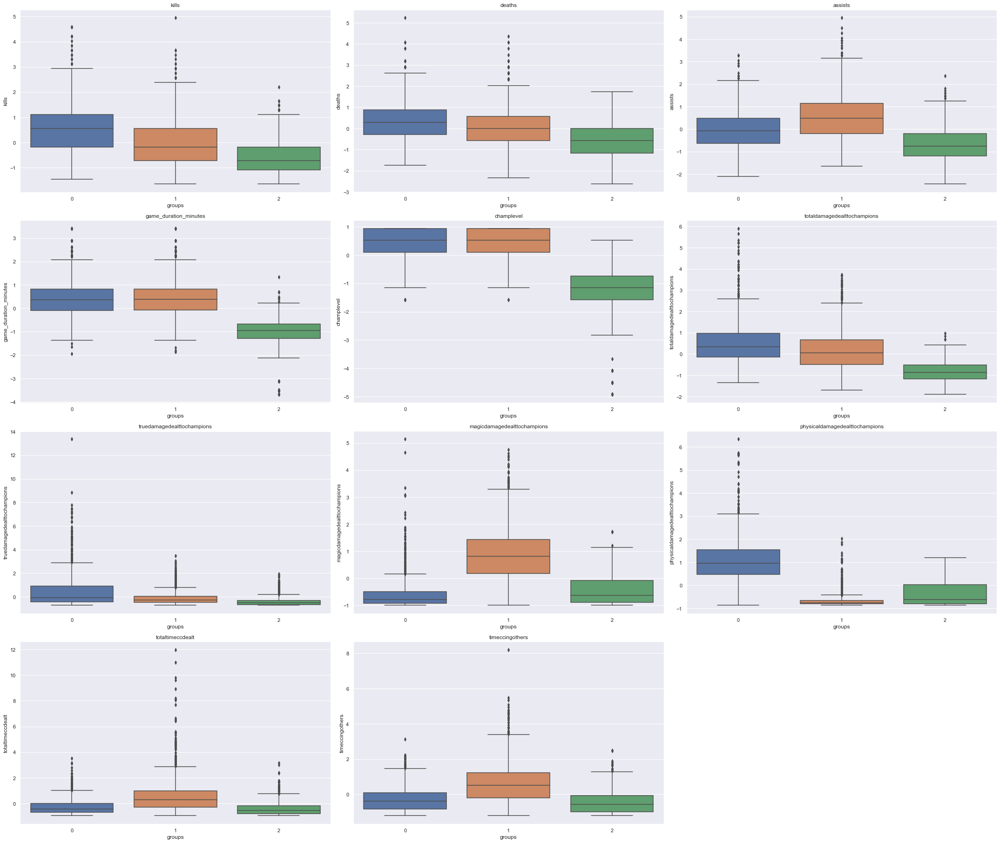

In [ ]:
all_col = data_scaled_solo_q.columns.tolist()
print(all_col)
plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)
    
    sns.boxplot(y=data_scaled_solo_q[variable], x=data_tsne_solo_q['groups'])
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

In [ ]:
# DBSCAN clustering
dbscan = DBSCAN(eps=.05, min_samples=20)
dbscan_labels = dbscan.fit_predict(data_tsne_solo_q)

Text(0.5, 1.0, 'DBSCAN Clustering')

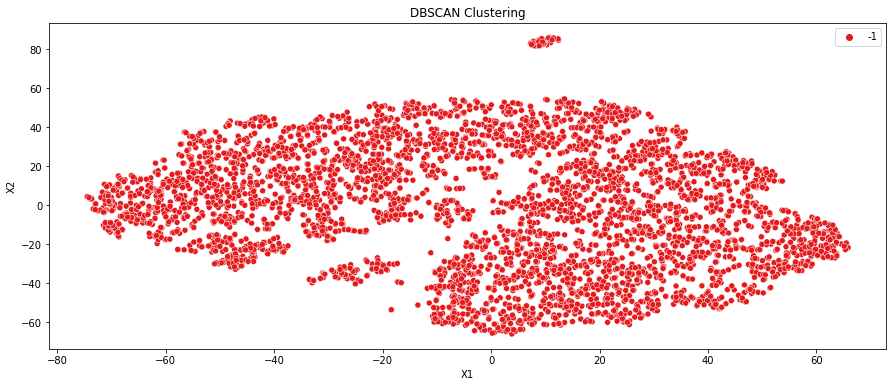

In [ ]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x='X1', y='X2', data=data_tsne_solo_q, hue=dbscan_labels, palette='Set1')
plt.title("DBSCAN Clustering")

Observation: DBSCAN does not seem to be very good at clustering, I've tried mutliple parameter changes without good results.

In [ ]:
# Agglomerative Clustering
agglomerative = AgglomerativeClustering(n_clusters=4)
agglomerative_labels = agglomerative.fit_predict(data_tsne_solo_q)

Text(0.5, 1.0, 'Agglomerative Clustering')

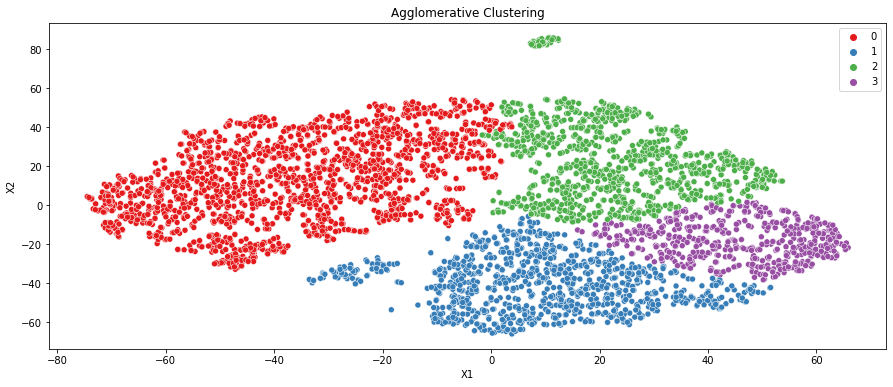

In [ ]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x='X1', y='X2', data=data_tsne_solo_q, hue=agglomerative_labels, palette='Set1')
plt.title("Agglomerative Clustering")

**Observation:** This seems to be a fairly close clustering to k-means

In [ ]:
data_tsne_solo_q['groups'] = agglomerative_labels

['kills', 'deaths', 'assists', 'game_duration_minutes', 'champlevel', 'totaldamagedealttochampions', 'truedamagedealttochampions', 'magicdamagedealttochampions', 'physicaldamagedealttochampions', 'totaltimeccdealt', 'timeccingothers']


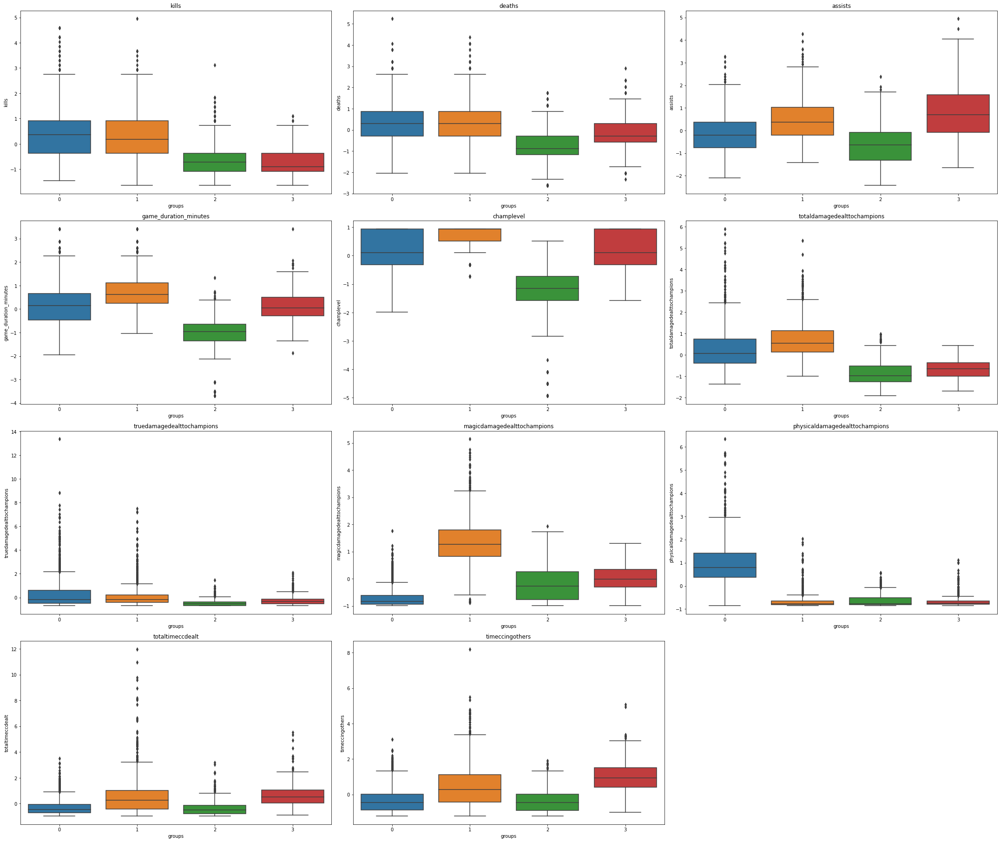

In [ ]:
all_col = data_scaled_solo_q.columns.tolist()
print(all_col)
plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)
    
    sns.boxplot(y=data_scaled_solo_q[variable], x=data_tsne_solo_q['groups'])
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

## **Comparing My Solo Q Games To General Population**

In [144]:
def prepare_data_for_t_test(group1, group2, alpha=0.05):
    """
    Prepares data for a t-test and checks assumptions.
    
    Parameters:
    - group1: The data for the first group.
    - group2: The data for the second group.
    - alpha: The significance level for hypothesis testing (default is 0.05).

    Returns:
    - A tuple (prepared_group1, prepared_group2) containing the prepared data for each group.
    - A boolean indicating whether the assumptions are met.
    """
    
    # Check for normality using the Shapiro-Wilk test
    _, p_value1 = stats.shapiro(group1)
    _, p_value2 = stats.shapiro(group2)
    
    # Check for equal variance using Levene's test
    _, p_value_variance = stats.levene(group1, group2)
    
    # Check if all assumptions are met
    assumptions_met = (p_value1 > alpha and p_value2 > alpha and p_value_variance > alpha)
    
    if assumptions_met:
        return group1, group2, True
    else:
        print("Assumptions for t-test are not met:")
        if p_value1 <= alpha:
            print("Group 1 is not normally distributed.")
        if p_value2 <= alpha:
            print("Group 2 is not normally distributed.")
        if p_value_variance <= alpha:
            print("Variances are not equal between groups.")
        
        return None, None, False

In [146]:
# Example usage:
group1 = df['kills']
group2 = filtered_df['kills']

prepared_group1, prepared_group2, assumptions_met = prepare_data_for_t_test(group1, group2)

if assumptions_met:
    # Perform the t-test using prepared_group1 and prepared_group2
    t_statistic, p_value = stats.ttest_ind(prepared_group1, prepared_group2)
    print(f"t-statistic: {t_statistic}")
    print(f"P-value: {p_value}")
else:
    print("Cannot perform t-test due to violated assumptions.")

Assumptions for t-test are not met:
Group 1 is not normally distributed.
Group 2 is not normally distributed.
Variances are not equal between groups.
Cannot perform t-test due to violated assumptions.


Since our data is not normally distributed we cant use a t-test to see if these groups are different. So, we have to use some other test, such as the U-test

In [152]:
def mann_whitney_test(df, filtered_df, column, alpha=0.05):
    """
    Performs a Mann-Whitney U test to compare two columns in a DataFrame.

    Parameters:
    - df: The DataFrame containing the data.
    - column: The name of the column to compare.
    - alpha: The significance level for hypothesis testing (default is 0.05).

    Returns:
    - A tuple containing (U statistic, p-value).
    - A conclusion indicating whether there is a significant difference.
    """
    
    group1 = df[column]
    group2 = filtered_df[column]
    
    statistic, p_value = stats.mannwhitneyu(group1, group2, alternative='two-sided')
    
    conclusion = "There is a statistically significant difference between the two groups." if p_value < alpha else "There is no statistically significant difference between the two groups."
    
    return statistic, p_value, conclusion

In [84]:
def compare_hist_box(df1, df2, col1, col2):
    f, (ax_box1, ax_hist1, ax_box2, ax_hist2) = plt.subplots(4, sharex=True, 
                                                         gridspec_kw={'height_ratios': (0.15, 0.85, 0.15, 0.85)}, 
                                                         figsize=(15, 10))
    sns.set(style='darkgrid')

    # Adding a box plot for df1[col1]
    sns.boxplot(x=df1[col1], ax=ax_box1, showmeans=True)
    sns.distplot(x=df1[col1], ax=ax_hist1)
    mean_val1 = df1[col1].mean()
    median_val1 = df1[col1].median()
    std_val1 = df1[col1].std()
    q1_val1 = df1[col1].quantile(0.25)
    q2_val1 = df1[col1].quantile(0.5)
    q3_val1 = df1[col1].quantile(0.75)

    ax_hist1.axvline(mean_val1, color='green', linestyle='--', label=f'Mean: {mean_val1:.2f}')
    ax_hist1.axvline(median_val1, color='orange', linestyle='-', label=f'Median: {median_val1:.2f}')
    ax_hist1.axvline(q1_val1, color='blue', linestyle=':', label=f'Q1: {q1_val1:.2f}')
    ax_hist1.axvline(q2_val1, color='purple', linestyle=':', label=f'Q2: {q2_val1:.2f}')
    ax_hist1.axvline(q3_val1, color='red', linestyle=':', label=f'Q3: {q3_val1:.2f}')

    # Adding a box plot for df2[col2]
    sns.boxplot(x=df2[col2], ax=ax_box2, showmeans=True)
    sns.distplot(x=df2[col2], ax=ax_hist2)
    mean_val2 = df2[col2].mean()
    median_val2 = df2[col2].median()
    std_val2 = df2[col2].std()
    q1_val2 = df2[col2].quantile(0.25)
    q2_val2 = df2[col2].quantile(0.5)
    q3_val2 = df2[col2].quantile(0.75)

    ax_hist2.axvline(mean_val2, color='green', linestyle='--', label=f'Mean: {mean_val2:.2f}')
    ax_hist2.axvline(median_val2, color='orange', linestyle='-', label=f'Median: {median_val2:.2f}')
    ax_hist2.axvline(q1_val2, color='blue', linestyle=':', label=f'Q1: {q1_val2:.2f}')
    ax_hist2.axvline(q2_val2, color='purple', linestyle=':', label=f'Q2: {q2_val2:.2f}')
    ax_hist2.axvline(q3_val2, color='red', linestyle=':', label=f'Q3: {q3_val2:.2f}')

    ax_hist1.legend()
    ax_hist2.legend()

    plt.show()

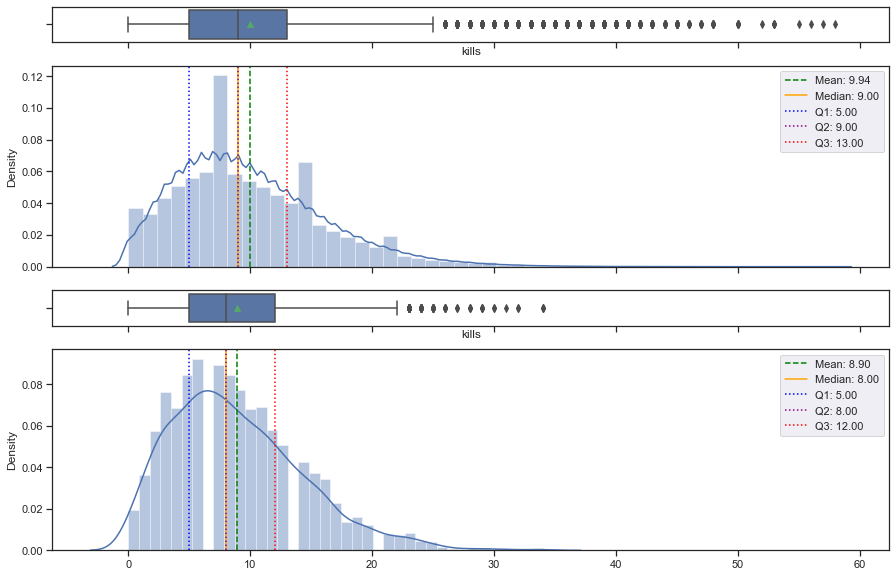

In [86]:
compare_hist_box(df, filtered_df, 'kills', 'kills')

In [156]:
statistic, p_value, conclusion = mann_whitney_test(df, filtered_df, 'kills', alpha=0.05)
print(statistic)
print(p_value)
print(conclusion)

1197617110.5
1.2423298219873757e-21
There is a statistically significant difference between the two groups.


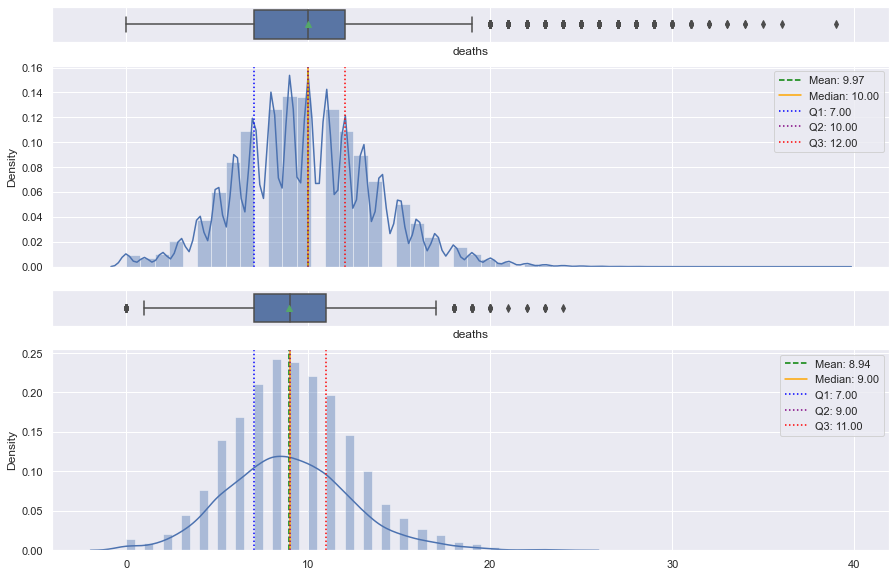

In [90]:
compare_hist_box(df, filtered_df, 'deaths', 'deaths')

In [157]:
statistic, p_value, conclusion = mann_whitney_test(df, filtered_df, 'deaths', alpha=0.05)
print(statistic)
print(p_value)
print(conclusion)

1268786722.5
8.605704425867267e-64
There is a statistically significant difference between the two groups.


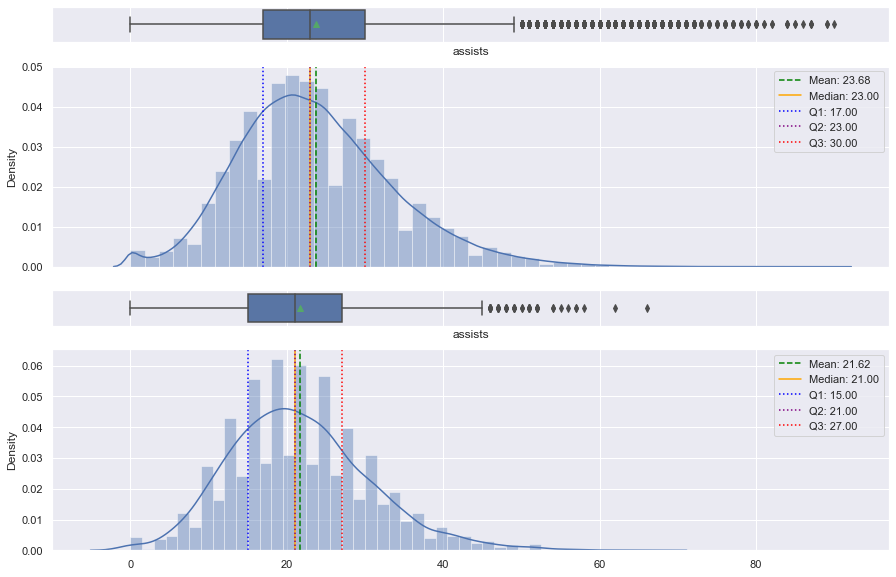

In [ ]:
compare_hist_box(df, matches, 'assists', 'assists')

In [158]:
statistic, p_value, conclusion = mann_whitney_test(df, filtered_df, 'assists', alpha=0.05)
print(statistic)
print(p_value)
print(conclusion)

1225253233.0
3.879845451622324e-35
There is a statistically significant difference between the two groups.


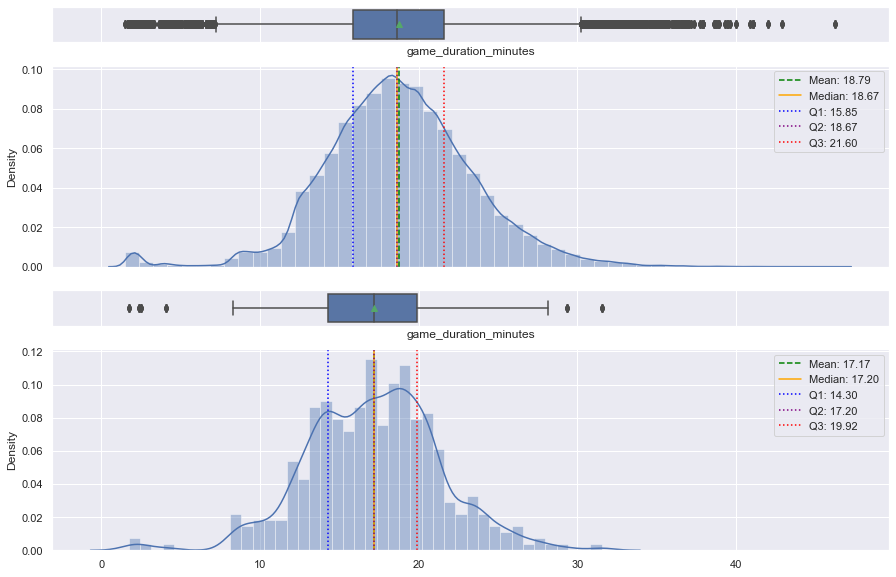

In [92]:
compare_hist_box(df, filtered_df, 'game_duration_minutes', 'game_duration_minutes')

In [159]:
statistic, p_value, conclusion = mann_whitney_test(df, filtered_df, 'game_duration_minutes', alpha=0.05)
print(statistic)
print(p_value)
print(conclusion)

1329338950.0
6.233673798308362e-117
There is a statistically significant difference between the two groups.


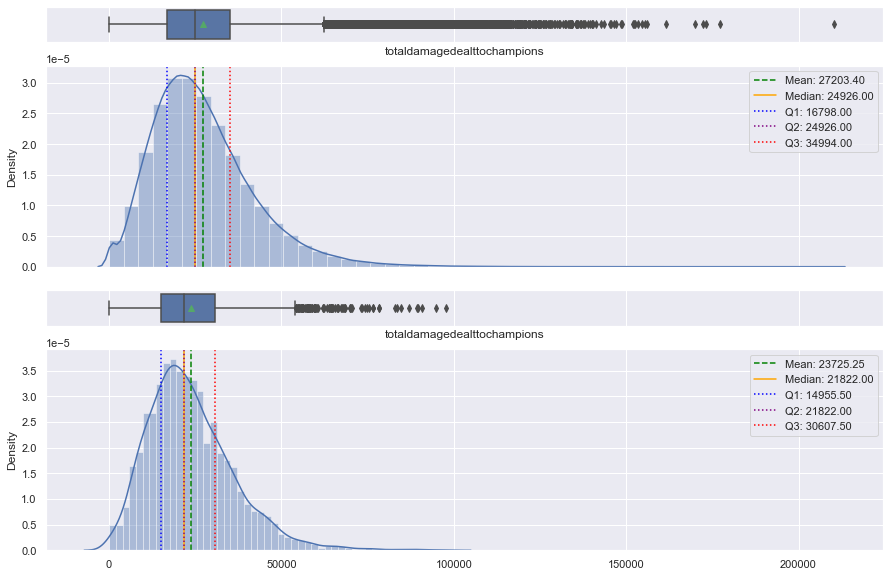

In [95]:
compare_hist_box(df, filtered_df, 'totaldamagedealttochampions', 'totaldamagedealttochampions')

In [160]:
statistic, p_value, conclusion = mann_whitney_test(df, filtered_df, 'totaldamagedealttochampions', alpha=0.05)
print(statistic)
print(p_value)
print(conclusion)

1247728737.0
1.2283456620864182e-48
There is a statistically significant difference between the two groups.


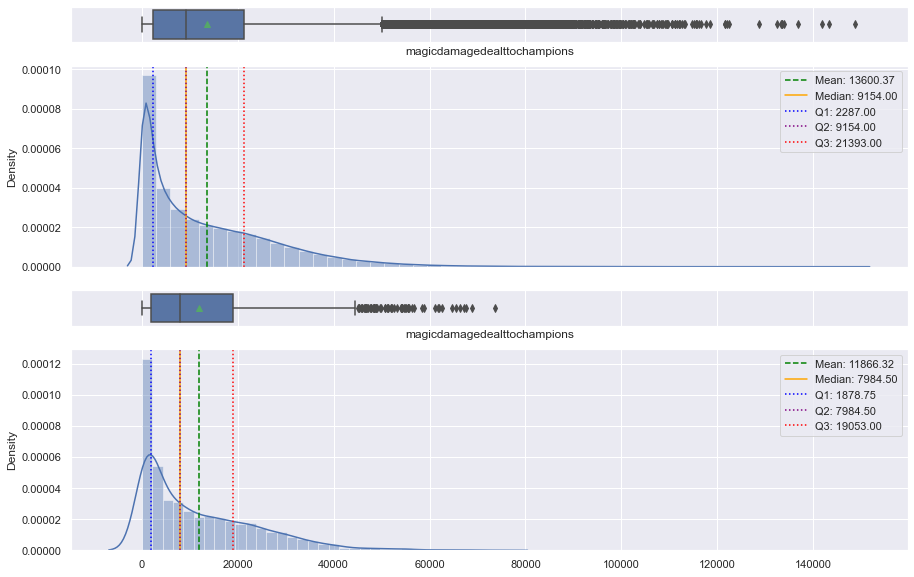

In [97]:
compare_hist_box(df, filtered_df, 'magicdamagedealttochampions', 'magicdamagedealttochampions')

In [161]:
statistic, p_value, conclusion = mann_whitney_test(df, filtered_df, 'magicdamagedealttochampions', alpha=0.05)
print(statistic)
print(p_value)
print(conclusion)

1163500301.0
1.373172502770391e-09
There is a statistically significant difference between the two groups.


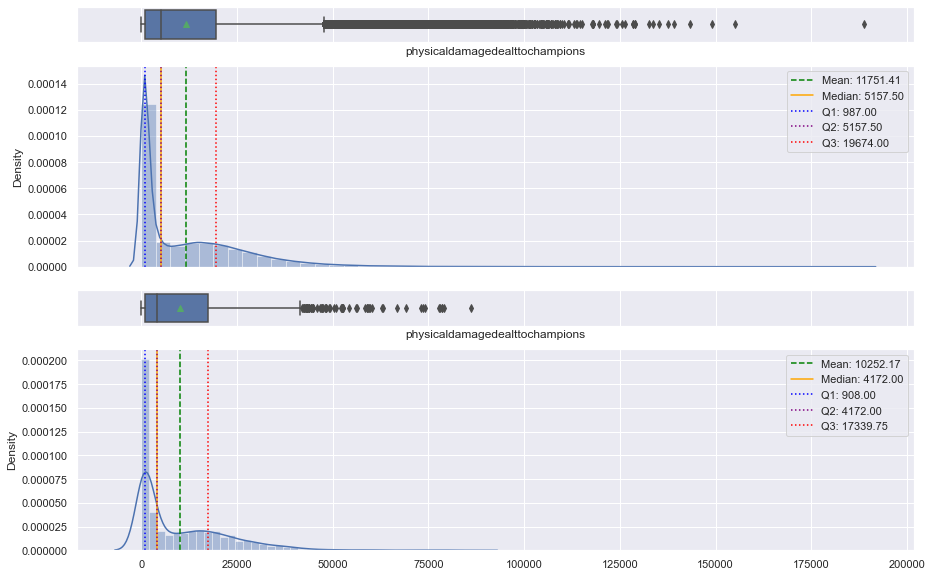

In [99]:
compare_hist_box(df, filtered_df, 'physicaldamagedealttochampions', 'physicaldamagedealttochampions')

In [162]:
statistic, p_value, conclusion = mann_whitney_test(df, filtered_df, 'physicaldamagedealttochampions', alpha=0.05)
print(statistic)
print(p_value)
print(conclusion)

1154486173.5
2.7811598915032835e-07
There is a statistically significant difference between the two groups.


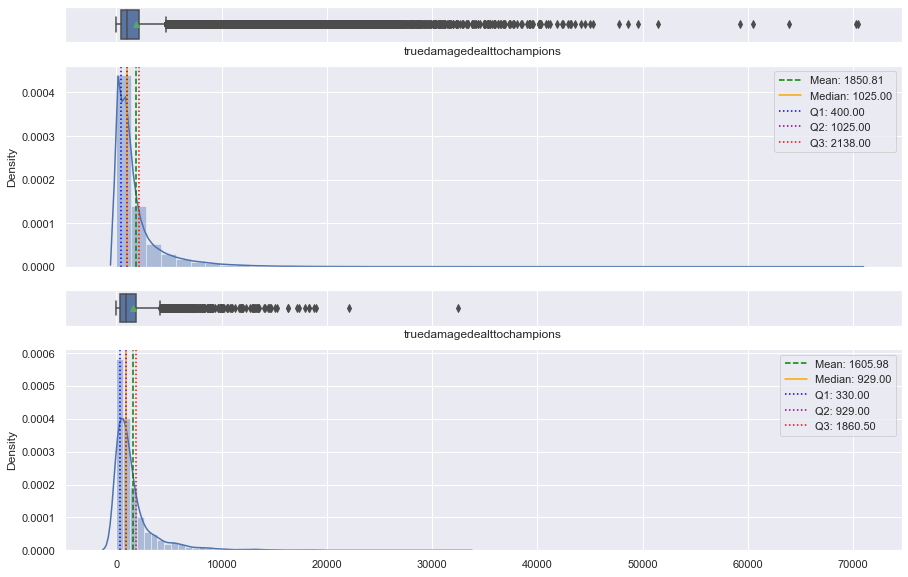

In [102]:
compare_hist_box(df, filtered_df, 'truedamagedealttochampions', 'truedamagedealttochampions')

In [163]:
statistic, p_value, conclusion = mann_whitney_test(df, filtered_df, 'truedamagedealttochampions', alpha=0.05)
print(statistic)
print(p_value)
print(conclusion)

1167722125.0
8.143471761270915e-11
There is a statistically significant difference between the two groups.


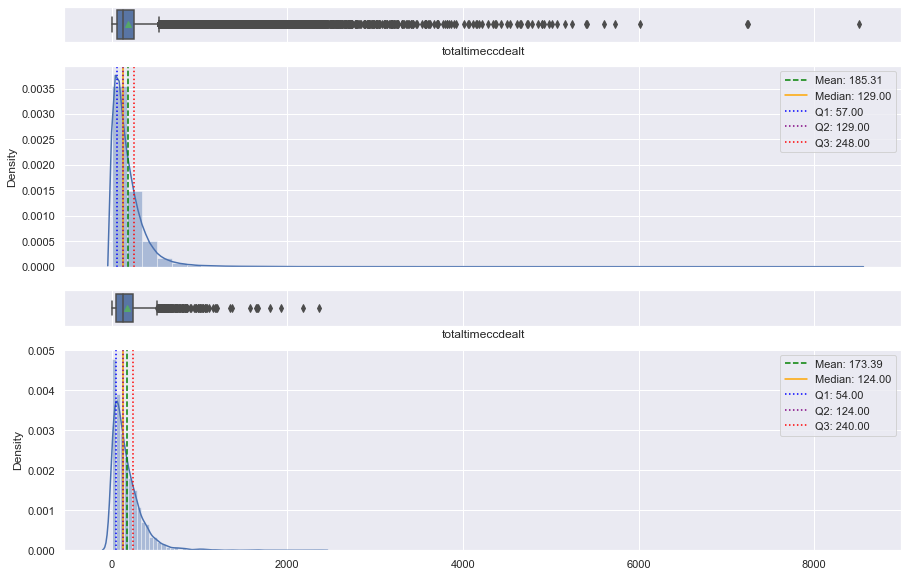

In [104]:
compare_hist_box(df, filtered_df, 'totaltimeccdealt', 'totaltimeccdealt')

In [164]:
statistic, p_value, conclusion = mann_whitney_test(df, filtered_df, 'totaltimeccdealt', alpha=0.05)
print(statistic)
print(p_value)
print(conclusion)

1127890996.0
0.01539880266073666
There is a statistically significant difference between the two groups.


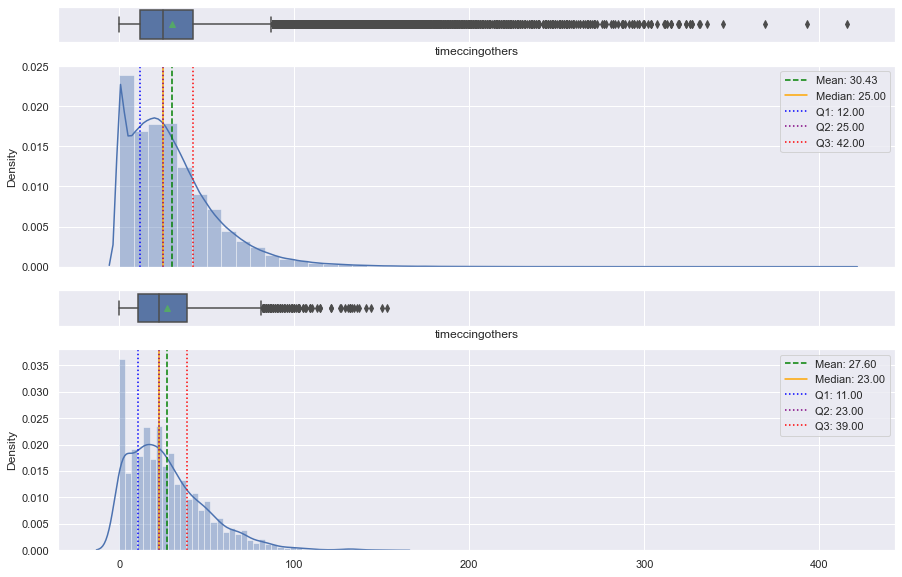

In [106]:
compare_hist_box(df, filtered_df, 'timeccingothers', 'timeccingothers')

In [165]:
statistic, p_value, conclusion = mann_whitney_test(df, filtered_df, 'timeccingothers', alpha=0.05)
print(statistic)
print(p_value)
print(conclusion)

1156288884.5
1.0208239521616333e-07
There is a statistically significant difference between the two groups.


**Observations:**
- When looking at the two populations and using the U-test to compare them we see that all variables (kills, deaths, assists, game_duration_minutes, damage dealt) we see that all p values are less that 0.05 indicating these populations are statically different from one another.
- Most if not all the plots seem to have very similar distributions with them being right skewed but also in how they are distrabuted looks very sismilar.
- Magic damage is still the largest type of damage, followed by physical damage, then true damage last
- My solo q games are on average less than the median of the general games in all categories such as kills, game length, deaths.

# My Friends Games

## Gather Games

In [191]:
def get_games_with_friends(df, player, friend_names):
    """
    Filters the DataFrame to gather games where the player (name) and at least one of their friends are in the same game.

    Args:
        df (pd.DataFrame): The DataFrame containing the data.
        name (str): The name of the player.
        friend_names (list): List of friend names.

    Returns:
        pd.DataFrame: A DataFrame containing rows for games where the player and at least one friend are in the same game.
    """
    # Filter games where the player (name) is present
    player_matches = df[df['summoner_name'] == player]['match_id'].unique()

    # Filter games where at least one friend is present
    friend_matches = df[df['summoner_name'].isin(friend_names)]['match_id'].unique()

    # Find the intersection of matches
    common_matches = set(player_matches) & set(friend_matches)

    # Filter the DataFrame to include only rows with common match_ids
    filtered_df = df[df['match_id'].isin(common_matches)]

    return filtered_df

In [192]:
summoner_name = 'shade20'
friends_names = ['i reformed gg', 'taran', 'treebéard', 'poppa flores', 'thedeadchicken', 'ronzoni', 'riot slickstoat', 'send gromp nudes', 'shepherdofsheep']  

friends_games = get_games_with_friends(df, summoner_name, friends_names)

In [193]:
friends_games['summoner_name'].value_counts()

shade20          924
taran            574
treebéard        446
ronzoni          355
i reformed gg    284
                ... 
dechenz            1
snailplant         1
clushnikov         1
willixir           1
mr xh              1
Name: summoner_name, Length: 5394, dtype: int64

In [194]:
friends_games.head()

,puuid,match_id,assists,baronkills,bountylevel,champexperience,champlevel,championid,championname,championtransform,consumablespurchased,damagedealttobuildings,damagedealttoobjectives,damagedealttoturrets,damageselfmitigated,deaths,detectorwardsplaced,doublekills,dragonkills,firstbloodassist,firstbloodkill,firsttowerassist,firsttowerkill,gameendedinearlysurrender,gameendedinsurrender,goldearned,goldspent,individualposition,inhibitorkills,inhibitortakedowns,inhibitorslost,item0,item1,item2,item3,item4,item5,item6,itemspurchased,killingsprees,kills,lane,largestcriticalstrike,largestkillingspree,largestmultikill,longesttimespentliving,magicdamagedealt,magicdamagedealttochampions,magicdamagetaken,neutralminionskilled,nexuskills,nexustakedowns,nexuslost,objectivesstolen,objectivesstolenassists,participantid,pentakills,physicaldamagedealt,physicaldamagedealttochampions,physicaldamagetaken,profileicon,quadrakills,riotidname,riotidtagline,champion_role,sightwardsboughtingame,spell1casts,spell2casts,spell3casts,spell4casts,summoner1casts,summoner1id,summoner2casts,summoner2id,summonerid,summonerlevel,summonername,teamearlysurrendered,teamid,teamposition,timeccingothers,timeplayed,totaldamagedealt,totaldamagedealttochampions,totaldamageshieldedonteammates,totaldamagetaken,totalheal,totalhealsonteammates,totalminionskilled,totaltimeccdealt,totaltimespentdead,totalunitshealed,triplekills,truedamagedealt,truedamagedealttochampions,truedamagetaken,turretkills,turrettakedowns,turretslost,unrealkills,visionscore,visionwardsboughtingame,wardskilled,wardsplaced,win,summoner_name,dataversion,game_creation,game_end_time_stamp,game_id,game_mode,game_name,game_start_time_stamp,game_type,game_version,map_id,platform_id,queue_id,winning_team_id,losing_team_id,game_duration_minutes,0,1,2,3,4,5,6,7,8,9
5,NihBgpQsrCcnk-cNOPjx12FEutd_Nln-38TZNRKhSVKUbb...,NA1_4526927215,0,0,0,1270,4,119,Draven,False,0,0,0,0,0,0,0,0,0,False,False,False,False,True,False,1775,0,Invalid,0,0,0,0,0,0,0,0,0,2052,0,0,0,NONE,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,578,0,,,SUPPORT,0,0,0,0,0,0,32,0,4,Tw3ok2Vr01yiH6uI8FSGlNk91dksnwvxknoxgblj8oIMnWc,124,thedeadchicken,True,100,,0,122,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,False,thedeadchicken,2,1671794455171,2022-12-23 03:29:59.174000,4526927215,ARAM,teambuilder-match-4526927215,2022-12-23 03:27:57.120000,MATCHED_GAME,12.23.483.5208,12,NA1,450,200,100,2.033333,Y7r8oesFeyYvD9O689uJ2tK8g4U9o19uziCaFFvlDn6upz...,wzGJp7Vprk1SsmbflPOb7X-FA0wm52_oPXmUISvOU6GaZR...,NihBgpQsrCcnk-cNOPjx12FEutd_Nln-38TZNRKhSVKUbb...,OhCgcjeHlnVNePI2CYCa5Ar3mtCZyJiXMDJhrGtmQeqpQr...,lXMl8xJPPZJlHxu-HmwLlPeUr9d1vQuNsz2jdt8FovMfS3...,xbt8ZVydwpQRmnKt_YIhJy_OwLPlqCCVHebp3nuJspHz9i...,9EtvSRrA7p5kXMTQa8sZq-u_7Ffrn6_LHNb_OHzuzwFv79...,_CIVT_ODSxehkzVdGGM3EjfnEZqxGpXlrdw9enzfyrgC7u...,UpRZlmF3S1BU8UTmplyH3HhYF0RXSZvXWj7Yid61ay1iAe...,7S9Vpp9fjeHQlLHK69QLvUhwwucWV4pBZXV-KsrV54k73k...
7,NihBgpQsrCcnk-cNOPjx12FEutd_Nln-38TZNRKhSVKUbb...,NA1_4524083633,25,0,0,15583,16,89,Leona,False,1,75,75,75,38463,11,0,0,0,True,False,False,False,False,False,10173,9700,Invalid,0,0,2,2051,3084,3111,3068,3076,1011,2052,22,0,4,NONE,1,0,1,153,20374,5160,16466,0,0,0,1,0,0,9,0,6957,4301,18678,578,0,,,SUPPORT,0,46,22,41,10,2,4,10,32,Tw3ok2Vr01yiH6uI8FSGlNk91dksnwvxknoxgblj8oIMnWc,123,thedeadchicken,False,200,,69,1052,27831,9711,0,37674,2437,1214,11,129,253,5,0,500,250,2529,0,1,4,0,0,0,0,0,False,thedeadchicken,2,1671525504620,2022-12-20 00:59:11.845000,4524083633,ARAM,teambuilder-match-4524083633,2022-12-20 00:41:39.227000,MATCHED_GAME,12.23.483.5208,12,NA1,450,100,200,17.533333,MGk8YN6gY4hKdL6z7U9WW2sru53tPiaDzu612JMTipUCJi...,cj6uTuDQ0ATIBDvN5aGJqb-94bJOnzqvky00T-32ChGCn3...,Vj6dyKrABWYdmssWjA41qc4nanBODTRXinUZiIotx4Vb5s...,EzaRDLij41TH10wxy9aU8yaQRedqfq2LTX27YYT8ltSRop...,ioMEdKmopXBOf-RKM1sUOPgIEMpnjVMdgSeDexqiPABmGx...,wx3u-0jO3_f9hRPKFwZ3cVeJVMrI6rARsxh7Xb5jojXAEd...,9Q5_x4qKH97qhlJfxW28fQmD9wan7iOVoa16J_s5W6nPft...,wzGJp7Vprk1SsmbflPOb7X-FA0wm52_oPXmUISvOU6GaZR...,NihBgpQsrCcnk-cNOPjx1

## Univariable Analysis

In [196]:
def compare_hist_box(df1, df2, df3, col1, col2, col3):
    f, (ax_box1, ax_hist1, ax_box2, ax_hist2, ax_box3, ax_hist3) = plt.subplots(
        6, sharex=True, 
        gridspec_kw={'height_ratios': (0.15, 0.85, 0.15, 0.85, 0.15, 0.85)}, 
        figsize=(15, 15)
    )
    sns.set(style='darkgrid')

    # Adding box plots and histograms for df1[col1]
    sns.boxplot(x=df1[col1], ax=ax_box1, showmeans=True)
    sns.distplot(x=df1[col1], ax=ax_hist1)
    mean_val1 = df1[col1].mean()
    median_val1 = df1[col1].median()
    std_val1 = df1[col1].std()
    q1_val1 = df1[col1].quantile(0.25)
    q2_val1 = df1[col1].quantile(0.5)
    q3_val1 = df1[col1].quantile(0.75)

    ax_hist1.axvline(mean_val1, color='green', linestyle='--', label=f'Mean: {mean_val1:.2f}')
    ax_hist1.axvline(median_val1, color='orange', linestyle='-', label=f'Median: {median_val1:.2f}')
    ax_hist1.axvline(q1_val1, color='blue', linestyle=':', label=f'Q1: {q1_val1:.2f}')
    ax_hist1.axvline(q2_val1, color='purple', linestyle=':', label=f'Q2: {q2_val1:.2f}')
    ax_hist1.axvline(q3_val1, color='red', linestyle=':', label=f'Q3: {q3_val1:.2f}')

    # Adding box plots and histograms for df2[col2]
    sns.boxplot(x=df2[col2], ax=ax_box2, showmeans=True)
    sns.distplot(x=df2[col2], ax=ax_hist2)
    mean_val2 = df2[col2].mean()
    median_val2 = df2[col2].median()
    std_val2 = df2[col2].std()
    q1_val2 = df2[col2].quantile(0.25)
    q2_val2 = df2[col2].quantile(0.5)
    q3_val2 = df2[col2].quantile(0.75)

    ax_hist2.axvline(mean_val2, color='green', linestyle='--', label=f'Mean: {mean_val2:.2f}')
    ax_hist2.axvline(median_val2, color='orange', linestyle='-', label=f'Median: {median_val2:.2f}')
    ax_hist2.axvline(q1_val2, color='blue', linestyle=':', label=f'Q1: {q1_val2:.2f}')
    ax_hist2.axvline(q2_val2, color='purple', linestyle=':', label=f'Q2: {q2_val2:.2f}')
    ax_hist2.axvline(q3_val2, color='red', linestyle=':', label=f'Q3: {q3_val2:.2f}')

    # Adding box plots and histograms for df3[col3]
    sns.boxplot(x=df3[col3], ax=ax_box3, showmeans=True)
    sns.distplot(x=df3[col3], ax=ax_hist3)
    mean_val3 = df3[col3].mean()
    median_val3 = df3[col3].median()
    std_val3 = df3[col3].std()
    q1_val3 = df3[col3].quantile(0.25)
    q2_val3 = df3[col3].quantile(0.5)
    q3_val3 = df3[col3].quantile(0.75)

    ax_hist3.axvline(mean_val3, color='green', linestyle='--', label=f'Mean: {mean_val3:.2f}')
    ax_hist3.axvline(median_val3, color='orange', linestyle='-', label=f'Median: {median_val3:.2f}')
    ax_hist3.axvline(q1_val3, color='blue', linestyle=':', label=f'Q1: {q1_val3:.2f}')
    ax_hist3.axvline(q2_val3, color='purple', linestyle=':', label=f'Q2: {q2_val3:.2f}')
    ax_hist3.axvline(q3_val3, color='red', linestyle=':', label=f'Q3: {q3_val3:.2f}')

    ax_hist1.legend()
    ax_hist2.legend()
    ax_hist3.legend()

    plt.show()

In [203]:
def mann_whitney_test_3(df1, df2, df3, column, alpha=0.05):
    """
    Performs Mann-Whitney U tests to compare three DataFrames on a specific column.

    Parameters:
    - df1, df2, df3: The three DataFrames containing the data to compare.
    - column: The name of the column to compare.
    - alpha: The significance level for hypothesis testing (default is 0.05).

    Returns:
    - A dictionary with the results for comparisons between df3 and df1, and between df3 and df2.
    - Each result is a tuple containing (U statistic, p-value, conclusion).
    """
    
    results = {}
    
    # Compare df3 with df1
    statistic1, p_value1 = stats.mannwhitneyu(df3[column], df1[column], alternative='two-sided')
    conclusion1 = "There is a statistically significant difference between the two groups." if p_value1 < alpha else "There is no statistically significant difference between the two groups."
    results["Comparison between df3 and df1"] = (statistic1, p_value1, conclusion1)
    
    # Compare df3 with df2
    statistic2, p_value2 = stats.mannwhitneyu(df3[column], df2[column], alternative='two-sided')
    conclusion2 = "There is a statistically significant difference between the two groups." if p_value2 < alpha else "There is no statistically significant difference between the two groups."
    results["Comparison between df3 and df2"] = (statistic2, p_value2, conclusion2)
    
    return results

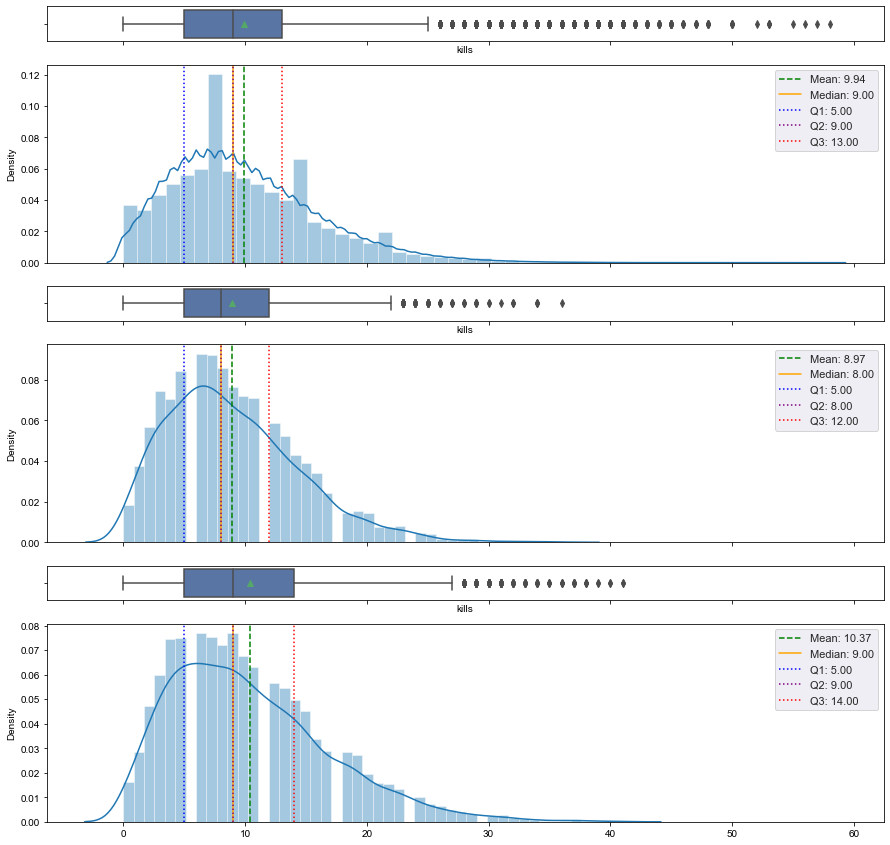

In [197]:
compare_hist_box(df, filtered_df, friends_games, 'kills', 'kills', 'kills')

In [204]:
mann_whitney_test_3(df, filtered_df, friends_games, 'kills', alpha=0.05)

{'Comparison between df3 and df1': (2455627646.5,
  4.5195014663707e-06,
  'There is a statistically significant difference between the two groups.'),
 'Comparison between df3 and df2': (21905308.0,
  4.279313458624053e-25,
  'There is a statistically significant difference between the two groups.')}

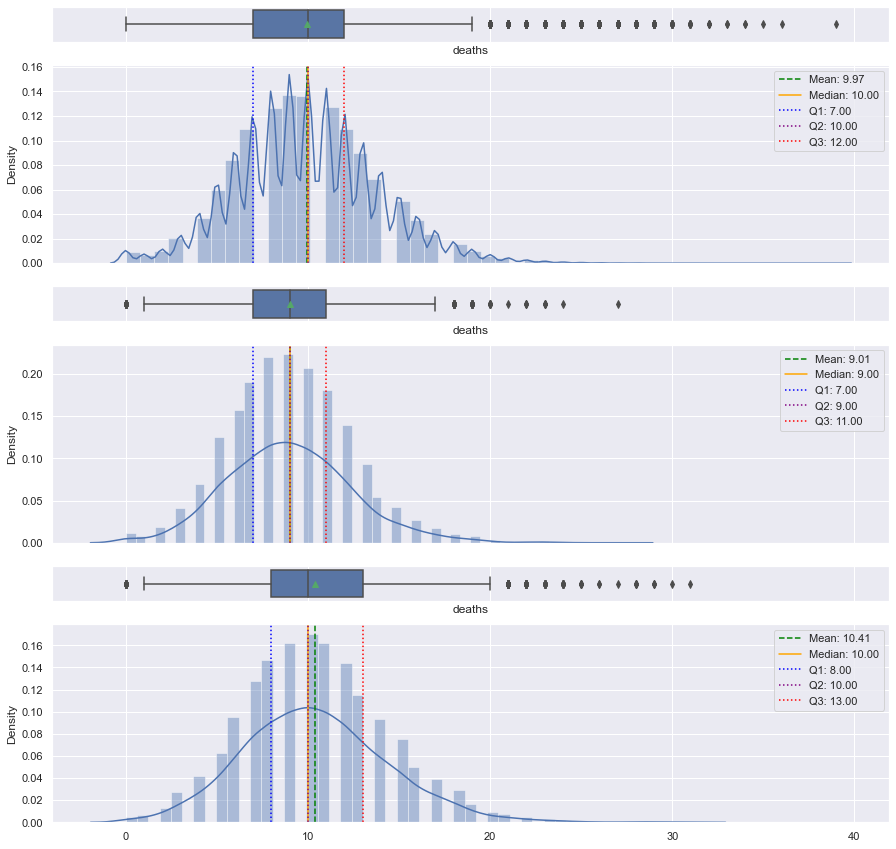

In [205]:
compare_hist_box(df, filtered_df, friends_games, 'deaths', 'deaths', 'deaths')

In [207]:
mann_whitney_test_3(df, filtered_df, friends_games, 'deaths', alpha=0.05)

{'Comparison between df3 and df1': (2530537255.5,
  1.3000239413380487e-22,
  'There is a statistically significant difference between the two groups.'),
 'Comparison between df3 and df2': (23815629.5,
  2.327631211197248e-84,
  'There is a statistically significant difference between the two groups.')}

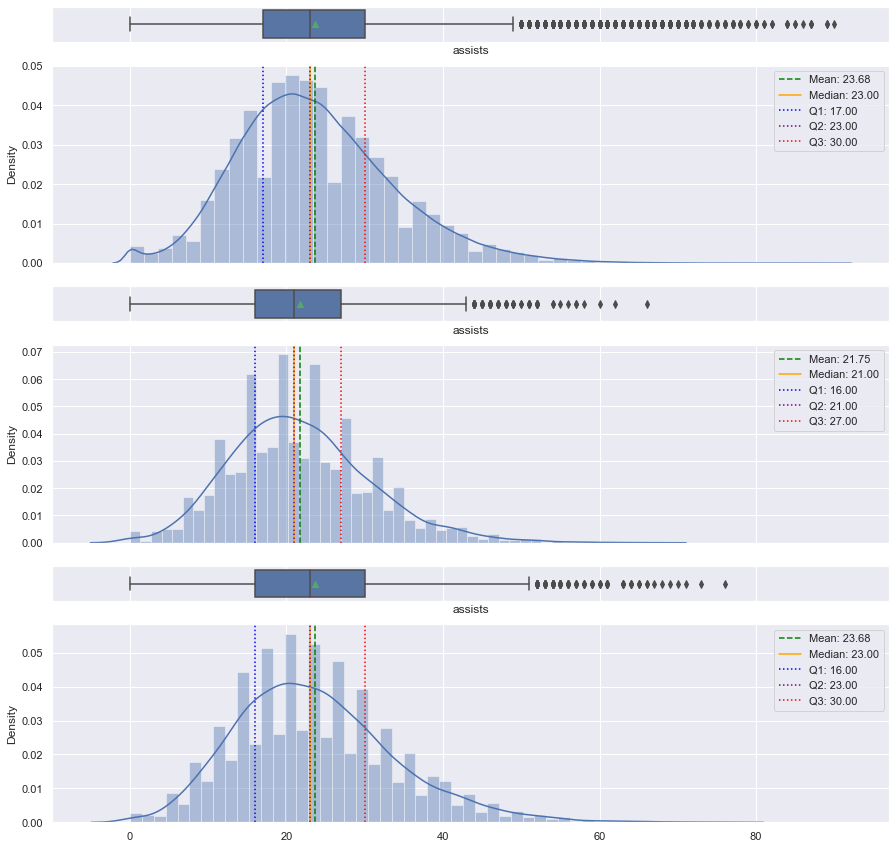

In [208]:
compare_hist_box(df, filtered_df, friends_games, 'assists', 'assists', 'assists')

In [209]:
mann_whitney_test_3(df, filtered_df, friends_games, 'assists', alpha=0.05)

{'Comparison between df3 and df1': (2376752621.0,
  0.3849439254942869,
  'There is no statistically significant difference between the two groups.'),
 'Comparison between df3 and df2': (21760468.5,
  4.857122961420194e-22,
  'There is a statistically significant difference between the two groups.')}

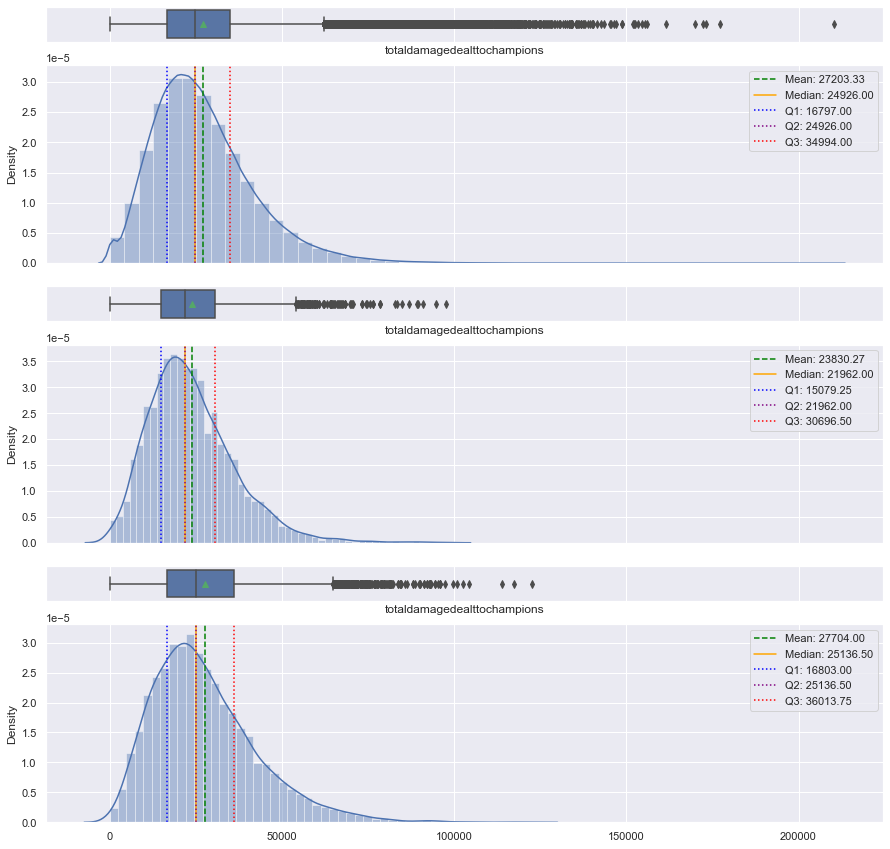

In [210]:
compare_hist_box(df, filtered_df, friends_games, 'totaldamagedealttochampions', 'totaldamagedealttochampions', 'totaldamagedealttochampions')

In [211]:
mann_whitney_test_3(df, filtered_df, friends_games, 'totaldamagedealttochampions', alpha=0.05)

{'Comparison between df3 and df1': (2420264021.5,
  0.03260922780551027,
  'There is a statistically significant difference between the two groups.'),
 'Comparison between df3 and df2': (22499244.0,
  1.6747629259228092e-39,
  'There is a statistically significant difference between the two groups.')}

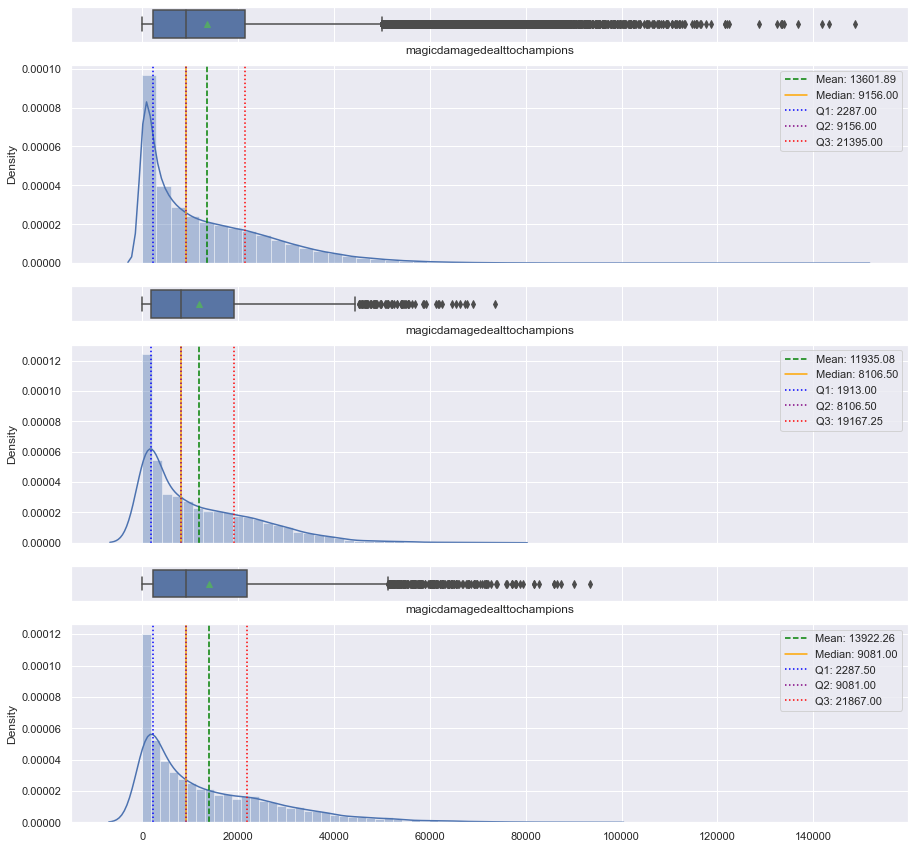

In [213]:
compare_hist_box(df, filtered_df, friends_games, 'magicdamagedealttochampions', 'magicdamagedealttochampions', 'magicdamagedealttochampions')

In [212]:
mann_whitney_test_3(df, filtered_df, friends_games, 'magicdamagedealttochampions', alpha=0.05)

{'Comparison between df3 and df1': (2399033073.0,
  0.5024983801203571,
  'There is no statistically significant difference between the two groups.'),
 'Comparison between df3 and df2': (20856243.0,
  8.481016906539294e-08,
  'There is a statistically significant difference between the two groups.')}